In [1]:
from pathlib import Path
import nibabel as nib
import numpy as np
import os
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from cmath import phase
# from numpy.linalg import eig as eigenvectors
import pandas as pd
from datetime import date
import random
import matplotlib as mpl
import pickle
import scipy
import mat73
# from statannotations.Annotator import Annotator
import seaborn as sns

from numpy.linalg import eigh as eigenvectors #compute real eigenvec and eigenvals (only for symmetric or Hermitian matrices)
from scipy.sparse.linalg import eigsh # BAD - but I don't know why
import networkx as nx
from sklearn import linear_model

# PCA
from sklearn.decomposition import PCA
import pandas as pd

# K-MEANS
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.mixture import GaussianMixture
from scipy.stats import multivariate_normal as mvn
from sklearn.preprocessing import MinMaxScaler

# Stat test
from scipy.stats import ttest_ind, ttest_1samp, pearsonr
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Similaritys
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import euclidean
import sklearn

# Normalization
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy.spatial import distance

# from nilearn import plotting
from scipy.cluster.vq import vq
from numpy.linalg import norm

import pingouin as pg
import statannotations
from statannotations.Annotator import Annotator

In [2]:
sns.__version__

'0.11.2'

In [3]:
# !pip uninstall seaborn
# !pip install seaborn==0.12.2
# # !pip install seaborn==0.13.2

In [4]:
# Get data path
cwd = Path(os.getcwd())
pardir = str(cwd.parent.absolute())
projdir = os.path.dirname(pardir)
projdir = os.path.dirname(projdir)
pardir, projdir

('/home/alessio/projects/Blindsight_LEIDA', '/home/alessio')

In [5]:
# check values for stats in Cohen's d

def cohen(x,y):
    d = (np.mean(x) - np.mean(y))/(np.sqrt((np.std(x)**2 + np.std(y)**2)/2))
    return d

def annotate_D(pairs, metric, data):
    thr_low = 1.5
    thr_high = 2
    stats_res = {} # Cohen's D between all pairs
    cohen_vals = []
    for p in pairs:
        n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
        n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
        cohen_vals.append(cohen(n1,n2))

    stats_res['Effect Size'] = cohen_vals

    new_p = []
    
    for es in enumerate(stats_res['Effect Size']):
        if abs(es[1]) >= thr_high:
            new_p.append(0.01)
        elif abs(es[1]) >= thr_low:
            new_p.append(0.05)
        else:
            new_p.append(1)

    stats_res['p_val'] = new_p
    
    return stats_res['p_val']

In [6]:
# Some metrics
def graph_metrics(METRIC, graph):
    edges_full = 345*345
    if METRIC=='number_connected_components':
        metric = nx.number_connected_components(graph) # number of connected components
    elif METRIC=='size_giant_component':
        metric = len(sorted(nx.connected_components(graph), key=len, reverse=True)[0]) # size giant component
    elif METRIC=='average_shortest_path':
        GiantComponent = graph.subgraph(max(nx.connected_components(graph), key=len)).copy()                    
        metric = nx.average_shortest_path_length(GiantComponent) # Average shortest path inside the giant component
    elif METRIC=='global_average_shortest_path':
        sps = [list(nx.shortest_path_length(graph.subgraph(cc).copy())) for cc in nx.connected_components(graph)]
        global_sps = []
        for sp in sps:
            for l in sp:
                global_sps += list(l[1].values())
        metric = np.mean(global_sps) # Average shortest path (global)
    elif METRIC=='fraction_of_edges':
        edges = graph.number_of_edges()
        metric = edges/edges_full # fraction of remaining edges inside the graph
    elif METRIC=='node_wih_link':
        nodes = len([n for n in graph.nodes if len(list(graph.neighbors(n))) > 0])
        metric = nodes/nodes_full # node with at least a link
    #                 centr = nx.betweenness_centrality(GiantComponent)
    #                 max_centr_key = max(centr, key=centr.get)
    #                 max_centr = centr[max_centr_key]
    #                 metric = max_centr
    #                 metric = nx.betweenness_centrality(graph)[node] # centrality of a selected node
    #             print(metric)
    elif METRIC=='degree_distribution':
        d = sorted((d for n, d in graph.degree() if d!=0), reverse=True) # degree distribution
    elif METRIC=='average_degree':
        metric = np.mean([d for n, d in graph.degree() if d!=0])
    elif METRIC=='average_local_efficiency':
        metric = nx.local_efficiency(graph)
    elif METRIC=='global_efficiency':
        metric = nx.global_efficiency(graph)
    elif METRIC=='local_efficiency_notav':
        metric = [nx.global_efficiency(graph.subgraph(graph[v])) for v in graph]
    elif METRIC=='betweeness_centrality':
        metric = np.asarray(list(nx.betweenness_centrality(graph).values()))
    elif METRIC=='eigenvector_centrality':
        metric = np.asarray(list(nx.eigenvector_centrality(graph).values()))
    return metric

In [7]:
# Reconstruct full matrix from flattened upper triangle
def utri2mat(utri):
    n = int(-1 + np.sqrt(1 + 8*len(utri))) // 2
    iu1 = np.triu_indices(n)
    ret = np.empty((n, n))
    ret[iu1] = utri
    ret.T[iu1] = utri
    return ret

In [8]:
# def cohens_d(group1, group2):
#     # Mean and standard deviation for each group
#     mean1, mean2 = np.mean(group1), np.mean(group2)
#     sd1, sd2 = np.std(group1, ddof=1), np.std(group2, ddof=1)
    
#     # Size for each group
#     n1, n2 = len(group1), len(group2)
    
#     # Calculate the pooled standard deviation
#     pooled_sd = np.sqrt(((n1-1) * sd1*2 + (n2-1) * sd2*2) / (n1 + n2 - 2))
    
#     # Calculate Cohen's d
#     d = (mean1 - mean2) / pooled_sd
#     return d

In [9]:
def mov_av_smooth(x,y,win):
    x_=win
    y_=[]
    while(x_<np.asarray(x).shape[0]):
        y_.append(np.mean(y[x_-win:x_]))
        x_+=1
    return x[win:][::-1], y_[::-1]

def find_the_min(x_,y_, tol):
    y_prev = y_[0]
    y_min = y_prev
    x_min = x_[0]
    for i,y__ in enumerate(y_[1:]):
        if y__+tol<y_prev:
            # print(x_[i])
            y_min = y__
            x_min = x_[i]
        y_prev = y__
    return x_min, y_min

In [10]:
def boool(n, base=4):
    if n-base<=0:
        piera=0
    elif n-base>0:
        piera=1
    return piera

## Load atlas

In [11]:
# Shafer
path = pardir+'/data/atlas/schafer/Schaefer2018_200Parcels_Kong2022_17Networks_AND_Tian_Subcortex_S2_3T_AND_SC_2.4mm.nii.gz'
path_lab = pardir+'/data/atlas/schafer/Schaefer2018_200Parcels_Kong2022_17Networks_TIAN_SC_LABELS.csv'
atlas_ = nib.load(path)
atlas = atlas_.get_fdata()
atlas_header = atlas_.header
atlas_affine = atlas_.affine
print(atlas.shape)


atlas_labels = pd.read_csv(path_lab, delimiter=';', header=None)
atlas_labels.rename(columns = {0:'from', 1:'hemisphere',2:'network',3:'super network',4:'area',5:'count'}, inplace = True)
atlas_labels.replace('Diano', 'Tian', inplace=True)
# bastardi = np.unique(atlas_labels[atlas_labels['from']=='Tian']['network'].values)
# for basta in bastardi:
#     atlas_labels.replace(basta, 'subcortical', inplace=True)
# nodes_labels = atlas_labels['area'].values

# n_area = []
# for n,a in zip(atlas_labels['network'].values, atlas_labels['area'].values):
#     n_area.append(n +'-'+a)
# atlas_labels['n_area'] = n_area

atlas_labels

(75, 90, 75)


,from,hemisphere,network,super network,area,count
0,17networks,LH,DefaultA,Default,IPL,1.0
1,17networks,LH,DefaultA,Default,PFCm,1.0
2,17networks,LH,DefaultA,Default,Temp,1.0
3,17networks,LH,DefaultA,Default,Temp,2.0
4,17networks,LH,DefaultA,Default,TempPole,1.0
...,...,...,...,...,...,...
229,Tian,LH,PUT,Subcortical,pPUT,NaN
230,Tian,LH,CAU,Subcortical,aCAU,NaN
231,Tian,LH,CAU,Subcortical,pCAU,NaN
232,Tian,LH,Thal,Subcortical,SC,NaN


In [12]:
# Divides the nodes in macro areas
# Divide areas for network
net = np.unique(atlas_labels['network'].values)
net_idx = {}
net_dic = {} # Area index associated to each macro area (as dictionary keys)
net_list = [] # same as mas_dic, but as a concatenation of list
for ne_idx, ne in enumerate(net):
    net_dic[ne] = atlas_labels.index[atlas_labels['network']==ne].tolist()
    net_list.append(atlas_labels.index[atlas_labels['network']==ne].tolist())

# Divide areas for super network
sup_net = np.unique(atlas_labels['super network'].values)
sup_net_idx = {}
sup_net_dic = {} # Area index associated to each macro area (as dictionary keys)
sup_net_list = [] # same as mas_dic, but as a concatenation of list
for sup_ne_idx, sup_ne in enumerate(sup_net):
    sup_net_dic[sup_ne] = atlas_labels.index[atlas_labels['super network']==sup_ne].tolist()
    sup_net_list.append(atlas_labels.index[atlas_labels['super network']==sup_ne].tolist())

In [13]:
sub_net = np.unique(atlas_labels.loc[atlas_labels['super network']=='Subcortical']['network'].values)

mas_list = {} # nodes belonging to each of the 18 network (indexes of the nodes)
for n in net: # Loop over network
    if n not in sub_net:
        mas_list[n] = atlas_labels.loc[atlas_labels['network']==n].index.values
mas_list['Subcortical'] = atlas_labels.loc[atlas_labels['super network']=='Subcortical'].index.values

mas_dic = {} # keys as supernetwork, number of areas per super network as values
for n in net:
    if n not in sub_net:
        mas_dic[n] = mas_list[n].shape[0]
mas_dic['Subcortical'] = mas_list['Subcortical'].shape[0]

## - Load phase locking matrices

In [14]:
# Vector indicating subject at each time points
path =pardir + '/data/MD_05122023/time_all.pkl'
with open(path, 'rb') as pickle_file:
    time_all = pickle.load(pickle_file)
print(time_all.shape)


(1, 14223)


In [15]:
# # Load flattened upper triangular Phase Locking matrices
# path =pardir + '/data/MD/PL_upper.pkl'
# with open(path, 'rb') as pickle_file:
#     plm = pickle.load(pickle_file)

# print(plm.shape)
# print(utri2mat(plm[0]).shape)

# # Matrices reconstruction
# plm_tc = np.empty((0, utri2mat(plm[0]).shape[0], utri2mat(plm[0]).shape[1]))
# for tp in plm: # loop over time points:
#     plm_tc = np.concatenate((plm_tc, np.expand_dims(utri2mat(tp), axis=0)))
# print(plm_tc.shape)

# # Open a file and use dump()
# path = pardir + '/data/MD/PL_full.pkl'
# with open(path, 'wb') as file:
#     # A new file will be created
#     pickle.dump(plm_tc, file)

In [16]:
# Load full matrix
path =pardir + '/data/MD_05122023/PL.mat'
PL = mat73.loadmat(path)

In [17]:
plm_tc = np.transpose(PL['PL_all_alessio'], (2,0,1))

In [18]:
plm_tc.shape

(14223, 234, 234)

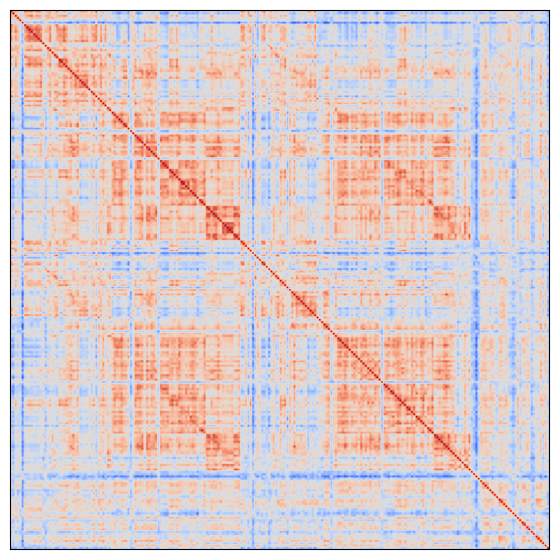

In [33]:
cmap_ = plt.get_cmap('viridis')
fig, axs = plt.subplots(nrows=1, figsize=(21, 7))
im = axs.imshow(plm_tc[0:1000].mean(axis=0), cmap='coolwarm')
axs.set_yticks([])
axs.set_xticks([])
plt.savefig('output/MD_05122023/PL_matrix_mean.png',
            dpi=200)

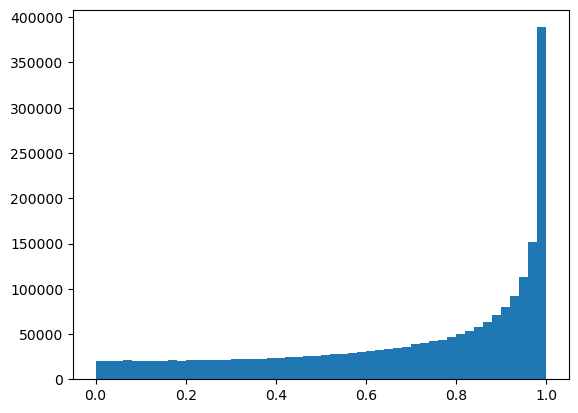

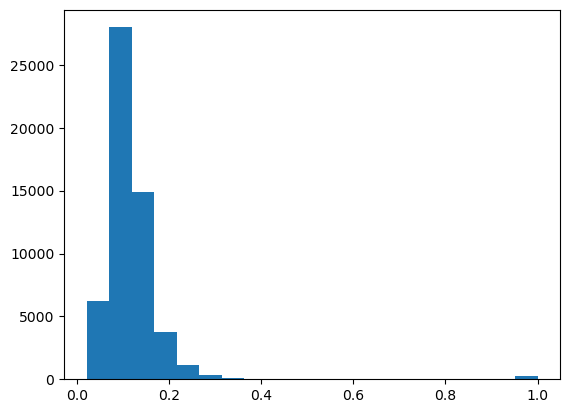

In [26]:
# The phase locking matrices assume values between -1 and 1. When I perform percolation, the threshold has to start from -1
fig = plt.figure()
plt.hist(np.abs(plm_tc[0:40]).flatten(), bins=50);
# plt.hist(np.abs(plm_tc[0:40]).mean(axis=0).flatten(), bins=50);

# PERCHè AVEVO THRESHOLDATO LE MATRICI DI PHASE LOCKING?


ex = np.copy(np.abs(plm_tc[0:600]))
ex[np.where(ex<0.99)] = 0
fig = plt.figure()
plt.hist(ex.mean(axis=0).flatten(), bins=20);

# Load eigenvector decomposition

In [19]:
# Load eigenvectors
path = pardir + '/data/MD_05122023/data_V1.mat'
Ev_ = mat73.loadmat(path)

In [20]:
Ev = Ev_['data']
print(Ev.shape)

(14223, 234)


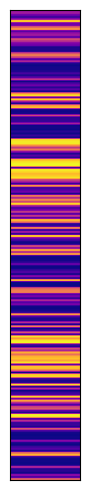

In [21]:
x = [m for m in range(Ev[200].shape[0])]
y = Ev[200]

fig, ax = plt.subplots(nrows=1, figsize=(1,5))

extent = [x[0]-(x[1]-x[0])/2., x[-1]+(x[1]-x[0])/2.,0,1]
ax.imshow(np.expand_dims(y, axis=1), cmap="plasma", aspect="auto", extent=extent)
ax.set_yticks([])
ax.set_xticks([])

ax.set_xlim(extent[0], extent[1])
plt.tight_layout()

# plt.savefig('output/GraphAnal/EigenVector_example.png', dpi=200)


## Subjects classification

In [22]:
classif = pd.read_excel(pardir+'/data/MD_13112023/davide_class_blindsight.xlsx')
# classif.drop(labels='Unnamed: 3', axis=1, inplace=True)
# new = classif['NEW ID'].values
# old = classif['OLD ID'].values
group = classif['CLASS'].values
time_points = int(time_all.shape[1]/len(group))
group_dic = {'C':0, 'B':1, 'NB':2}

groups_num = []
for idx,g in enumerate(['C', 'B', 'NB']):
    groups_num.append(np.sum(group==g))

# Group label for each time point
group_labels = np.empty((0, 1))  # [t*1]
# for c in group:
for c in group:
    cc = group_dic[c]
    sub_lab = np.full((time_points,1), cc)
    group_labels = np.concatenate((group_labels, sub_lab))
print(group_labels.shape)

# # Remove bad subjects
# new_V1 = np.empty((0, n_rois))
# for i in old:
#     m = V1[time_points*i:time_points*(i+1),:]
#     new_V1 = np.concatenate((new_V1, m))
# print(new_V1.shape)

(14223, 1)


In [23]:
np.sum(classif['CLASS']=='B'), np.sum(classif['CLASS']=='NB'), np.sum(classif['CLASS']=='C')  

(8, 8, 17)

# Load K-means results

In [24]:
# state_labels
# path = pardir + '/data/MD_13112023/kmean_leida.mat'
path = pardir + '/data/MD_05122023/clustering_res.mat'
kmeans_leida_ = mat73.loadmat(path)
kmeans_leida = kmeans_leida_['Kmeans_results']
K_max = len(kmeans_leida) + 3

state_labels_list = [] # State indexes for each state
for k_ in range(len(kmeans_leida)): # Loop over number of states
    state_labels_list.append(kmeans_leida[k_]['IDX'])

In [25]:
# K = 6
# k = K - 3
# # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
# state_labels = kmeans_leida[k]['IDX']
# print(state_labels.shape, state_labels.max())
# centroids = kmeans_leida[k]['C']

# Plot the centroids for each K

In [43]:
alpha=1
sn_color = [
          mpl.colors.to_rgba('purple',alpha), #Attention
          mpl.colors.to_rgba('lightblue',alpha), #Auditive
          mpl.colors.to_rgba('green',alpha), #Control  
          mpl.colors.to_rgba('violet',alpha),#Default
          mpl.colors.to_rgba('yellow',alpha), #Language
          mpl.colors.to_rgba('orange',alpha), #Somatomotor
          mpl.colors.to_rgba('gray', alpha),  # Subcortical
          mpl.colors.to_rgba('red',alpha), #Visual
         ]

In [44]:
list(atlas_labels['super network'].unique())

['Default',
 'Language',
 'Control',
 'Attention',
 'Auditory',
 'SomatoMotor',
 'Visual',
 'Subcortical']

In [45]:
sn_count = {}
for sn in list(atlas_labels['super network'].unique()):
    sn_count[sn] = len(atlas_labels.loc[atlas_labels['super network']==sn]['area'].values)
sn_count

{'Default': 38,
 'Language': 8,
 'Control': 40,
 'Attention': 50,
 'Auditory': 9,
 'SomatoMotor': 24,
 'Visual': 31,
 'Subcortical': 34}

In [57]:
for kappone,k_l in enumerate(kmeans_leida): # Loop over states
    # fare un cervellino per ogni centroide
    for state, centroid in enumerate(k_l['C']): # Loop over centroids
        sub_lab = atlas_labels.iloc[np.where(centroid>0)]
        sub_stuff_list= []
        for h,s in zip(sub_lab[sub_lab['super network']=='Subcortical']['hemisphere'].values, \
                       sub_lab[sub_lab['super network']=='Subcortical']['area'].values ):
            sub_stuff_list.append(h+' '+s)
        print('K=',kappone+2,' ','state ', state+1, ' ', sub_stuff_list)

K= 2   state  1   []
K= 2   state  2   ['RH aCAU']
K= 3   state  1   []
K= 3   state  2   ['RH pHIP', 'RH aCAU']
K= 3   state  3   ['RH pGP', 'LH pGP', 'LH aGP']
K= 4   state  1   []
K= 4   state  2   ['RH pHIP', 'RH aCAU', 'LH pCAU']
K= 4   state  3   ['RH pGP', 'LH pGP', 'LH aGP']
K= 4   state  4   ['RH aGP', 'RH SC']
K= 5   state  1   []
K= 5   state  2   ['RH aHIP', 'RH pHIP', 'RH lAMY', 'RH mAMY', 'LH aHIP', 'LH pHIP', 'LH lAMY', 'LH mAMY']
K= 5   state  3   ['RH THA_VA', 'RH aGP', 'RH aCAU', 'RH pCAU', 'LH THA_VA', 'LH aCAU', 'LH pCAU']
K= 5   state  4   ['RH pGP', 'LH pGP', 'LH aGP']
K= 5   state  5   ['RH lAMY', 'RH aGP', 'RH SC']
K= 6   state  1   []
K= 6   state  2   ['RH aHIP', 'RH lAMY', 'RH mAMY', 'LH aHIP', 'LH lAMY', 'LH mAMY']
K= 6   state  3   ['RH pGP', 'LH NAc_shell', 'LH pGP', 'LH aGP']
K= 6   state  4   ['RH aHIP', 'RH pHIP', 'RH lAMY', 'RH mAMY', 'RH THA_DP', 'RH NAc_core', 'RH aCAU', 'LH aHIP', 'LH pHIP', 'LH lAMY', 'LH mAMY']
K= 6   state  5   ['RH THA_VA', 'RH 

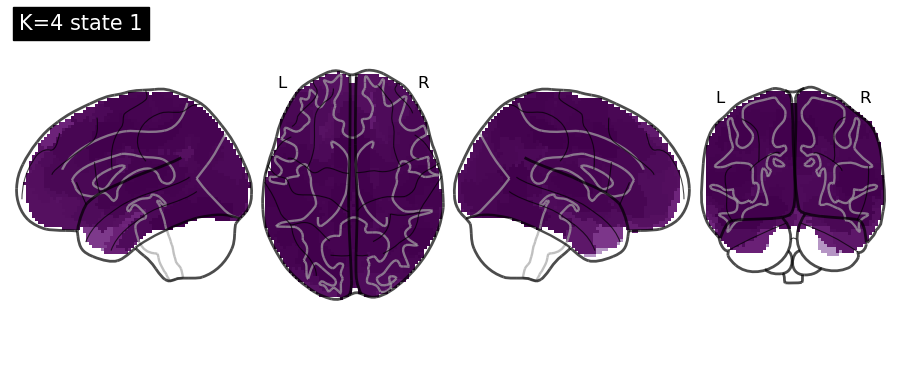

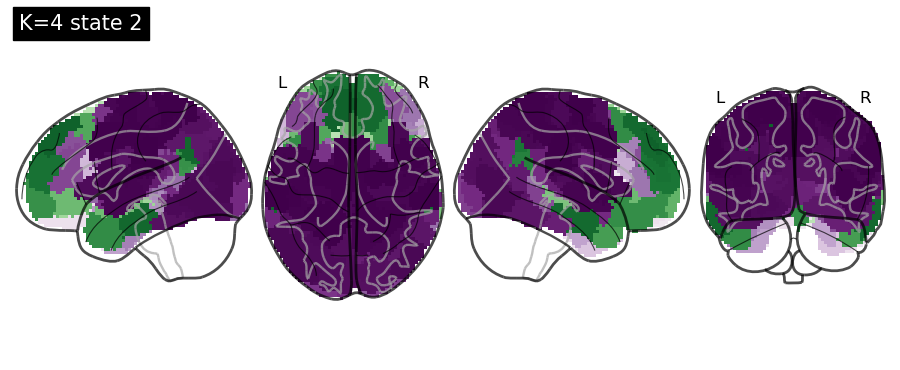

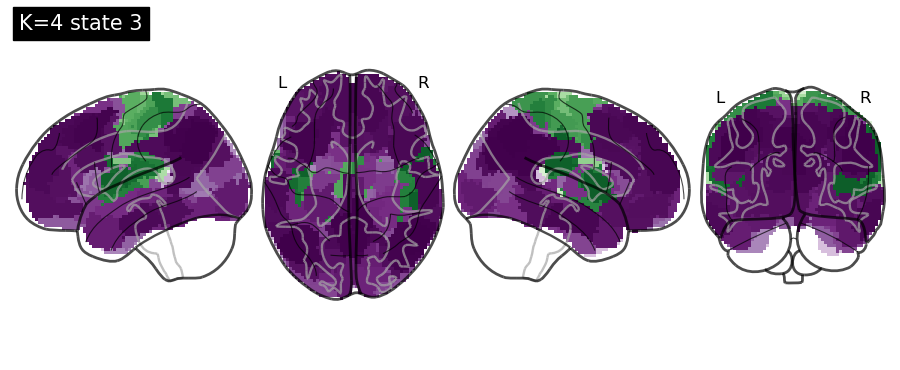

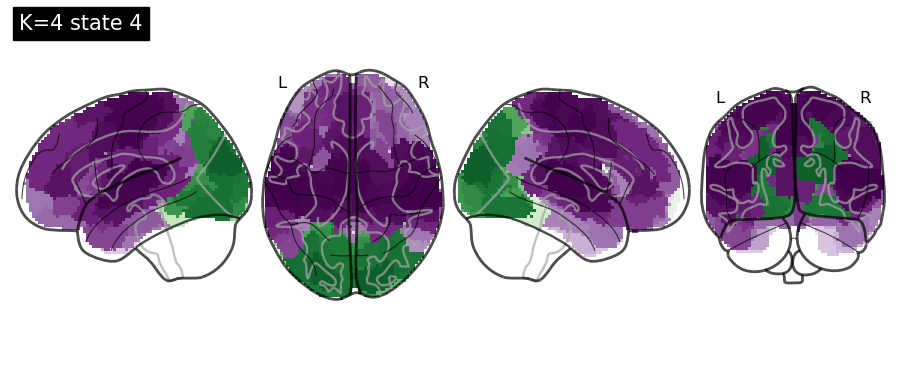

In [49]:
# folder = 'output/MD_05122023/'
from nilearn import plotting

for kappone,k_l in enumerate(kmeans_leida): # Loop over states
    if kappone==2:
        # fare un cervellino per ogni centroide
        for state, centroid in enumerate(k_l['C']): # Loop over centroids
            # Make the cervellino
            blank_brain = np.full(atlas.shape, np.nan)
            for i,a in enumerate(centroid):# Loop over the areas    
                # if a<0:
                #     # print('cane')
                cord = np.where(atlas==i+1) # index in the atlas start from 1
                blank_brain[cord[0], cord[1], cord[2]] = a
    
            b_min = blank_brain.min()
            b_max = blank_brain.max()

            # blank_brain[np.where(blank_brain<0)]=np.nan
            nii_img=nib.Nifti1Image(blank_brain, atlas_affine, atlas_header)
            # plotting.plot_glass_brain(nii_img, display_mode='lzry', black_bg=False, cmap='bwr',
            #                           title='K='+str(kappone+2)+' state '+str(state+1), plot_abs=False, threshold=0)
            plotting.plot_glass_brain(nii_img, display_mode='lzry', black_bg=False, cmap='PRGn',
                                      title='K='+str(kappone+2)+' state '+str(state+1), plot_abs=False, threshold=0)
            plt.savefig('output/MD_05122023_noclustfilt/K'+str(kappone+2)+'/centroid_K_fullbrain_colorized_'+str(kappone+2)+'state_'+str(state+1)+'.png', dpi=300)
    
            # # Make the histogrammini
            # # Count how many areas per network the emergent community has
    
            # # I put in a dic the count area per super noetwork in the emergent community
            # sn_dic = {}
            # for sn in list(atlas_labels['super network'].unique()):
            #     sn_dic[sn] = 0 # Init
            # for i,a in enumerate(centroid):# Loop over the areas  
            #     if a > 0: # If the area belongs to the emergent community
            #         sn_dic[atlas_labels.loc[i]['super network']] += 1
            #         # print(atlas_labels.loc[i]['super network'])
            # # print(sn_dic)
            
            # # I normalize the count for each super network with respect to the total number of areas of each super network 
            # for sn in list(atlas_labels['super network'].unique()):
            #     sn_dic[sn]/=sn_count[sn]
            # # print(sn_dic)
    
            # fig = plt.figure(figsize=(4.5,3))
            # plt.title('Emergent Community - '+'K='+str(kappone+2)+' state '+str(state+1))
            # plt.bar(np.arange(0,len(list(sn_dic.keys()))), list(sn_dic.values()), color=sn_color, tick_label=atlas_labels['super network'].unique())
            # plt.xticks(rotation=45, ha='right')
            # plt.ylabel('areas count')
            # fig.tight_layout()
            # # # plt.savefig(folder+'K'+str(kappone+2)+'/centroid_K'+str(kappone+2)+'state_'+str(state+1)+'_hist.png', dpi=300)
    
        


In [46]:
# Shafer
path = pardir+'/data/lesion/all_lesion_overlapped_2.4mm.nii.gz'
lesion_ = nib.load(path)
lesion = lesion_.get_fdata()
# atlas_header = atlas_.header
# atlas_affine = atlas_.affine
print(lesion.shape)

(75, 90, 75)


<Figure size 640x480 with 0 Axes>

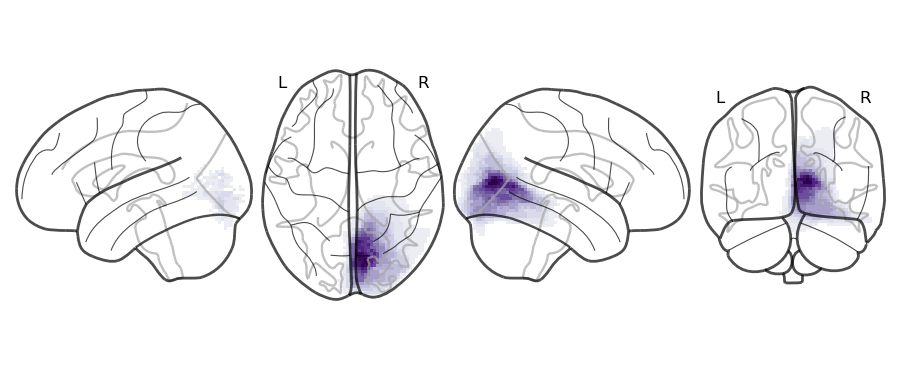

In [54]:
fig = plt.figure()
plotting.plot_glass_brain(lesion_, display_mode='lzry', black_bg=False, cmap='PuOr', threshold=0)
plt.savefig('output/MD_05122023_noclustfilt/lesion.png', dpi=300)


In [44]:
atlas_labels

,from,hemisphere,network,super network,area,count
0,17networks,LH,DefaultA,Default,IPL,1.0
1,17networks,LH,DefaultA,Default,PFCm,1.0
2,17networks,LH,DefaultA,Default,Temp,1.0
3,17networks,LH,DefaultA,Default,Temp,2.0
4,17networks,LH,DefaultA,Default,TempPole,1.0
...,...,...,...,...,...,...
229,Tian,LH,PUT,Subcortical,pPUT,NaN
230,Tian,LH,CAU,Subcortical,aCAU,NaN
231,Tian,LH,CAU,Subcortical,pCAU,NaN
232,Tian,LH,Thal,Subcortical,SC,NaN


## Clustering representation

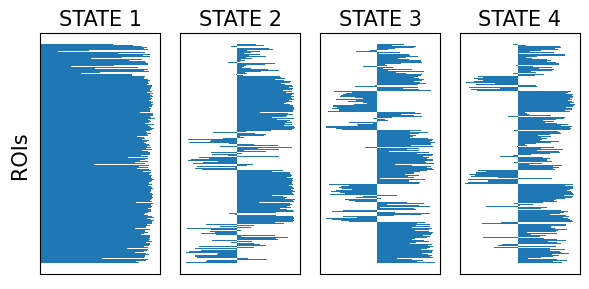

In [76]:
# PLot CENTROIDS
fig, axs = plt.subplots(1,K,figsize=(6,3))
for i in range(K):
    axs[i].set_title('STATE {}' .format(i+1), fontsize=15)
    axs[i].barh(range(centroids[i].shape[0]), -centroids[i], height=1);
#              tick_label=nodes_labels)
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    axs[0].set_ylabel('ROIs', fontsize=15)
fig.tight_layout()   

# plt.savefig('output/GraphAnal/CentroidsRepresentation.png', dpi=200)

In [99]:
neg = np.copy(centroids[k_])
neg[np.where(-centroids[k_]>0)] = 0
pos = np.copy(centroids[k_])
pos[np.where(-centroids[k_]<0)] = 0

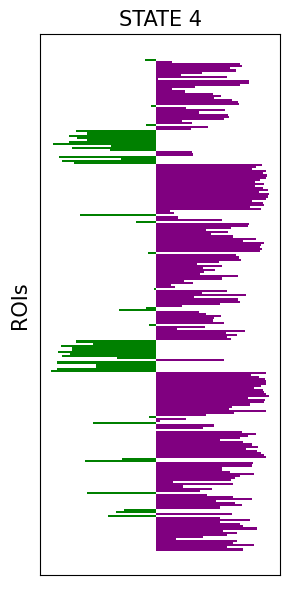

In [102]:
today = date.today()
DATE = today.strftime("%d%m%Y")
# checking if the directory exists or not
if not os.path.exists('output/GraphAnal/'+DATE+'/K'+str(K)):
      
    # if the demo_folder directory is not present 
    # then create it.
    os.makedirs('output/GraphAnal/'+DATE+'/K'+str(K))

# PLot CENTROIDS
fig, ax = plt.subplots(1,figsize=(3,6))
k_ = 4 - 1
ax.set_title('STATE {}' .format(k_+1), fontsize=15)
ax.barh(range(centroids[k_].shape[0]), -centroids[k_], height=1);
#              tick_label=nodes_labels)
ax.barh(range(centroids[k_].shape[0]), -neg, height=1, color='green');
ax.barh(range(centroids[k_].shape[0]), -pos, height=1, color='purple');
ax.set_xticks([])
ax.set_yticks([])
ax.set_ylabel('ROIs', fontsize=15)
fig.tight_layout()   

plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/CentroidsEx_'+DATE+'.png',
            dpi=200)

In [25]:
state_labels

array([2., 2., 2., ..., 6., 6., 5.])

In [26]:
C_embedded = TSNE(n_components=3, learning_rate='auto',
                  init='random', perplexity=2).fit_transform(centroids)

NameError: name 'TSNE' is not defined

NameError: name 'X_embedded' is not defined

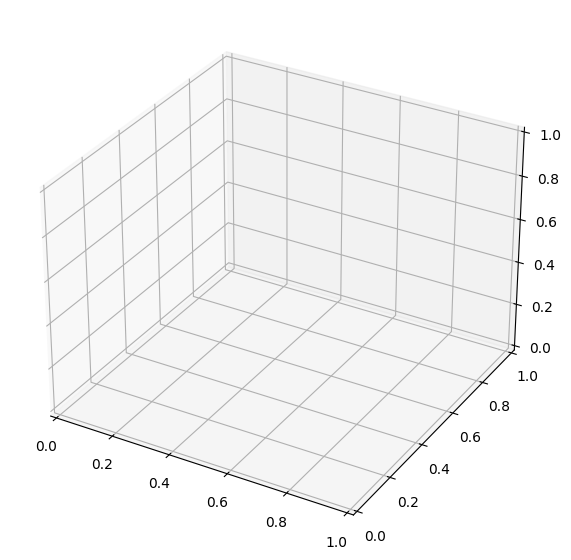

In [27]:
# from sklearn.manifold import TSNE
# X_embedded = TSNE(n_components=3, learning_rate='auto',
#                   init='random', perplexity=3).fit_transform(Ev)

fig = plt.figure(figsize=(8,7))
ax = fig.add_subplot(projection='3d')
ax.scatter(X_embedded[:,0], X_embedded[:,1], X_embedded[:,2], s=0.4, alpha=.5, c=state_labels)
ax.scatter(C_embedded[:,0], C_embedded[:,1], C_embedded[:,2], s=1, alpha=1, c='red')


In [28]:
import matplotlib as mpl

#normalize item number values to colormap
norm = mpl.colors.Normalize(vmin=0, vmax=K)

#colormap possible values = viridis, jet, spectral
colors = [ mpl.cm.nipy_spectral(norm(i)) for i in range(K)] 
colors_dic = {}
for i in range(K):
    colors_dic[i] = colors[i]
colors_series = [colors_dic[tp-1] for tp in state_labels]
    
# colors = 'blue','green','red','black'

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

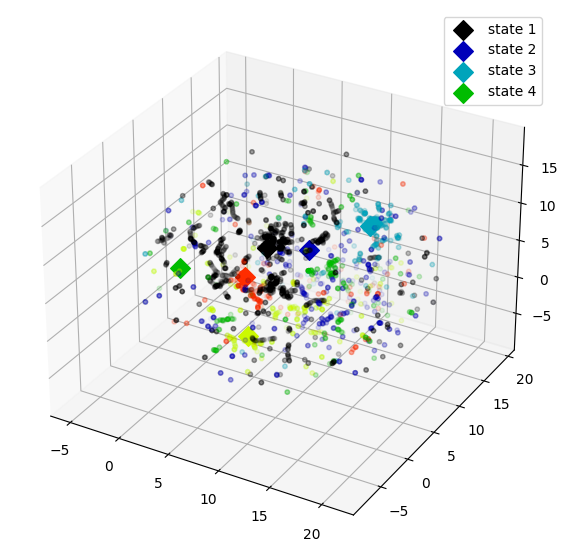

In [29]:
# import umap
fit = umap.UMAP(n_components=3)
X_embedded = fit.fit_transform(Ev, state_labels)
C_embedded = fit.transform(centroids)

# pca = sklearn.decomposition.PCA(n_components=3)
# X_embedded = pca.fit_transform(Ev)
# C_embedded = pca.transform(centroids)

lab = ['state 1', 'state 2', 'state 3','state 4']


# 3D
fig = plt.figure(figsize=(8,7))
ax = fig.add_subplot(projection='3d')
for i in range(K):
    ax.scatter3D(C_embedded[i,0], C_embedded[i,1], C_embedded[i,2], s=100, alpha=1, c=colors[i], marker='D')
plt.legend(lab)
ax.scatter(X_embedded[:,0], X_embedded[:,1], X_embedded[:,2], s=10, alpha=.03, c=colors_series)


# # 2D
# fig = plt.figure(figsize=(8,7))
# for i in range(K):
#     plt.scatter(C_embedded[i,0], C_embedded[i,1], s=80, alpha=1, c=colors[i])
# plt.legend(lab)
# plt.scatter(X_embedded[:,0], X_embedded[:,1], s=1, alpha=.3, c=state_labels, cmap='jet')

# plt.savefig('output/GraphAnal/tp_representation_PCA.png', dpi=200)

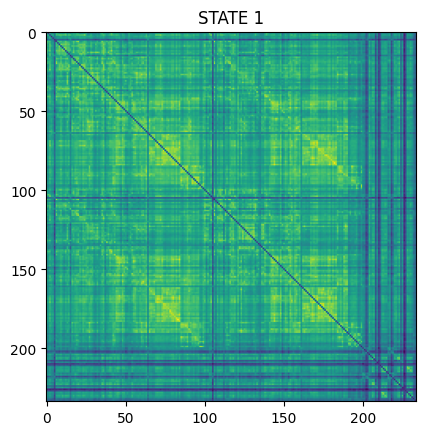

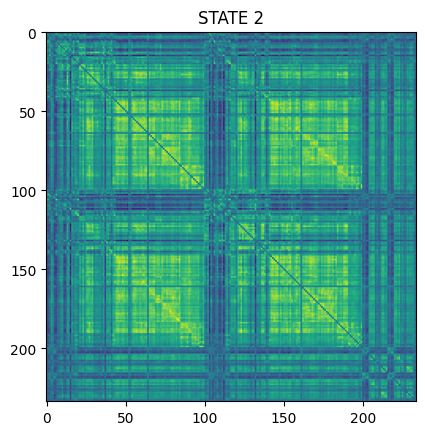

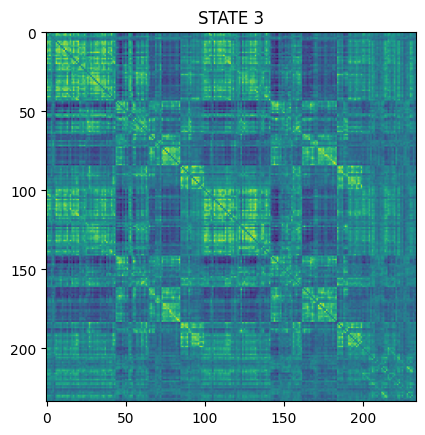

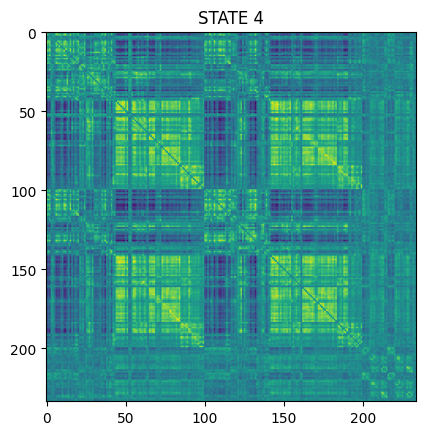

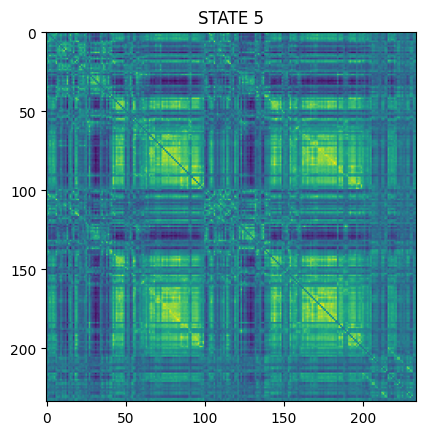

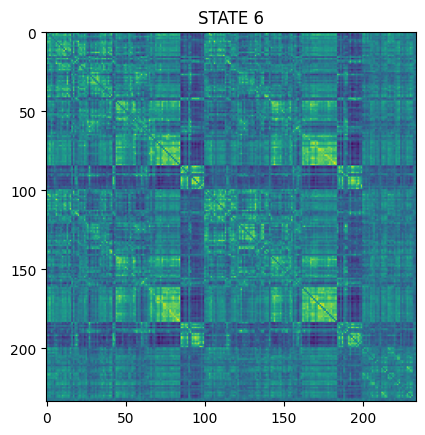

In [771]:
for i in range(K):
    fig = plt.figure()
    whe = np.where(state_labels==i+1)
    plt.imshow(np.mean(plm_tc[whe], axis=0))
    plt.title('STATE '+str(i+1))
    plt.savefig('output/GraphAnal/26092023/K'+str(K)+'/Average_PL_K'+str(i+1)+'.png', dpi=200)

In [22]:
atlas_labels[:20]

,from,side,network,area,a_idx,n_area
0,17networks,LH,DefaultA,IPL,1.0,DefaultA-IPL
1,17networks,LH,DefaultA,PFCm,1.0,DefaultA-PFCm
2,17networks,LH,DefaultA,Temp,1.0,DefaultA-Temp
3,17networks,LH,DefaultA,Temp,2.0,DefaultA-Temp
4,17networks,LH,DefaultA,TempPole,1.0,DefaultA-TempPole
5,17networks,LH,DefaultA,TempPole,2.0,DefaultA-TempPole
6,17networks,LH,DefaultA,pCunPCC,1.0,DefaultA-pCunPCC
7,17networks,LH,DefaultB,FPole,1.0,DefaultB-FPole
8,17networks,LH,DefaultB,IPL,1.0,DefaultB-IPL
9,17networks,LH,DefaultB,IPL,2.0,DefaultB-IPL


# Goodness of clustering of evaluation: cluster's intrinsic dimension

In [68]:
from numpy.linalg import norm

In [69]:
def wcss(points, centroids, cluster_labels):
    unique_labels = np.unique(states_labels)
    sum_sq_distance = 0
    for idx, C in enumerate(unique_labels):
        c = centroids[idx]
        for p in points[np.where(cluster_labels==C)]:
            sum_sq_distance += norm(p - c)**2
            
    return sum_sq_distance

In [70]:
# Silhouette score evaluation

K_max = 9
silhouettes = []
wcss_ = []
for i,k in enumerate(range(3,len(kmeans_leida)+3)):
    print('State '+str(k))
    states_labels = kmeans_leida[i]['IDX']
    states_idx = np.unique(states_labels)
    
#     state_v = Ev[np.where(state_labels==s)]
#     sub_samp = random.sample([i for i in range(state_v.shape[0])], n)
    # silhouette
    sil = silhouette_score(Ev, states_labels)
    silhouettes.append(sil)
    
    # Sum of Square Distance
    centroids = kmeans_leida[i]['C']
    wcss_.append(wcss(Ev, centroids, states_labels))
    
    


State 3
State 4
State 5
State 6
State 7
State 8
State 9
State 10
State 11
State 12


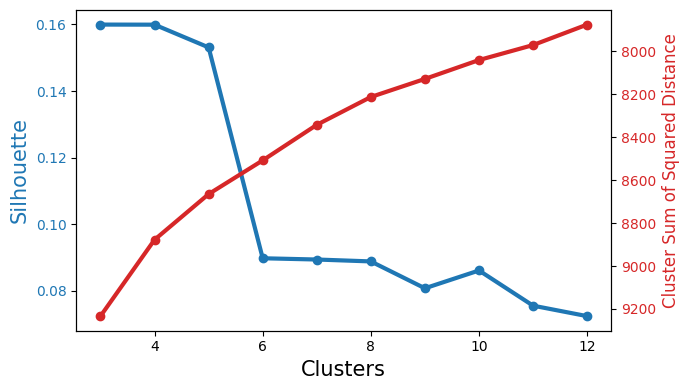

In [73]:
today = date.today()
DATE = today.strftime("%d%m%Y")
# checking if the directory exists or not
if not os.path.exists('output/GraphAnal/'+DATE+'/K'+str(K)):
      
    # if the demo_folder directory is not present 
    # then create it.
    os.makedirs('output/GraphAnal/'+DATE+'/K'+str(K))

metricz = [silhouettes, wcss_]
x = [k for k in range(3,len(kmeans_leida)+3)]
fig, ax1 = plt.subplots(1, figsize=(7,4))
ax1.plot(x, metricz[0], '-o', color='tab:blue', linewidth=3)
ax1.set_ylabel('Silhouette', fontsize=15, color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax2 = ax1.twinx()
ax2.plot(x, metricz[1], '-o', color='tab:red', linewidth=3)
ax2.invert_yaxis()
ax2.set_ylabel('Cluster Sum of Squared Distance', fontsize=12, color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')
ax1.set_xlabel('Clusters', fontsize=15)

plt.tight_layout()

plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/silhouette&wcss_corr_'+DATE+'.png',
            dpi=200)

In [498]:
# Cluster visualzation through PCA
# PCA

n = 100 # random subsampling for the pca
reps = 100
# varss = [0.25,0.5,0.75,0.95]
varss = [0.95]


points_maxs = []
points_mins = []
points_means = []
points_maxs_std = []
points_mins_std = []
points_means_std = []
for var in varss:
    points_max = []
    points_min = []
    points_mean = []
    points_max_std = []
    points_min_std = []
    points_mean_std = []
    print(var)
    for k in range(3,K_max):
        k = k-3
        state_labels = kmeans_leida[k]['IDX']
        states_idx = np.unique(state_labels)
        intrinsic_dims = []
        intrinsic_dims_std = []
        for s in states_idx: # loop over states
            intrinsic_dim = []
            for piru in range(reps):
                state_v = Ev[np.where(state_labels==s)]
                sub_samp = random.sample([i for i in range(state_v.shape[0])], n)
                # PCA
                pca = sklearn.decomposition.PCA(n_components=100)
                pca.fit(state_v[sub_samp])
                V1_pca = pca.transform(state_v[sub_samp])
                exp_var_pca = pca.explained_variance_ratio_
                cum_sum_eigenvalues = np.cumsum(exp_var_pca)
                intrinsic_dim.append(np.where(cum_sum_eigenvalues>var)[0][0])
            intrinsic_dims.append(np.mean(intrinsic_dim))
            intrinsic_dims_std.append(np.std(intrinsic_dim))
        points_max.append(np.max(intrinsic_dims))
        points_min.append(np.min(intrinsic_dims))
        points_max_std.append(intrinsic_dims_std[np.argmax(intrinsic_dims)])
        points_min_std.append(intrinsic_dims_std[np.argmin(intrinsic_dims)])
        points_mean.append(np.mean(intrinsic_dims))
        points_mean_std.append(np.std(intrinsic_dims))
#         print(np.max(intrinsic_dims))
        #         fig= plt.figure()
        #         plt.title('PCA explained variance')
        #         plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
        #         plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
        #         plt.ylabel('Explained variance ratio')
        #         plt.xlabel('Principal component index')
        #         plt.legend(loc='best')
        #         plt.tight_layout()
        #         plt.show()
    points_mins.append(points_min)
    points_means.append(points_mean)
    points_maxs.append(points_max)
    points_mins_std.append(points_min_std)
    points_means_std.append(points_mean_std)
    points_maxs_std.append(points_max_std)

0.95


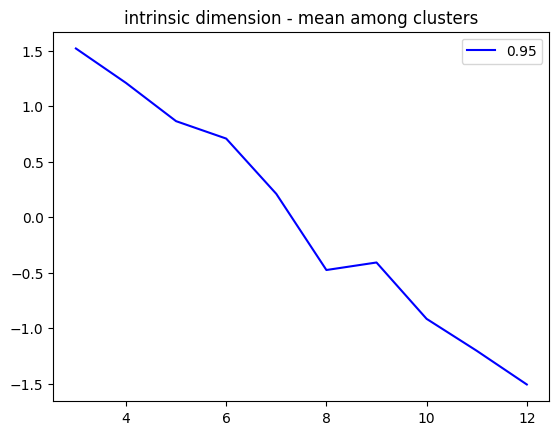

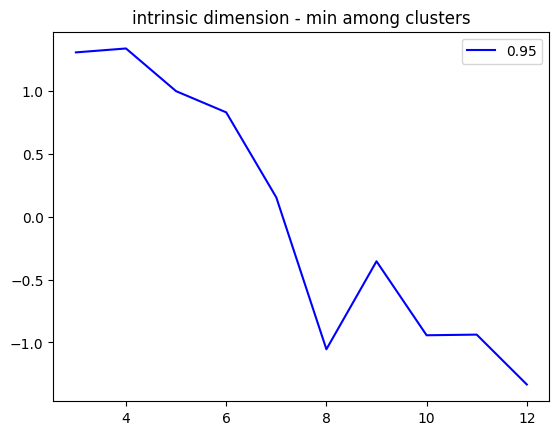

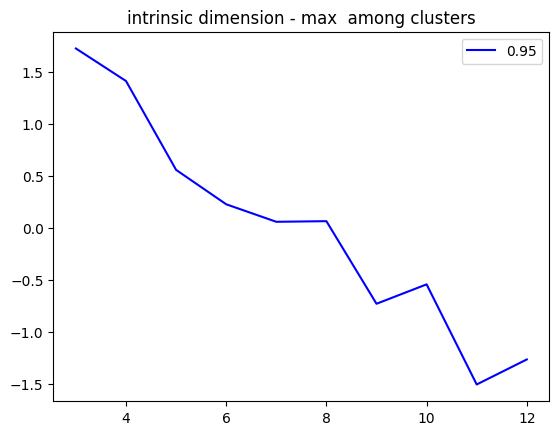

In [499]:
# plt.plot([x+3 for x in range(len(points_max))], points_max, label='max')
# plt.plot([x+3 for x in range(len(points_max))], points_min, label='min')
# plt.plot([x+3 for x in range(len(points_max))], points_mean, label='mean')
# plt.legend()

cmap = plt.cm.winter  # define the colormap

fig = plt.figure()
plt.title('intrinsic dimension - mean among clusters')
for i,c in enumerate(points_means):
    plt.plot([x+3 for x in range(len(c))], (c-np.mean(c))/np.std(c), label=str(varss[i]), color=cmap(i/len(points_means)))
plt.legend()
    
fig = plt.figure()
plt.title('intrinsic dimension - min among clusters')
for i,c in enumerate(points_mins):
    plt.plot([x+3 for x in range(len(c))],(c-np.mean(c))/np.std(c), label=str(varss[i]), color=cmap(i/len(points_means)))
plt.legend()

fig = plt.figure()
plt.title('intrinsic dimension - max  among clusters')
for i,c in enumerate(points_maxs):
    plt.plot([x+3 for x in range(len(c))], (c-np.mean(c))/np.std(c), label=str(varss[i]), color=cmap(i/len(points_means)))
plt.legend()

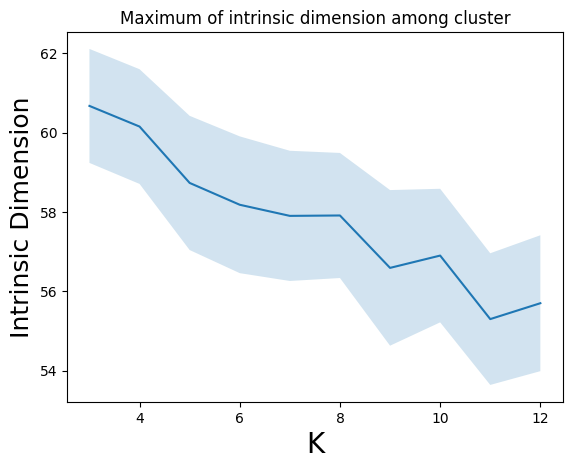

In [506]:
x = [x+3 for x in range(len(points_mins[-1]))]
plt.plot([x+3 for x in range(len(points_maxs[-1]))], points_maxs[-1])
plt.fill_between(x,
                 np.subtract(points_maxs[-1], points_maxs_std[-1]), 
                 np.subtract(points_maxs[-1], -np.asarray(points_maxs_std[-1])), alpha=0.2)
plt.xlabel('K', fontsize=20)
plt.ylabel('Intrinsic Dimension', fontsize=18);
plt.title('Maximum of intrinsic dimension among cluster')
plt.savefig('output/GraphAnal/MaximumIntrinsicDimension.png',
            dpi=200)

## Functional characterization of states

In [37]:
# Everything necesessary for a RADAR PLOT

from matplotlib.patches import Circle, RegularPolygon
from matplotlib.path import Path
from matplotlib.projections.polar import PolarAxes
from matplotlib.projections import register_projection
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D

def radar_factory(num_vars, frame='circle'):
    """
    Create a radar chart with `num_vars` axes.

    This function creates a RadarAxes projection and registers it.

    Parameters
    ----------
    num_vars : int
        Number of variables for radar chart.
    frame : {'circle', 'polygon'}
        Shape of frame surrounding axes.

    """
    # calculate evenly-spaced axis angles
    theta = np.linspace(0, 2*np.pi, num_vars, endpoint=False)

    class RadarTransform(PolarAxes.PolarTransform):

        def transform_path_non_affine(self, path):
            # Paths with non-unit interpolation steps correspond to gridlines,
            # in which case we force interpolation (to defeat PolarTransform's
            # autoconversion to circular arcs).
            if path._interpolation_steps > 1:
                path = path.interpolated(num_vars)
            return Path(self.transform(path.vertices), path.codes)

    class RadarAxes(PolarAxes):

        name = 'radar'
        PolarTransform = RadarTransform

        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)
            # rotate plot such that the first axis is at the top
            self.set_theta_zero_location('N')

        def fill(self, *args, closed=True, **kwargs):
            """Override fill so that line is closed by default"""
            return super().fill(closed=closed, *args, **kwargs)

        def plot(self, *args, **kwargs):
            """Override plot so that line is closed by default"""
            lines = super().plot(*args, **kwargs)
            for line in lines:
                self._close_line(line)

        def _close_line(self, line):
            x, y = line.get_data()
            # FIXME: markers at x[0], y[0] get doubled-up
            if x[0] != x[-1]:
                x = np.append(x, x[0])
                y = np.append(y, y[0])
                line.set_data(x, y)

        def set_varlabels(self, labels):
            self.set_thetagrids(np.degrees(theta), labels, position=(-0.13,-0.13),
                                horizontalalignment='center', fontsize=10 )

        def _gen_axes_patch(self):
            # The Axes patch must be centered at (0.5, 0.5) and of radius 0.5
            # in axes coordinates.
            if frame == 'circle':
                return Circle((0.5, 0.5), 0.5)
            elif frame == 'polygon':
                return RegularPolygon((0.5, 0.5), num_vars,
                                      radius=.5, edgecolor="k")
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

        def _gen_axes_spines(self):
            if frame == 'circle':
                return super()._gen_axes_spines()
            elif frame == 'polygon':
                # spine_type must be 'left'/'right'/'top'/'bottom'/'circle'.
                spine = Spine(axes=self,
                              spine_type='circle',
                              path=Path.unit_regular_polygon(num_vars))
                # unit_regular_polygon gives a polygon of radius 1 centered at
                # (0, 0) but we want a polygon of radius 0.5 centered at (0.5,
                # 0.5) in axes coordinates.
                spine.set_transform(Affine2D().scale(.5).translate(.5, .5)
                                    + self.transAxes)
                return {'polar': spine}
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

    register_projection(RadarAxes)
    return theta

In [81]:
thresh=3

In [52]:
len([';',';',';',';',';',';',';',';'])

8

In [80]:
func_char['Z-score;;;;;;;;'].values[0][:-8]

'-23.118173949647876'

In [107]:
char_dic = {'neg':{}, 
            'pos':{}}

my_path = 'output/Kmeans_FuncCharact/K6/'
for mm in ['neg', 'pos']:
    print(mm)
    if mm=='neg':
        func_char = pd.read_csv(my_path+'PL6_state4_'+mm+'_TAL_profile.csv')
        domains = func_char['Domain'].unique()
        for d in domains:
            somma = 0
            c = 0
            for v in func_char.loc[func_char['Domain']==d]['Z-score'].values:
                if v > thresh:
                    somma += v
                    c += 1
            if c==0:
                char_dic[mm][d] = 0
            else:
                char_dic[mm][d] = somma/c
    else:
        func_char = pd.read_csv(my_path+'PL6_state4_'+mm+'_TAL_profile.csv')
        domains = func_char['Domain'].unique()
        for d in domains:
            somma = 0
            c = 0
            for v in func_char['Z-score;;;;;;;;'].values:
                if float(v[:-8])>thresh:
                    somma += float(v[:-8])
                    c += 1
            if c == 0:
                char_dic[mm][d] = 0
            else:
                char_dic[mm][d] = somma/c


neg
pos


<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

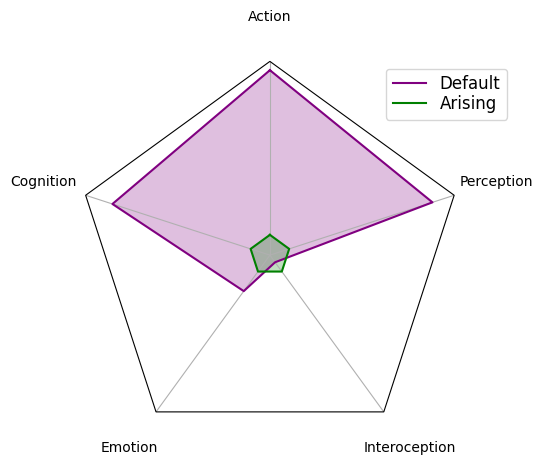

In [108]:
# radar chart
data = []
for k_1 in char_dic.keys():
    data_ = []
    for k_2 in char_dic[k_1].keys():
        data_.append(char_dic[k_1][k_2])
    data.append(data_)

    



N = len(domains)
theta = radar_factory(N, frame='polygon')

# spoke_labels = data.pop(0)

fig, axs = plt.subplots(figsize=(5, 5), nrows=1, ncols=1,
                        subplot_kw=dict(projection='radar'))
fig.subplots_adjust(wspace=0.25, hspace=0.20, top=0.85, bottom=0.05)

colors = ['purple', 'green']
# Plot the four cases from the example data on separate axes
# axs.set_rgrids([5, 10, 15, 20, 25])
# axs.set_title('cane', weight='bold', size='medium', position=(0.5, 1.1),
#              horizontalalignment='center', verticalalignment='center')


for d, color in zip(data, colors):
    axs.plot(theta, d, color=color)
#     axs.set_rticks([0.25,0.5, 0.75], labels=[])
#     axs.set_rlabel_position(-360/5)
    axs.set_rticks([0.1,0.2, 0.3], labels=[])
    axs.set_rlabel_position(-60)
    axs.fill(theta, d, facecolor=color, alpha=0.25, label='_nolegend_')
axs.set_varlabels(domains)

# add legend relative to top-left plot
labels = ('Default', 'Arising')
legend = axs.legend(labels, loc=(0.8, .85),
                          labelspacing=0.1, fontsize=12)

# plt.show()
plt.tight_layout
# plt.savefig('output/PlotGenerator/macro_areas_radar_normalize_plus_25082023.png', dpi=1000, bbox_inches='tight')

Default
Arising


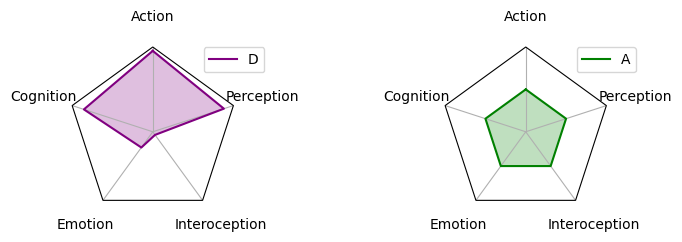

In [109]:
# radar chart
data = []
for k_1 in char_dic.keys():
    data_ = []
    for k_2 in char_dic[k_1].keys():
        data_.append(char_dic[k_1][k_2])
    data.append(data_)
    
colors = ['purple', 'green']
labels = ['Default', 'Arising']

fig, axs = plt.subplots(figsize=(7, 7), nrows=1, ncols=2,
                        subplot_kw=dict(projection='radar'))
for i,d in enumerate(data):
    
    N = len(domains)
    theta = radar_factory(N, frame='polygon')

    # spoke_labels = data.pop(0)


    fig.subplots_adjust(wspace=1.2, hspace=0.20, top=0.85, bottom=0.05)

    # Plot the four cases from the example data on separate axes
    # axs.set_rgrids([5, 10, 15, 20, 25])
    # axs.set_title('cane', weight='bold', size='medium', position=(0.5, 1.1),
    #              horizontalalignment='center', verticalalignment='center')

    color = colors[i]
    axs[i].plot(theta, d, color=color)
#     axs.set_rticks([0.25,0.5, 0.75], labels=[])
#     axs.set_rlabel_position(-360/5)
    axs[i].set_rticks([0.1,0.2, 0.3], labels=[])
    axs[i].set_rlabel_position(-60)
    axs[i].fill(theta, d, facecolor=color, alpha=0.25, label='_nolegend_')
    axs[i].set_varlabels(domains)

    label = labels[i]
    print(label)
    # add legend relative to top-left plot
    legend = axs[i].legend(label, loc=(0.8, .85),
                              labelspacing=0.1, fontsize=10)

    # plt.show()
    plt.tight_layout
    # plt.savefig('output/PlotGenerator/macro_areas_radar_normalize_plus_25082023.png', dpi=1000, bbox_inches='tight')

# Goodness of clustering: inter-pattern correlation variance

In [34]:
len(kmeans_leida)

8

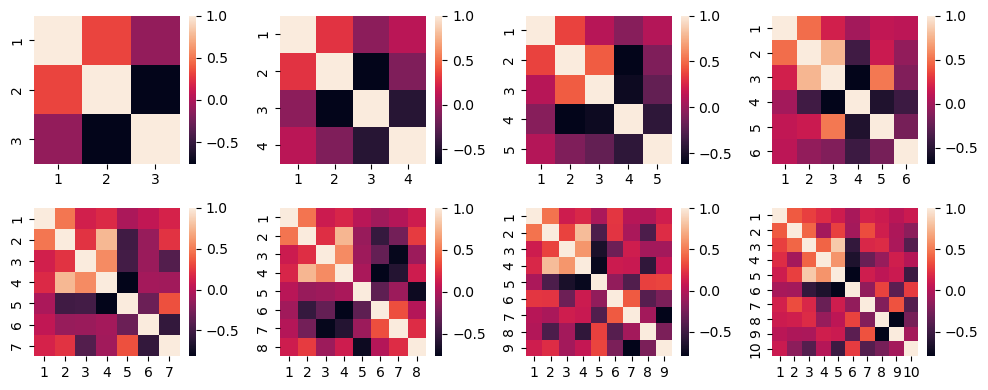

In [37]:
fig,axs = plt.subplots(2,4, figsize=(10,4))
corr_mats = []
for idx,ax in enumerate(axs.flat):
    results = kmeans_leida[idx]
    # Compute correlation between centroids of each K
    centrs = results['C'] # centroids
    corr_mat = np.empty((centrs.shape[0],centrs.shape[0]))# Init the corr matrix
    for i in range(centrs.shape[0]):
        for j in range(centrs.shape[0]):
            corr_mat[i,j] = pearsonr(centrs[i], centrs[j])[0]
    tick = [t+1 for t in range(centrs.shape[0])]
    sns.heatmap(corr_mat, ax=ax, xticklabels=tick, yticklabels=tick)
    corr_mats.append(corr_mat)

plt.tight_layout()

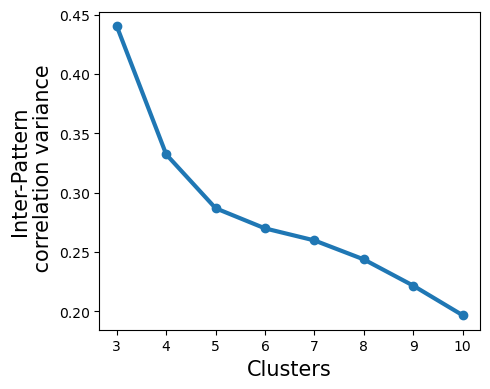

In [38]:
vars = [m.var() for m in corr_mats]
x = [i+3 for i in range(len(corr_mats))]
fig, ax = plt.subplots(1, figsize=(5,4))
ax.plot(x,vars, '-o', linewidth=3)
ax.set_xlabel('Clusters', fontsize=15)
ax.set_ylabel('Inter-Pattern\n correlation variance', fontsize=15)
plt.tight_layout()
# plt.savefig('output/MD_05122023/clust_met_ipcv.png',
#             dpi=200)

# Goodness of clustering: silhouette

In [26]:
def wcss(points, centroids, state_idx):
    unique_labels = np.unique(state_idx)
    # print(unique_labels)
    sum_sq_distance = 0
    for idx, C in enumerate(unique_labels):
        c = centroids[idx]
        for p in points[np.where(state_idx==C)]:
            sum_sq_distance += norm(p - c)**2
            
    return sum_sq_distance

In [27]:
# Silhouette score evaluation

K_max = 10
silhouettes = []
wcss_ = []
for i,k in enumerate(range(3,K_max+1)):
    print('State '+str(k))
    state_idx = state_labels_list[i]


    # sub_samp = random.sample([i for i in range(state_v.shape[0])], n)
    sil = silhouette_score(Ev, state_idx)
    # sil = silhouette_score(Ev, state_idx)
    silhouettes.append(sil)
    
    # Sum of Square Distance
    centroids = kmeans_leida[i]['C']
    wcss_.append(wcss(Ev, centroids, state_idx))

State 3
State 4
State 5
State 6
State 7
State 8
State 9
State 10


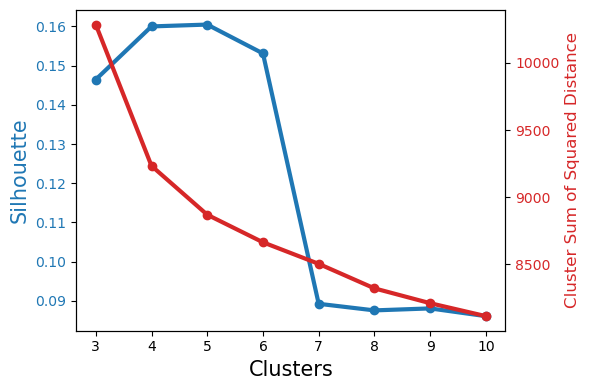

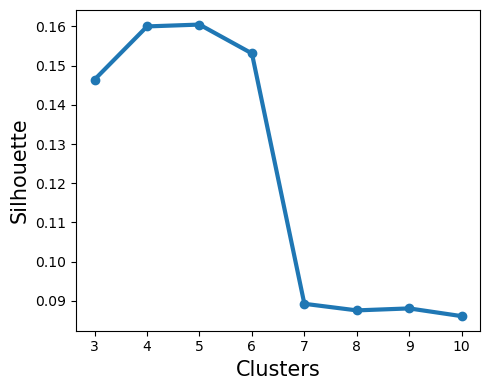

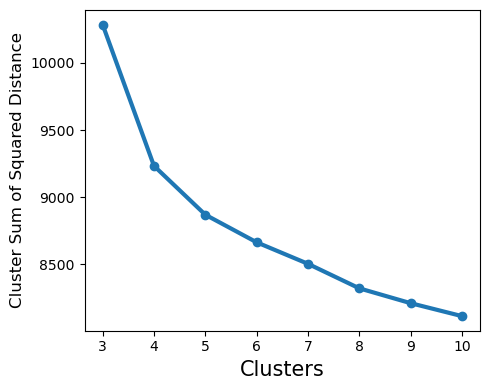

In [28]:
today = date.today()
DATE = today.strftime("%d%m%Y")
# checking if the directory exists or not

metricz = [silhouettes, wcss_]
x = [k for k in range(2,len(kmeans_leida)+2)]
fig, ax1 = plt.subplots(1, figsize=(6,4))
ax1.plot(x[1:], metricz[0], '-o', color='tab:blue', linewidth=3)
ax1.set_ylabel('Silhouette', fontsize=15, color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax2 = ax1.twinx()
ax2.plot(x[1:], metricz[1], '-o', color='tab:red', linewidth=3)
# ax2.invert_yaxis()
ax2.set_ylabel('Cluster Sum of Squared Distance', fontsize=12, color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')
ax1.set_xlabel('Clusters', fontsize=15)
plt.tight_layout()

plt.savefig('output/MD_05122023_noclustfilt/clust_met.png',
            dpi=200)

metricz = [silhouettes, wcss_]
x = [k for k in range(2,len(kmeans_leida)+2)]
fig, ax1 = plt.subplots(1, figsize=(5,4))
ax1.plot(x[1:], metricz[0], '-o', color='tab:blue', linewidth=3)
ax1.set_ylabel('Silhouette', fontsize=15,)
ax1.tick_params(axis='y')
ax1.set_xlabel('Clusters', fontsize=15)
plt.tight_layout()
plt.savefig('output/MD_05122023_noclustfilt/clust_met_sil.png',
            dpi=200)

fig, ax2 = plt.subplots(1, figsize=(5,4))
ax2.plot(x[1:], metricz[1], '-o', color='tab:blue', linewidth=3)
# ax2.invert_yaxis()
ax2.set_ylabel('Cluster Sum of Squared Distance', fontsize=12)
ax2.tick_params(axis='y')
ax2.set_xlabel('Clusters', fontsize=15)
plt.tight_layout()
plt.savefig('output/MD_05122023_noclustfilt/clust_met_cssd.png',
            dpi=200)

# Comparison between centroids among different K (of the K-means)

## Comparison between centroids among different K (of the K-means)

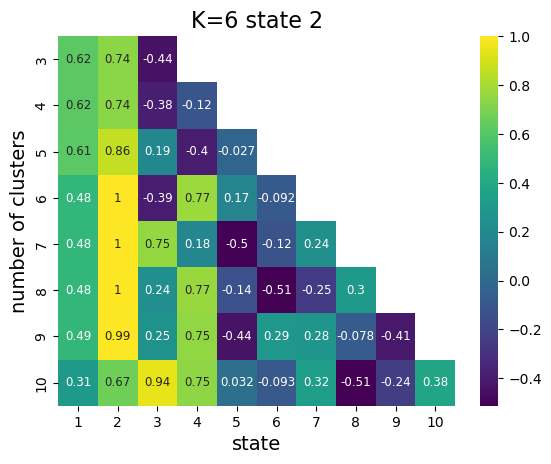

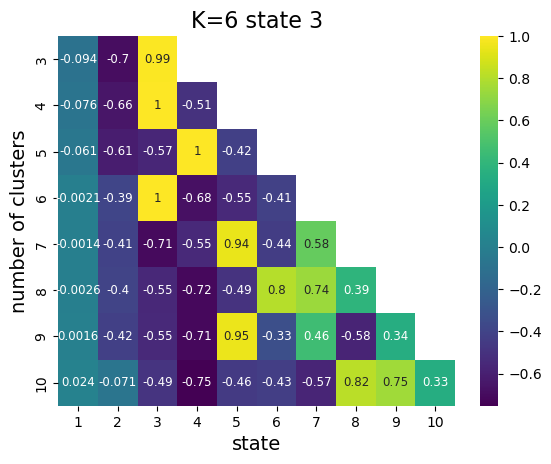

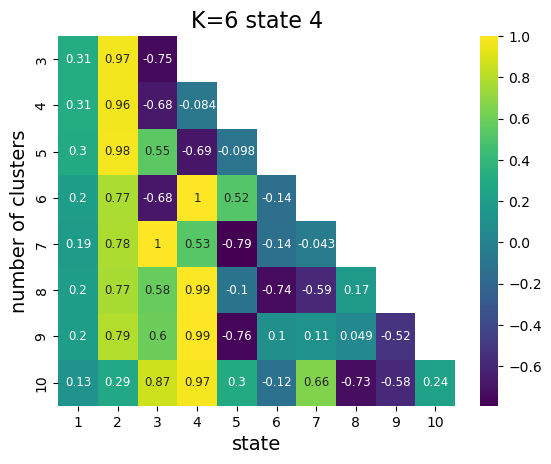

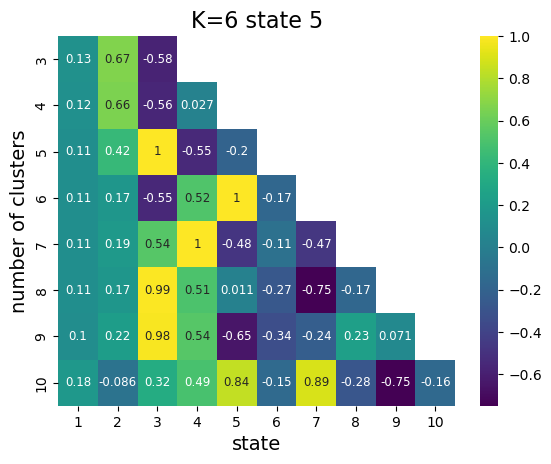

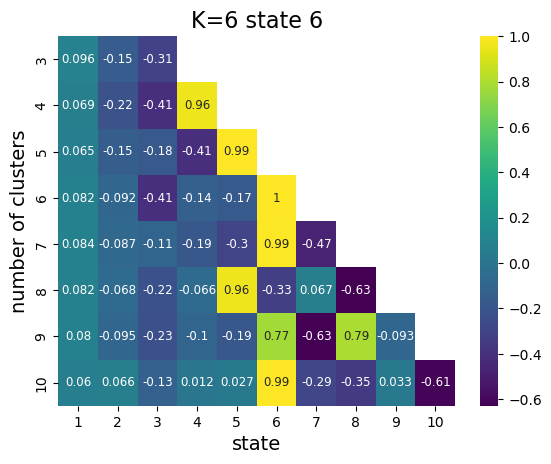

In [32]:
# I take the centroids for K=4 because they seems to be present in all the K clusterings
my_k = 6
centr_4 = kmeans_leida[my_k-2]['C']

K_max = 10


# for iii,c in enumerate(centr_4[1:]): # Loop over the centroids for K=4 (exluding the global signal state)
#     corr_m = np.full((7,10), np.nan)
#     i_ = 0 # the real counter
#     for i,k in enumerate(range(1,K_max-1)): # Loop over the K
#         if i!= my_k-3:
#             centroids = kmeans_leida[k]['C'] # centroids for the current K
#             for c_i,c_ in enumerate(centroids):
#                 corr_m[i_,c_i] = pearsonr(c,c_)[0]
#             i_ += 1
    
#     y_t = [y for y in range(3,10+1) if y!=my_k]
#     x_t = [x+1 for x in range(10)]
#     fig = plt.figure()
#     sns.heatmap(corr_m, xticklabels=x_t, yticklabels=y_t, annot=True, cmap='viridis',annot_kws={'fontsize':8.5})
#     plt.title('K='+str(my_k)+' state '+str(iii+2), fontsize=16)
#     plt.ylabel('number of clusters', fontsize=14)
#     plt.xlabel('state', fontsize=14)

#     plt.savefig('output/MD_05122023/corr_betw_centroids_K'+str(my_k)+'_state'+str(iii+2)+'.png',
#                 dpi=200)


# NOT REMOVING THE ROW OF THE CHOSEN K
for iii,c in enumerate(centr_4[1:]): # Loop over the centroids for K=4 (exluding the global signal state)
    corr_m = np.full((8,10), np.nan)
    i_ = 0 # the real counter
    for i,k in enumerate(range(1,K_max-1)): # Loop over the K
        centroids = kmeans_leida[k]['C'] # centroids for the current K
        for c_i,c_ in enumerate(centroids):
            corr_m[i_,c_i] = pearsonr(c,c_)[0]
        i_ += 1
    
    y_t = [y for y in range(3,10+1)]
    x_t = [x+1 for x in range(10)]
    fig = plt.figure()
    sns.heatmap(corr_m, xticklabels=x_t, yticklabels=y_t, annot=True, cmap='viridis',annot_kws={'fontsize':8.5})
    plt.title('K='+str(my_k)+' state '+str(iii+2), fontsize=16)
    plt.ylabel('number of clusters', fontsize=14)
    plt.xlabel('state', fontsize=14)

    # plt.savefig('output/MD_05122023/corr_betw_centroids_K'+str(my_k)+'_state'+str(iii+2)+'.png',
    #             dpi=200)

## Comparison at fixed K: similarity among mean EV belonging to different states

In [41]:
state_labels_list

[array([1., 1., 1., ..., 1., 1., 2.]),
 array([1., 1., 1., ..., 1., 1., 2.]),
 array([1., 1., 1., ..., 4., 4., 2.]),
 array([1., 1., 1., ..., 5., 5., 3.]),
 array([2., 2., 2., ..., 6., 6., 5.]),
 array([2., 2., 2., ..., 6., 6., 4.]),
 array([2., 2., 2., ..., 5., 5., 3.]),
 array([6., 2., 2., ..., 6., 6., 3.]),
 array([2., 2., 2., ..., 6., 6., 7.])]

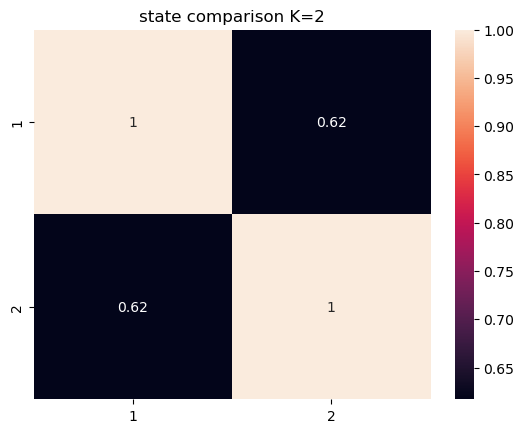

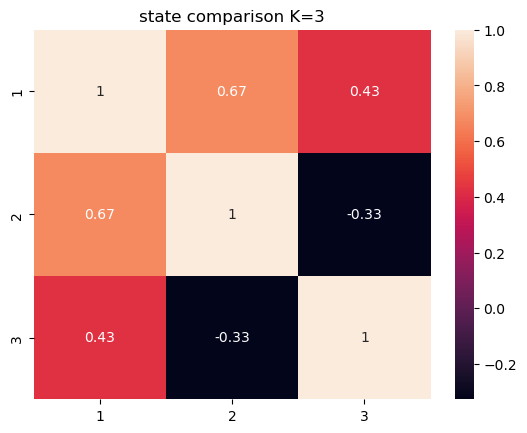

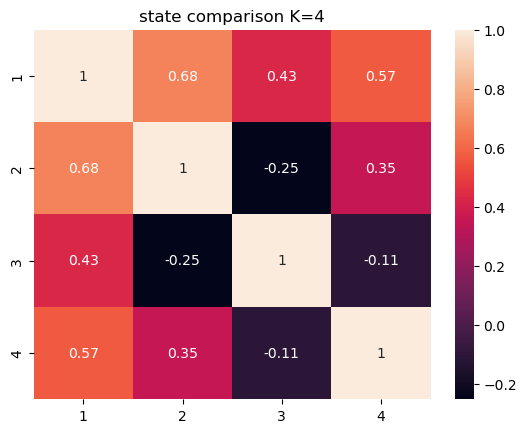

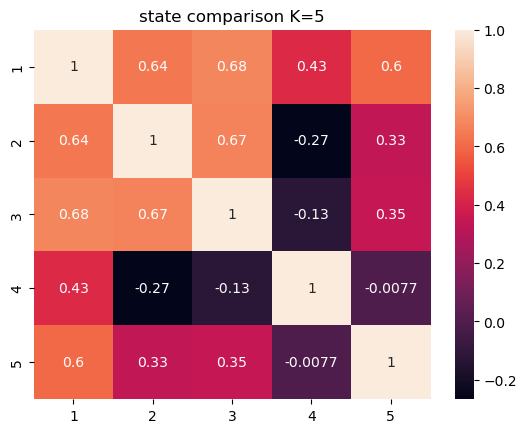

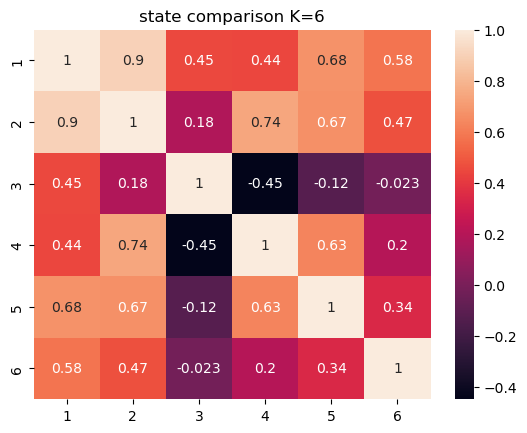

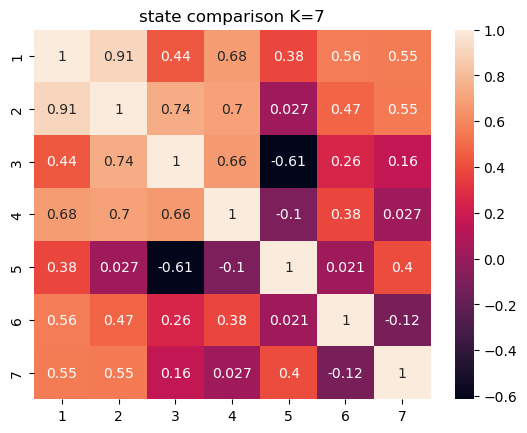

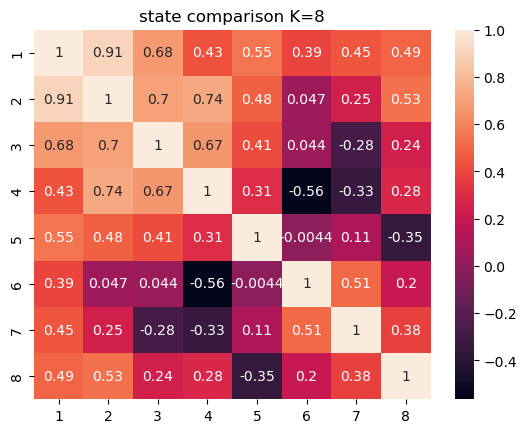

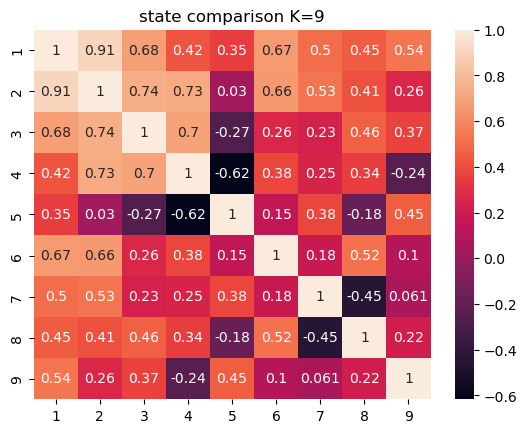

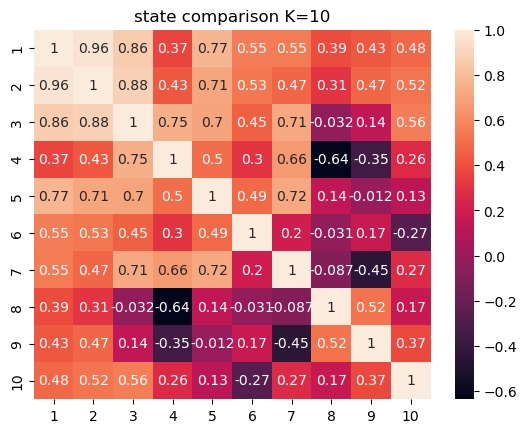

In [40]:
import warnings
warnings.filterwarnings('ignore')

for K in range(2,10+1):
    k = K - 2 # MD start to cluster from K=2
    state_labels = state_labels_list[k]
    states = []
    for s in range(1,K+1):
        states.append(Ev[np.where(state_labels==s)].mean(axis=0))
    sim_mat = np.empty((K,K))
    for i in range(K):
        for j in range(K):
            # print(states[i].shape, states[j].shape)
            sim_mat[i,j] = cosine_similarity(states[i].reshape(1, -1), states[j].reshape(1, -1))
    fig = plt.figure()
    tick = [t+1 for t in range(K)]
    sns.heatmap(sim_mat, annot=True, xticklabels=tick, yticklabels=tick)
    plt.title('state comparison K='+str(K))

    plt.savefig('output/MD_05122023_noclustfilt/state_sim_K'+str(K)+'.png',
                dpi=200)

# Some extra info

In [30]:
# time points belonging to each state [state x time points]
states_index = []
for s in np.unique(state_labels):
    states_index.append(np.where(state_labels==s))

# Divide states indexes by group
groups_index = []
for g in np.unique(group_labels):
    groups_index.append(np.where(group_labels==g)[0])
    
states_index_groups = [] # [state 1, state2, state 3]
for s in states_index:
    groupz = {0:[], 1:[], 2:[]}
    for t in s[0]:
        groupz[group_labels[t][0]].append(t)
    states_index_groups.append(groupz)

# states_index = # time points belonging to each state [state x time points]
# group_index = # time points belonging to each group [gorups x time points]

# Basic dynamic evaluation: Life Time and Percentage of Occupancy

In [26]:
# n_sub = int(state_labels.shape[0]/time_points)

In [27]:
print(sns.__version__)
# print(statannotations.__version__)

0.13.1


In [30]:
# from statannotations.Annotator import Annotator

(14223,) 2.0
(2, 234)
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

2_B vs. 2_NB: Brunner-Munzel test, P_val:2.848e-01 W=-1.113e+00
1_C vs. 1_B: Brunner-Munzel test, P_val:1.060e-01 W=1.727e+00
2_C vs. 2_B: Brunner-Munzel test, P_val:1.070e-01 W=1.725e+00
1_B vs. 1_NB: Brunner-Munzel test, P_val:1.381e-01 W=-1.577e+00
2_C vs. 2_NB: Brunner-Munzel test, P_val:9.152e-01 W=-1.086e-01
1_C vs. 1_NB: Brunner-Munzel test, P_val:7.947e-01 W=-2.662e-01
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

2_B vs. 2_NB: Brunner-Munzel test, P_val:5.301e-01 W=6.502e-01
1_C vs. 1_B: Brunner-Munzel test, P_val:5.260e-01 W=6.440e-01
2_C vs. 2_B: Brunner-Munzel test, P_val:5.260e-01 W=-6.440e-01
1_B vs. 1_NB: Brunner-Munzel test, P_val:5.301e-

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:5.260e-01 W=-6.440e-01
B vs. NB: Brunner-Munzel test, P_val:5.301e-01 W=6.502e-01
C vs. NB: Brunner-Munzel test, P_val:1.000e+00 W=0.000e+00
(14223,) 3.0
(3, 234)
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

3_C vs. 3_B: Brunner-Munzel test, P_val:5.882e-01 W=-5.499e-01
2_B vs. 2_NB: Brunner-Munzel test, P_val:3.140e-01 W=-1.052e+00
3_B vs. 3_NB: Brunner-Munzel test, P_val:1.119e-01 W=1.696e+00
1_C vs. 1_B: Brunner-Munzel test, P_val:8.973e-02 W=1.794e+00
2_C vs. 2_B: Brunner-Munzel test, P_val:3.591e-01 W=9.616e-01
1_B vs. 1_NB: Brunner-Munzel test, P_val:4.316e-01 W=-8.165e-01
3_C vs. 3_NB: Brunner-Munzel test, P_val:8.753e-02 W=1.798e+0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:4.623e-01 W=-7.481e-01
B vs. NB: Brunner-Munzel test, P_val:4.977e-01 W=6.990e-01
C vs. NB: Brunner-Munzel test, P_val:8.651e-01 W=1.724e-01
(14223,) 4.0
(4, 234)
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

3_C vs. 3_B: Brunner-Munzel test, P_val:4.049e-01 W=-8.559e-01
4_C vs. 4_B: Brunner-Munzel test, P_val:7.178e-01 W=3.659e-01
2_B vs. 2_NB: Brunner-Munzel test, P_val:4.862e-01 W=-7.155e-01
3_B vs. 3_NB: Brunner-Munzel test, P_val:2.472e-02 W=2.520e+00
4_B vs. 4_NB: Brunner-Munzel test, P_val:5.178e-01 W=-6.637e-01
1_C vs. 1_B: Brunner-Munzel test, P_val:6.723e-02 W=1.924e+00
2_C vs. 2_B: Brunner-Munzel test, P_val:1.817e-01 W=1.421e+00

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


C vs. NB: Brunner-Munzel test, P_val:9.172e-01 W=1.061e-01
(14223,) 5.0
(5, 234)
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

3_C vs. 3_B: Brunner-Munzel test, P_val:3.029e-01 W=-1.083e+00
4_C vs. 4_B: Brunner-Munzel test, P_val:1.785e-01 W=-1.397e+00
5_C vs. 5_B: Brunner-Munzel test, P_val:9.543e-01 W=5.820e-02
2_B vs. 2_NB: Brunner-Munzel test, P_val:6.214e-01 W=-5.051e-01
3_B vs. 3_NB: Brunner-Munzel test, P_val:1.000e+00 W=0.000e+00
4_B vs. 4_NB: Brunner-Munzel test, P_val:2.215e-02 W=2.572e+00
5_B vs. 5_NB: Brunner-Munzel test, P_val:8.851e-01 W=-1.471e-01
1_C vs. 1_B: Brunner-Munzel test, P_val:2.050e-01 W=1.306e+00
2_C vs. 2_B: Brunner-Munzel test, P_val:1.309e-01 W=1.636e+00
1_B vs. 1_NB: Brunner-Munzel test, P_val:2.801e-01 W=-1.138e+00
3_C vs. 3_NB: Brunner-Munzel test, P_val:2.609e-01 W=-1.179e+00
4_C vs. 4_NB: Brunner-Munzel test, P_val:1.8

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:3.908e-01 W=-8.754e-01
B vs. NB: Brunner-Munzel test, P_val:4.377e-01 W=8.069e-01
C vs. NB: Brunner-Munzel test, P_val:9.566e-01 W=-5.539e-02
(14223,) 6.0
(6, 234)
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

3_C vs. 3_B: Brunner-Munzel test, P_val:2.229e-01 W=-1.260e+00
4_C vs. 4_B: Brunner-Munzel test, P_val:1.504e-04 W=4.543e+00
5_C vs. 5_B: Brunner-Munzel test, P_val:2.792e-01 W=-1.142e+00
6_C vs. 6_B: Brunner-Munzel test, P_val:9.058e-01 W=-1.199e-01
2_B vs. 2_NB: Brunner-Munzel test, P_val:6.970e-01 W=3.989e-01
3_B vs. 3_NB: Brunner-Munzel test, P_val:3.387e-02 W=2.358e+00
4_B vs. 4_NB: Brunner-Munzel test, P_val:1.856e-01 W=-1.416e+

/tmp/ipykernel_1804166/3207581970.py:134: RuntimeWarning: divide by zero encountered in log
  h += p*np.log(p)
/tmp/ipykernel_1804166/3207581970.py:134: RuntimeWarning: invalid value encountered in scalar multiply
  h += p*np.log(p)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:3.517e-01 W=-9.529e-01
B vs. NB: Brunner-Munzel test, P_val:4.771e-01 W=7.452e-01
C vs. NB: Brunner-Munzel test, P_val:8.153e-01 W=-2.384e-01
(14223,) 7.0
(7, 234)
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

3_C vs. 3_B: Brunner-Munzel test, P_val:1.650e-05 W=5.434e+00
4_C vs. 4_B: Brunner-Munzel test, P_val:6.037e-01 W=-5.286e-01
5_C vs. 5_B: Brunner-Munzel test, P_val:7.397e-01 W=-3.365e-01
6_C vs. 6_B: Brunner-Munzel test, P_val:4.826e-01 W=7.139e-01
7_C vs. 7_B: Brunner-Munzel test, P_val:9.610e-01 W=-5.015e-02
2_B vs. 2_NB: Brunner-Munzel test, P_val:3.443e-01 W=9.817e-01
3_B vs. 3_NB: Brunner-Munzel test, P_val:3.216e-02 W=-2.546e+0

/tmp/ipykernel_1804166/3207581970.py:134: RuntimeWarning: divide by zero encountered in log
  h += p*np.log(p)
/tmp/ipykernel_1804166/3207581970.py:134: RuntimeWarning: invalid value encountered in scalar multiply
  h += p*np.log(p)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:9.622e-01 W=4.819e-02
B vs. NB: Brunner-Munzel test, P_val:8.874e-01 W=-1.452e-01
C vs. NB: Brunner-Munzel test, P_val:8.583e-01 W=-1.819e-01
(14223,) 8.0
(8, 234)
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

3_C vs. 3_B: Brunner-Munzel test, P_val:4.631e-01 W=-7.637e-01
4_C vs. 4_B: Brunner-Munzel test, P_val:7.862e-05 W=4.823e+00
5_C vs. 5_B: Brunner-Munzel test, P_val:5.013e-01 W=6.870e-01
6_C vs. 6_B: Brunner-Munzel test, P_val:9.562e-01 W=-5.597e-02
7_C vs. 7_B: Brunner-Munzel test, P_val:2.071e-01 W=-1.318e+00
8_C vs. 8_B: Brunner-Munzel test, P_val:2.927e-01 W=-1.120e+00
2_B vs. 2_NB: Brunner-Munzel test, P_val:3.844e-01 W=8.987e-01

/tmp/ipykernel_1804166/3207581970.py:134: RuntimeWarning: divide by zero encountered in log
  h += p*np.log(p)
/tmp/ipykernel_1804166/3207581970.py:134: RuntimeWarning: invalid value encountered in scalar multiply
  h += p*np.log(p)
/tmp/ipykernel_1804166/3207581970.py:153: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots(1,1, figsize=(7,5))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:7.391e-01 W=-3.393e-01
B vs. NB: Brunner-Munzel test, P_val:8.038e-02 W=1.993e+00
C vs. NB: Brunner-Munzel test, P_val:5.073e-01 W=6.790e-01
(14223,) 9.0
(9, 234)
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

3_C vs. 3_B: Brunner-Munzel test, P_val:3.870e-01 W=-9.037e-01
4_C vs. 4_B: Brunner-Munzel test, P_val:3.652e-05 W=5.111e+00
5_C vs. 5_B: Brunner-Munzel test, P_val:3.835e-01 W=-8.886e-01
6_C vs. 6_B: Brunner-Munzel test, P_val:7.729e-01 W=-2.955e-01
7_C vs. 7_B: Brunner-Munzel test, P_val:5.420e-01 W=-6.314e-01
8_C vs. 8_B: Brunner-Munzel test, P_val:2.910e-01 W=1.087e+00
9_C vs. 9_B: Brunner-Munzel test, P_val:5.747e-01 W=5.743e-01
2

/tmp/ipykernel_1804166/3207581970.py:134: RuntimeWarning: divide by zero encountered in log
  h += p*np.log(p)
/tmp/ipykernel_1804166/3207581970.py:134: RuntimeWarning: invalid value encountered in scalar multiply
  h += p*np.log(p)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:6.505e-01 W=-4.679e-01
B vs. NB: Brunner-Munzel test, P_val:5.029e-01 W=7.137e-01
C vs. NB: Brunner-Munzel test, P_val:8.200e-01 W=2.341e-01
(14223,) 10.0
(10, 234)
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

3_C vs. 3_B: Brunner-Munzel test, P_val:4.834e-01 W=7.218e-01
4_C vs. 4_B: Brunner-Munzel test, P_val:7.626e-02 W=1.928e+00
5_C vs. 5_B: Brunner-Munzel test, P_val:3.278e-01 W=-1.001e+00
6_C vs. 6_B: Brunner-Munzel test, P_val:7.604e-01 W=-3.132e-01
7_C vs. 7_B: Brunner-Munzel test, P_val:7.153e-01 W=-3.760e-01
8_C vs. 8_B: Brunner-Munzel test, P_val:9.065e-01 W=1.190e-01
9_C vs. 9_B: Brunner-Munzel test, P_val:2.567e-01 W=-1.180e+00

/tmp/ipykernel_1804166/3207581970.py:134: RuntimeWarning: divide by zero encountered in log
  h += p*np.log(p)
/tmp/ipykernel_1804166/3207581970.py:134: RuntimeWarning: invalid value encountered in scalar multiply
  h += p*np.log(p)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:9.258e-01 W=-9.667e-02
B vs. NB: Brunner-Munzel test, P_val:3.465e-01 W=1.118e+00
C vs. NB: Brunner-Munzel test, P_val:3.369e-01 W=1.213e+00


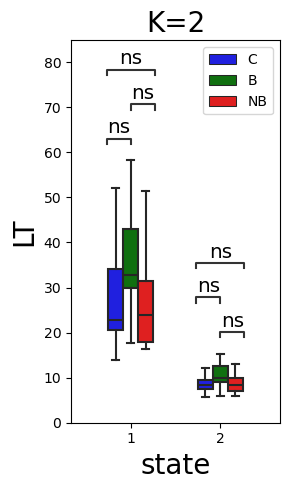

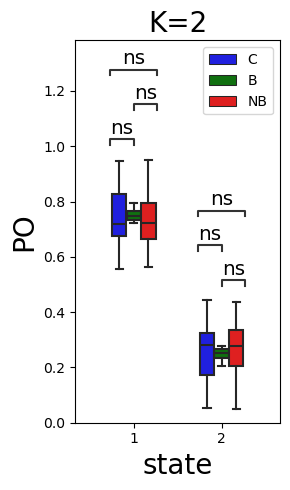

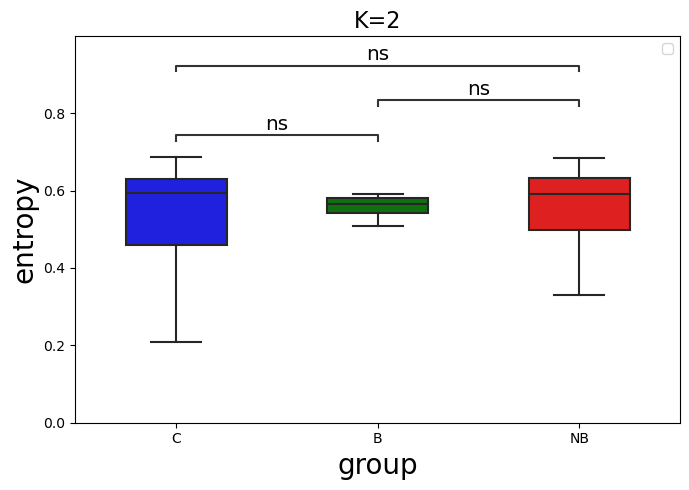

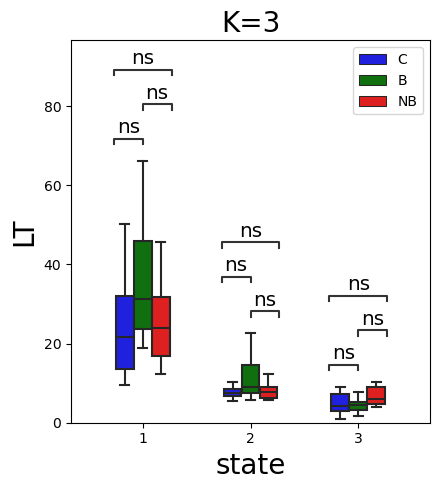

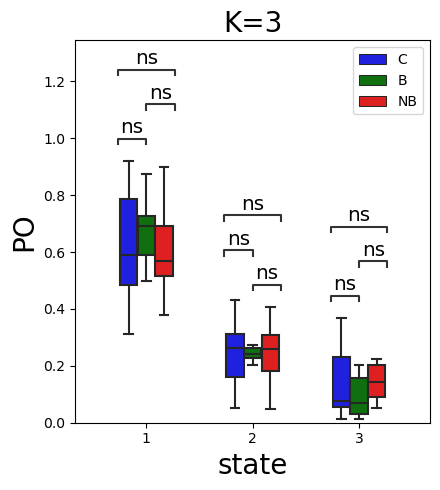

...

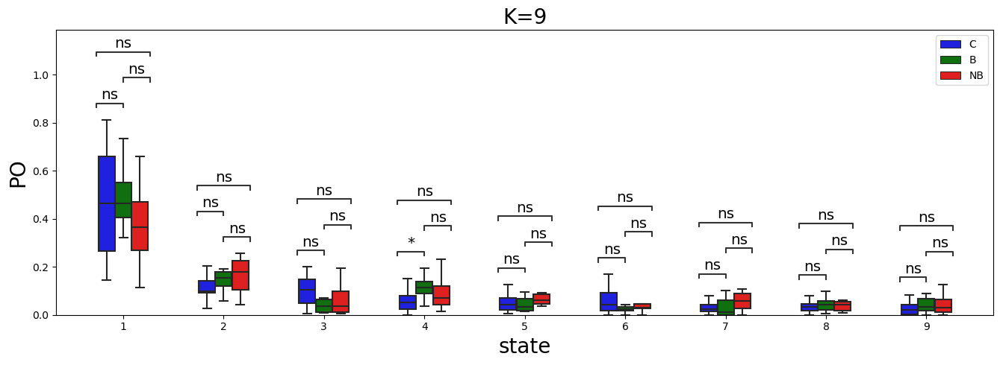

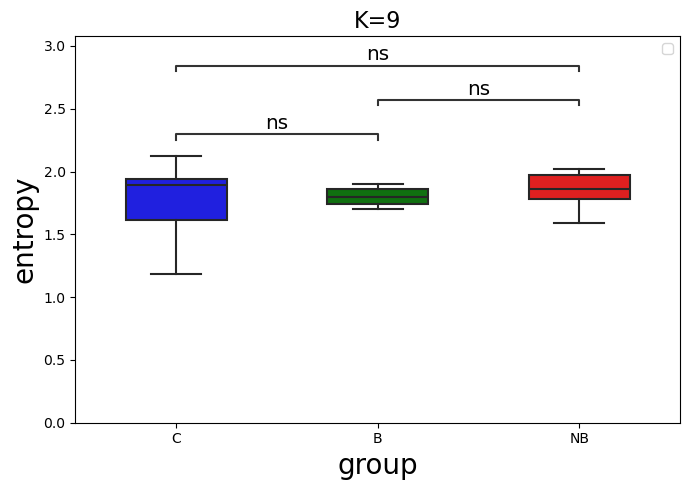

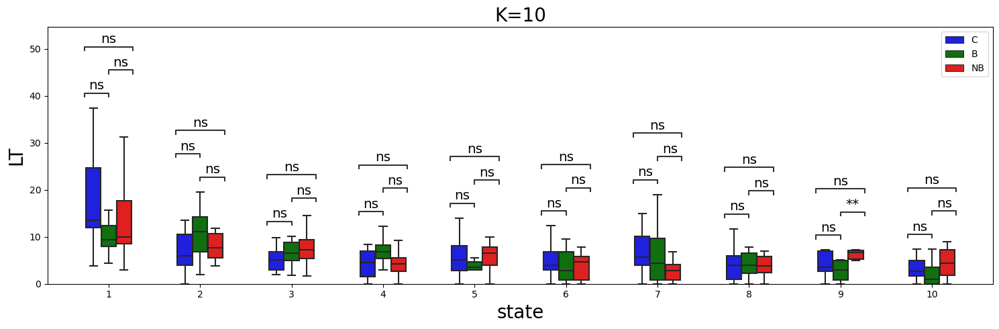

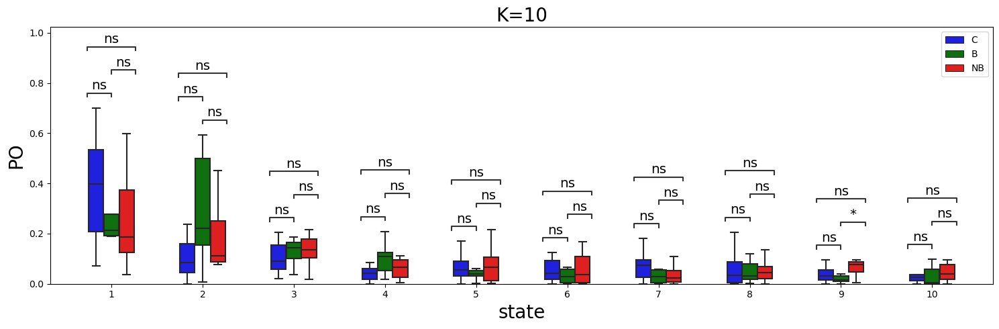

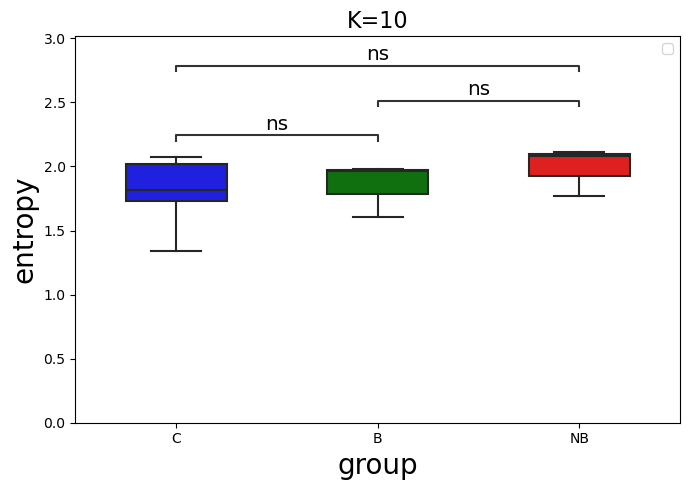

In [59]:
n_sub = int(state_labels_list[0].shape[0]/time_points)

for K in range(2,10+1):
    k = K - 2 # MD start to cluster from K=2
    # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
    state_labels = state_labels_list[k]
    print(state_labels.shape, state_labels.max())
    centroids = kmeans_leida[k]['C']
    print(centroids.shape)
    
    # SOME EXTRA INFOs
    # time points belonging to each state [state x time points]
    states_index = []
    for s in np.unique(state_labels):
        states_index.append(np.where(state_labels==s))
    # Divide states indexes by group
    groups_index = []
    for g in np.unique(group_labels):
        groups_index.append(np.where(group_labels==g)[0])
    states_index_groups = [] # [state 1, state2, state 3]
    for s in states_index:
        groupz = {0:[], 1:[], 2:[]}
        for t in s[0]:
            groupz[group_labels[t][0]].append(t)
        states_index_groups.append(groupz)
    
    # METRICS OF DYNAMICS
    metrics_dic = {'LT': [], 
                   'PO': [],
                   'sub': [],
                   'group': [],
                   'state': []}
    
    for n in range(n_sub):  # Loop over subjects
        ts = state_labels[n*time_points:(n+1)*time_points]
        for s in range(1, K+1):  
            metrics_dic['group'].append(group[n])
            metrics_dic['state'].append(s)
            metrics_dic['sub'].append(n+1)
            # PO
            metrics_dic['PO'].append(np.where(ts==s)[0].shape[0]/time_points)
            
        # AVERAGE LT    
        prev = ts[0]
        counts = {} # all the lifetimes, it's a dic
        for s in range(1, K+1): # Init the dic
            counts[s] = []
            
        count = 0
        for t in ts[1:]:
            if t==prev:
                count+=1
            else:
                counts[prev].append(count)
                count = 0
                prev = t
                
        for s in range(1, K+1): # Loop over state, no baseline state   
            if len(counts[s])==0:
                pino = 0
            else:
                pino = np.mean(counts[s])
                
            metrics_dic['LT'].append(pino)
    
    df_metrics = pd.DataFrame(metrics_dic)
    
    ### PLOT ###
    
    metrics = ['LT', 'PO']
    
    state_order = [s for s in range(1,K+1)] # 0 because we start from the baseline state - no baseline state   
    groups_order = ['C', 'B', 'NB']
    pairs = [[(k,'C'),(k,'B')] for k in range(1,K+1)] + \
             [[(k,'C'),(k,'NB')] for k in range(1,K+1)] + \
             [[(k,'B'),(k,'NB')] for k in range(1,K+1)]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    
    annot_test =  'Brunner-Munzel'
    # annot_test = 't-test_ind'
    
    stats = []
    for metrica in metrics:
        hue_plot_params = {
            'data': df_metrics,
            'x': 'state',
            'y': metrica,
            "order": state_order,
            "hue": 'group',
            "hue_order": groups_order,
            "palette": my_pal
        }
    
        fig,ax = plt.subplots(1,1, figsize=(K*1.5,5))
        with sns.plotting_context("notebook", font_scale = 1.2):
            # Create new plot
        #     ax = get_log_ax()
    
            # Plot with seaborn
            sns.boxplot(ax=ax, **hue_plot_params,
                             showfliers=False,
                             width=0.5)
            ax.set_xlabel('state',fontsize=20)
            ax.set_ylabel(metrica, fontsize=20)
            ax.set_ylim(0,)
    
            # Add annotations
            # Cohen's D calculation
            annotator = Annotator(ax, pairs, **hue_plot_params)
            annotator.configure(test=annot_test, text_format='star', loc='inside')
                                # ,comparisons_correction='Benjamini-Hochberg')
            annotator._pvalue_format.pvalue_thresholds =  [[0.0001/3, '****'], [0.001/3, '***'], [0.01/3, '**'], [0.05/3, '*'], [1, 'ns']]
            _, stat = annotator.apply_and_annotate()
        #         annamobbene = annotator.configure(test=annot_test).apply_and_annotate()
    
            # Label and show
            plt.legend(loc='upper right', fontsize=10, bbox_to_anchor=(1.0,1.0))
        plt.title('K='+str(K), fontsize=20)
        plt.tight_layout()
        stats.append(stat)
        plt.savefig('output/MD_05122023_noclustfilt/K'+str(K)+'/'+metrica+'_corr.png',
                    dpi=200)


    ### ENTROPY ###

    # Compute entropy for the three groups - subject by subject
    entropy_dic = {'entropy': [],
                   'group': []}
    
    for i,g in enumerate(group):
        h = 0
        for p in df_metrics.loc[df_metrics['sub']==i+1]['PO'].values:
            h += p*np.log(p)
        entropy_dic['entropy'].append(-h)
        entropy_dic['group'].append(g)
    
    entropy_df = pd.DataFrame(entropy_dic)
    
    # PLOT
    groups_order = ['C', 'B', 'NB']
    pairs = [['C','B'], ['C','NB'], ['B', 'NB']]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    
    hue_plot_params = {
        'data': entropy_df,
        'x': 'group',
        'y': 'entropy',
        'order': groups_order,
        'palette': my_pal
    }
    
    fig,ax = plt.subplots(1,1, figsize=(7,5))
    with sns.plotting_context("notebook", font_scale = 1.2):
        # Create new plot
    #     ax = get_log_ax()
    
        # Plot with seaborn
        sns.boxplot(ax=ax, **hue_plot_params,
                         showfliers=False,
                         width=0.5)
        ax.set_xlabel('group',fontsize=20)
        ax.set_ylabel('entropy', fontsize=20)
        ax.set_ylim(0,)
    
        # Add annotations
        # Cohen's D calculation
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.configure(test=annot_test, text_format='star', loc='inside')
    #                         comparisons_correction='Benjamini-Hochberg')
        annotator.apply_and_annotate();
    #         annamobbene = annotator.configure(test=annot_test).apply_and_annotate()
    
        # Label and show
        plt.legend(loc='upper right', fontsize=10, bbox_to_anchor=(1.0,1.0))
        plt.title('K='+str(K), fontsize=16)
    plt.tight_layout()
    plt.savefig('output/MD_05122023_noclustfilt/K'+str(K)+'/PO_entropy.png',
                dpi=200)

In [68]:
# metrics_dic = {'LT': [], 
#                'PO': [],
#                'sub': [],
#                'group': [],
#                'state': []}

# for n in range(n_sub):  # Loop over subjects
#     ts = state_labels[n*time_points:(n+1)*time_points]
#     for s in range(1, K+1): # Loop over state        
#         metrics_dic['group'].append(group[n])
#         metrics_dic['state'].append(s)
#         metrics_dic['sub'].append(n+1)
#         # PO
#         metrics_dic['PO'].append(np.where(ts==s)[0].shape[0]/time_points)
        
#     # AVERAGE LT    
#     prev = ts[0]
#     counts = {} # all the lifetimes, it's a dic
#     for s in range(1, K+1): # Init the dic
#         counts[s] = []
#     count = 0
#     for t in ts[1:]:
#         if t==prev:
#             count+=1
#         else:
#             counts[prev].append(count)
#             count = 0
#             prev = t
            
#     for s in range(1, K+1):
#         if len(counts[s])==0:
#             pino = 0
#         else:
#             pino = np.mean(counts[s])
            
#         metrics_dic['LT'].append(pino)

# df_metrics = pd.DataFrame(metrics_dic)

# metrics = ['LT', 'PO']

# state_order = [s for s in range(1,K+1)]
# groups_order = ['C', 'B', 'NB']
# pairs = [[(k,'C'),(k,'B')] for k in range(1,K+1)] + \
#          [[(k,'C'),(k,'NB')] for k in range(1,K+1)] + \
#          [[(k,'B'),(k,'NB')] for k in range(1,K+1)]
# my_pal = {'C':'blue', 'B':'g', 'NB':'r'}

# annot_test =  'Brunner-Munzel'
# # annot_test = 't-test_ind'

# stats = []
# for metrica in metrics:
#     hue_plot_params = {
#         'data': df_metrics,
#         'x': 'state',
#         'y': metrica,
#         "order": state_order,
#         "hue": 'group',
#         "hue_order": groups_order,
#         "palette": my_pal
#     }

#     fig,ax = plt.subplots(1,1, figsize=(K*2,5))
#     with sns.plotting_context("notebook", font_scale = 1.2):
#         # Create new plot
#     #     ax = get_log_ax()

#         # Plot with seaborn
#         sns.boxplot(ax=ax, **hue_plot_params,
#                          showfliers=False,
#                          width=0.5)
#         ax.set_xlabel('state',fontsize=20)
#         ax.set_ylabel(metrica, fontsize=20)
#         ax.set_ylim(0,)

#         # Add annotations
#         # Cohen's D calculation
#         annotator = Annotator(ax, pairs, **hue_plot_params)
#         annotator.configure(test=annot_test, text_format='star', loc='inside',
#                             comparisons_correction='Benjamini-Hochberg')
#         _, stat = annotator.apply_and_annotate()
#     #         annamobbene = annotator.configure(test=annot_test).apply_and_annotate()

#         # Label and show
#         plt.legend(loc='upper right', fontsize=10, bbox_to_anchor=(1.0,1.0))
#     plt.tight_layout()
#     stats.append(stat)
#     plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/'+metrica+'_corr_'+DATE+'.png',
#                 dpi=200)

In [66]:
# Bonferroni correction within states

for m in range(2):
    print(m)
    for i in range(len(stats[m])):   
        if stats[m][i].data.pvalue <=0.05/3: # p corrected with boferroni
            print(stats[m][i].data.group1, stats[m][i].data.group2, stats[m][i].data.pvalue)

0
(4, 'C') (4, 'B') 0.0001204676710473418
1


Text(0.02, 0.5, 'LT')

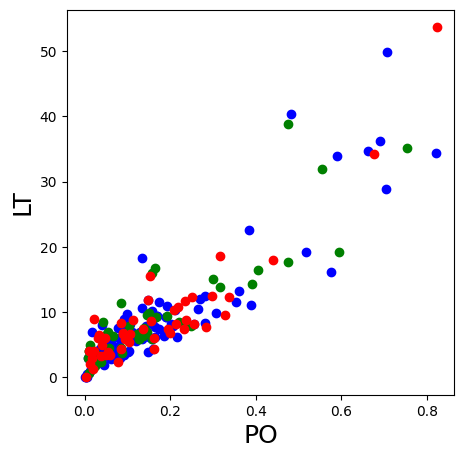

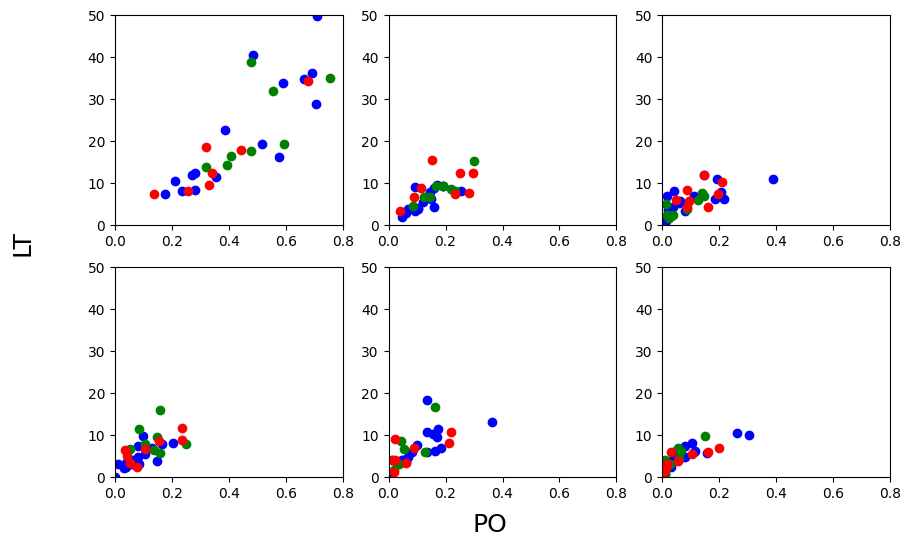

In [288]:
# Percentage of Occupancy vs Lifetime: Scatter Plot
colorz = ['blue','green','red']
groupz = ['C', 'B', 'NB']


# All the states
fig, ax = plt.subplots(1, figsize=(5, 5))
for i in range(3):
    LT = df_metrics.loc[df_metrics['group']==groupz[i]]['LT'].values
    PO = df_metrics.loc[df_metrics['group']==groupz[i]]['PO'].values

    ax.scatter(PO, LT, c=colorz[i])
    ax.set_ylabel('LT', fontsize=18)
    ax.set_xlabel('PO', fontsize=18)
    
# State by state
fig, axs = plt.subplots(2, 3, figsize=(10, 6))
for s,ax in enumerate(axs.flat):
    for i in range(3):
        s_ = s + 1
        LT = df_metrics.loc[df_metrics['group']==groupz[i]].loc[df_metrics['state']==s_]['LT'].values
        PO = df_metrics.loc[df_metrics['group']==groupz[i]].loc[df_metrics['state']==s_]['PO'].values

        ax.scatter(PO, LT, c=colorz[i])
        ax.set_xlim(0,0.8)
        ax.set_ylim(0,50)
fig.supxlabel('PO', fontsize=18)
fig.supylabel('LT', fontsize=18)

### Lifetime and Percentage of Occupancy representation (single subject representation) 

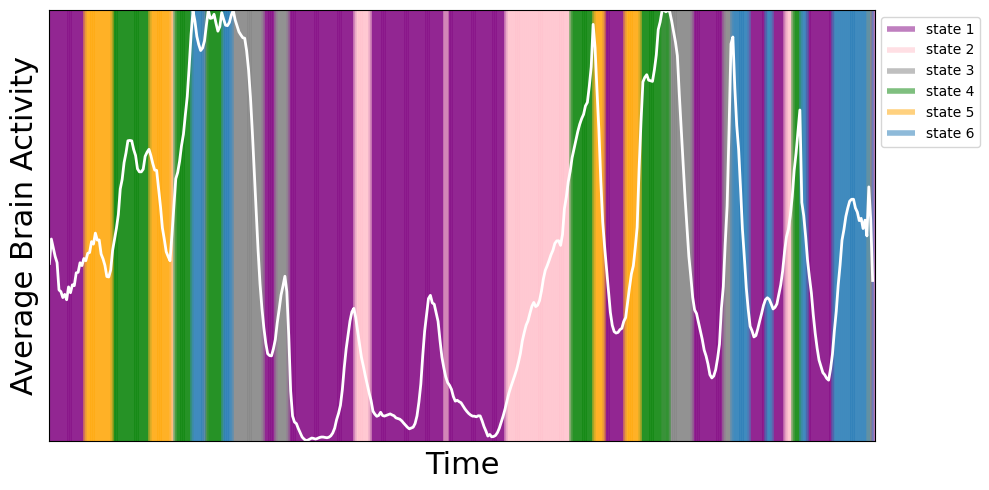

In [185]:
today = date.today()
DATE = today.strftime("%d%m%Y")
# checking if the directory exists or not
if not os.path.exists('output/GraphAnal/'+DATE+'/K'+str(K)):
      
    # if the demo_folder directory is not present 
    # then create it.
    os.makedirs('output/GraphAnal/'+DATE+'/K'+str(K))

cs = ['purple', 'pink', 'grey', 'green', 'orange', 'tab:blue'] 
s=9

fig, ax = plt.subplots(1, figsize=(10,5))
ax.set_xticks([]);
ax.set_yticks([]);
for k_ in range(1,K+1):
    ax.vlines(np.where(state_labels[time_points*s:time_points*(s+1)]==k_),
              ymin=np.mean(Ev[time_points*s:time_points*(s+1)],axis=1).min(),
              ymax=np.mean(Ev[time_points*s:time_points*(s+1)],axis=1).max(), alpha=0.5,
              linewidth=4, color=cs[k_-1], label='state '+str(k_))
ax.plot(np.mean(Ev[time_points*s:time_points*(s+1)],axis=1), linewidth=2, color='white')
ax.set_xlim(0, time_points)
ax.set_ylim(np.mean(Ev[time_points*s:time_points*(s+1)],axis=1).min(),
            np.mean(Ev[time_points*s:time_points*(s+1)],axis=1).max())
ax.set_xlabel('Time', fontsize=22)
ax.set_ylabel('Average Brain Activity', fontsize=22)

plt.legend(bbox_to_anchor=(1,1))
plt.tight_layout()
plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/LT&PO_example_'+DATE+'_white.png',
            dpi=200)

# Network analysis with phase locking matrices

In [28]:
statannotations.__version__

'0.5.0'

K= 2
(2, 234)
2
STATE  1
STATE  2
K= 3
(3, 234)
3
STATE  1
STATE  2
STATE  3
K= 4
(4, 234)
4
STATE  1
STATE  2
STATE  3
STATE  4
K= 5
(5, 234)
5
STATE  1
STATE  2
STATE  3
STATE  4
STATE  5


<timed exec>:104: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


K= 6
(6, 234)
6
STATE  1
STATE  2
STATE  3
STATE  4
STATE  5
STATE  6
K= 7
(7, 234)
7
STATE  1
STATE  2
STATE  3
STATE  4
STATE  5
STATE  6
STATE  7
K= 8
(8, 234)
8
STATE  1
STATE  2
STATE  3
STATE  4
STATE  5
STATE  6
STATE  7
STATE  8
K= 9
(9, 234)
9
STATE  1
STATE  2
STATE  3
STATE  4
STATE  5
STATE  6
STATE  7
STATE  8
STATE  9
K= 10
(10, 234)
10
STATE  1
STATE  2
STATE  3
STATE  4
STATE  5
STATE  6
STATE  7
STATE  8
STATE  9
STATE  10
CPU times: user 7h 1min 16s, sys: 22.3 s, total: 7h 1min 38s
Wall time: 7h 1min 16s


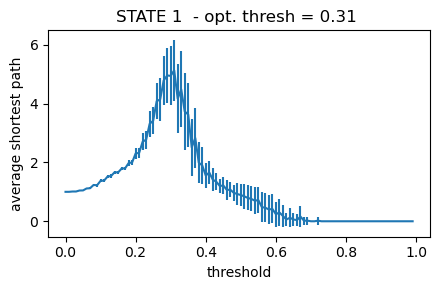

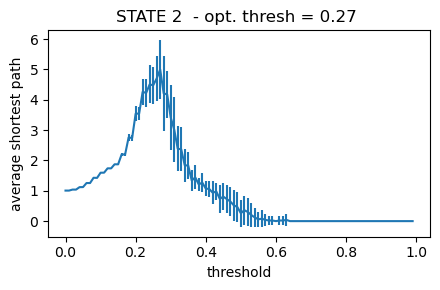

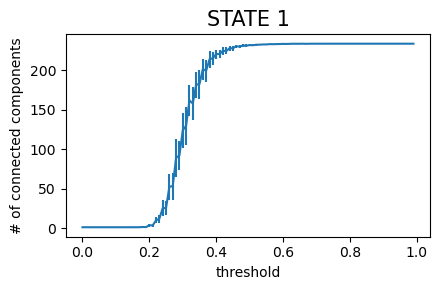

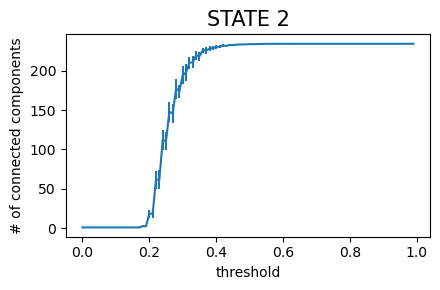

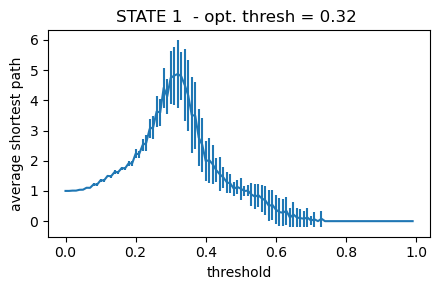

...

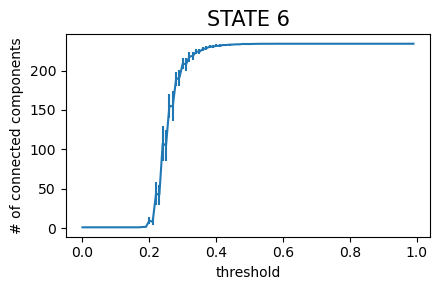

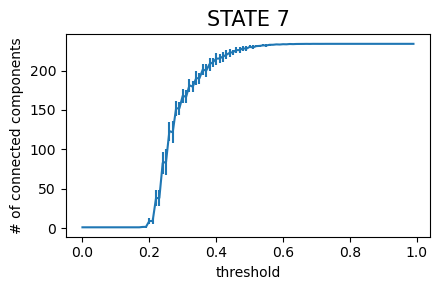

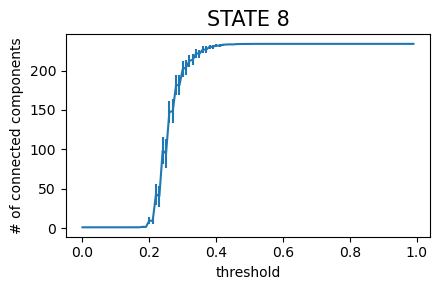

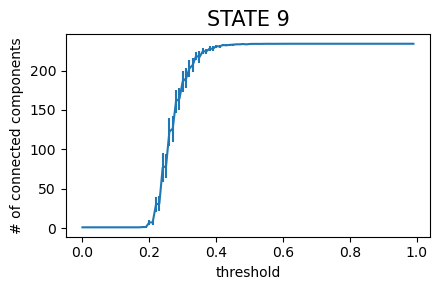

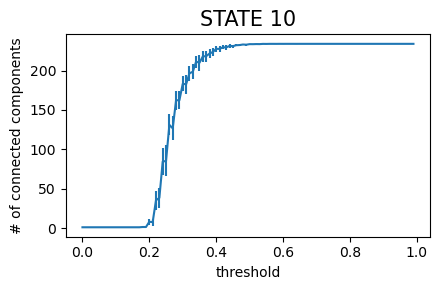

In [35]:
%%time

############################
### PERCOLATION ANALYSIS ###
############################

# Guardo come variano le metriche (tipo average shortest path e number of connected components) al variare della
# threshold che applico per binarizzare il grafo.
# Dovrei anche guardare cosa succede se vario la threshold che uso per le singole matrice di phase locking, ma lo
# facciamo un'altra volta

# I want to find the proper threshold for each states
# Explore the thresholds from -1

state_thresh_allK = []
for K in range(2,10+1): # Loop over K
    print('K=',K)
    k = K - 2 # MD start to cluster from K=2
    # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
    state_labels = state_labels_list[k]
    # print(state_labels.shape, state_labels.max())
    centroids = kmeans_leida[k]['C']
    print(centroids.shape)
    
    # time points belonging to each state [state x time points]
    states_index = []
    for s in np.unique(state_labels):
        states_index.append(np.where(state_labels==s))
    print(len(states_index))
    
    # Divide states indexes by group
    groups_index = []
    for g in np.unique(group_labels):
        groups_index.append(np.where(group_labels==g)[0])
        
    states_index_groups = [] # [state 1, state2, state 3]
    for s in states_index:
        groupz = {0:[], 1:[], 2:[]}
        for t in s[0]:
            groupz[group_labels[t][0]].append(t)
        states_index_groups.append(groupz)
    
    states_mets = []
    states_mets_2 = []
    for s in range(K): # Loop over states
        print('STATE ', s+1)
        mets = []
        mets_2 = []
        x = np.arange(0,1,0.01)
    #     x = [0.2, 0.6]
        for thresh_2 in x:
            # if thresh_2%0.2==0:
            #     print(thresh_2)
            thresh = 0.99
            n_pick = 50
            n_samp = 50
    
            met = []
            met_2 = []
            for t in range(n_pick):
                # Pick a random s-ample of phase locking matrix
                idxs = random.choices(states_index[s][0], k=n_samp)
                mat = np.empty((0,plm_tc.shape[-2],plm_tc.shape[-1]))
                for j in idxs:
    #                 print('pino', j)
                    np.fill_diagonal(plm_tc[j], 0) # Remove ones on the diagonal
                    m = plm_tc[j]
                    m = np.abs(m)
                    m[np.where(m<thresh)] = 0
                    mat = np.concatenate((mat, np.expand_dims(m, axis=0)))
                meanchia = mat.mean(axis=0)
                # Devo thresholdare pure la matrice media
                meanchia[np.where(meanchia<thresh_2)] = 0
    
                # MEANCHIA DEVO TRESHOLDARLA PRIMA DI CREARE IL GRAFO
                G = nx.from_numpy_array(meanchia)
                # Which metrics I want to look at
                met.append(graph_metrics('average_shortest_path', G))
                met_2.append(graph_metrics('number_connected_components', G))
            mets.append(met)
            mets_2.append(met_2)
        states_mets.append(mets)
        states_mets_2.append(mets_2)
    
    ###########################
    ### PLOTS and THRESHOLD ###
    ###########################
    
    # shortest path 
    y_states = []
    y_err_states = []
    for mets in states_mets:
        y = []
        y_err = []
        for m in mets:
    #         y.append(np.median(m))
            y.append(np.mean(m))
    
            y_err.append(np.std(m))
        y_states.append(y)
        y_err_states.append(y_err)
    
    states_thresh = [] # For each state store threshold computed with percolation analysis
    
    for s,met in enumerate(y_states):
        fig = plt.figure(figsize=(4.5,3))
        plt.title('STATE {}  - opt. thresh = {} '.format(s+1, round(x[np.argmax(y_states[s])], 4)), 
                                             fontsize=12)
        plt.errorbar(x, met, yerr=y_err_states[s])
        plt.xlabel('threshold')
        plt.ylabel('average shortest path')
        states_thresh.append(x[np.argmax(y_states[s])])    
        fig.tight_layout()
        plt.savefig('output/MD_05122023_noclustfilt/K'+str(K)+'/Percolation_ShortestPath_npick'+str(n_pick)+ \
                    '_nsamp'+str(n_samp)+'_K'+str(K)+'_state'+str(s+1)+'.png',
                    dpi=200)
    
        
    # number connected components
    y_states_2 = []
    y_err_states_2 = []
    for mets in states_mets_2:
        y = []
        y_err = []
        for m in mets:
    #         y.append(np.median(m))
            y.append(np.mean(m))
    
            y_err.append(np.std(m))
        y_states_2.append(y)
        y_err_states_2.append(y_err)
    
    for s,met in enumerate(y_states_2):
        fig = plt.figure(figsize=(4.5,3))
        plt.title('STATE {}'.format(s+1), fontsize=15)
        plt.errorbar(x, met, yerr=y_err_states_2[s])
        plt.xlabel('threshold')
        plt.ylabel('# of connected components')
        fig.tight_layout()
        plt.savefig('output/MD_05122023_noclustfilt/K'+str(K)+'/Percolation_NumConnComp_npick'+str(n_pick)+ \
                    '_nsamp'+str(n_samp)+'_K'+str(K)+'_state'+str(s+1)+'.png',
                    dpi=200)
    
        
    state_thresh_allK.append(states_thresh)

with open('output/MD_05122023_noclustfilt/opt_thresh.pickle', 'wb') as handle:
    pickle.dump(state_thresh_allK, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [56]:
# Optimal thresholds
with open('output/MD_05122023_noclustfilt/opt_thresh.pickle', 'rb') as handle:
    opt_threshes = pickle.load(handle)

(2, 234)
2
average_shortest_path
average_shortest_path


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e+00
1_B vs. 1_NB: Custom statistical test, P_val:1.000e+00
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
number_connected_components
number_connected_components


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:1.000e+00
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
size_giant_component
size_giant_component


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:5.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:5.000e-02
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
fraction_of_edges
fraction_of_edges


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:5.000e-02
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
average_degree
average_degree


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

2_B vs. 2_NB: Custom statistical test, P_val:5.000e-02
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e+00
1_B vs. 1_NB: Custom statistical test, P_val:1.000e-02
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
average_local_efficiency
average_local_efficiency


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

2_B vs. 2_NB: Custom statistical test, P_val:5.000e-02
1_C vs. 1_B: Custom statistical test, P_val:5.000e-02
2_C vs. 2_B: Custom statistical test, P_val:1.000e+00
1_B vs. 1_NB: Custom statistical test, P_val:1.000e-02
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
global_efficiency
global_efficiency


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:5.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:5.000e-02
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
(3, 234)
3
average_shortest_path
average_shortest_path
average_shortest_path


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e+00
1_B vs. 1_NB: Custom statistical test, P_val:1.000e+00
3_C vs. 3_NB: Custom statistical test, P_val:1.000e+00
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
number_connected_components
number_connected_components
number_connected_components


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:5.000e-02
3_C vs. 3_NB: Custom statistical test, P_val:1.000e-02
2_C vs. 2_NB: Custom statistical test, P_val:5.000e-02
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
size_giant_component
size_giant_component
size_giant_component


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:5.000e-02
3_C vs. 3_NB: Custom statistical test, P_val:1.000e-02
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
fraction_of_edges
fraction_of_edges
fraction_of_edges


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:5.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:5.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:5.000e-02
3_C vs. 3_NB: Custom statistical test, P_val:1.000e-02
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
average_degree
average_degree
average_degree


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:5.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e+00
1_B vs. 1_NB: Custom statistical test, P_val:5.000e-02
3_C vs. 3_NB: Custom statistical test, P_val:1.000e-02
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
average_local_efficiency
average_local_efficiency
average_local_efficiency


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:5.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e+00
1_B vs. 1_NB: Custom statistical test, P_val:5.000e-02
3_C vs. 3_NB: Custom statistical test, P_val:5.000e-02
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
global_efficiency
global_efficiency
global_efficiency


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:5.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:5.000e-02
3_C vs. 3_NB: Custom statistical test, P_val:1.000e-02
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
(4, 234)
4
average_shortest_path
average_shortest_path
average_shortest_path
average_shortest_path


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e+00
1_B vs. 1_NB: Custom statistical test, P_val:1.000e+00
3_C vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_C vs. 4_NB: Custom statistical test, P_val:1.000e+00


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:5.000e-02
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:1.000e+00
3_C vs. 3_NB: Custom statistical test, P_val:5.000e-02
4_C vs. 4_NB: Custom statistical test, P_val:1.000e-02


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:5.000e-02
3_C vs. 3_NB: Custom statistical test, P_val:1.000e-02
4_C vs. 4_NB: Custom statistical test, P_val:1.000e-02


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:5.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:5.000e-02
3_C vs. 3_NB: Custom statistical test, P_val:5.000e-02
4_C vs. 4_NB: Custom statistical test, P_val:1.000e-02


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:5.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e+00
1_B vs. 1_NB: Custom statistical test, P_val:1.000e-02
3_C vs. 3_NB: Custom statistical test, P_val:5.000e-02
4_C vs. 4_NB: Custom statistical test, P_val:1.000e-02


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:5.000e-02
4_C vs. 4_B: Custom statistical test, P_val:5.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:5.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e+00
1_B vs. 1_NB: Custom statistical test, P_val:5.000e-02
3_C vs. 3_NB: Custom statistical test, P_val:5.000e-02
4_C vs. 4_NB: Custom statistical test, P_val:1.000e-02


/tmp/ipykernel_1804166/1291858083.py:98: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots(1,1, figsize=(K*2,5))
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_180416

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:5.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:1.000e-02
3_C vs. 3_NB: Custom statistical test, P_val:5.000e-02
4_C vs. 4_NB: Custom statistical test, P_val:1.000e-02


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_va

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:5.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_va

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:5.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:5.000e-02
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_va

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:5.000e-02
5_B vs. 5_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_va

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:5.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statisti

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:5.000e-02
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statisti

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:5.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statisti

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e+00
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statisti

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e+00
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statisti

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e+00
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statisti

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statisti

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Cus

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
3_B vs. 3_NB: Cus

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
3_B vs. 3_NB: Cus

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
3_B vs. 3_NB: Cus

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
3_B vs. 3_NB: Cus

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:5.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
3_B vs. 3_NB: Cus

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
3_B vs. 3_NB: Cus

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:5.000e-02
8_C 

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
8_C 

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
8_C 

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
8_C 

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
8_C 

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:5.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
8_C 

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:5.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
8_C 

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:5.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:5.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:5.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:5.000e-02
5_C vs. 5_B: Custom statistical test, P_val:5.000e-02
6_C vs. 6_B: Custom statistical test, P_val:

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:5.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(10, 'C'), (10, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(10, 'C'), (10, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')], [(10, 'B'), (10, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:5.000e-02
5_C vs. 5_B: Custom stat

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(10, 'C'), (10, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(10, 'C'), (10, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')], [(10, 'B'), (10, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom stat

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(10, 'C'), (10, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(10, 'C'), (10, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')], [(10, 'B'), (10, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:5.000e-02
5_C vs. 5_B: Custom stat

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(10, 'C'), (10, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(10, 'C'), (10, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')], [(10, 'B'), (10, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:5.000e-02
4_C vs. 4_B: Custom statistical test, P_val:5.000e-02
5_C vs. 5_B: Custom stat

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(10, 'C'), (10, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(10, 'C'), (10, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')], [(10, 'B'), (10, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom stat

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(10, 'C'), (10, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(10, 'C'), (10, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')], [(10, 'B'), (10, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:5.000e-02
5_C vs. 5_B: Custom stat

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

[[(1, 'C'), (1, 'B')], [(2, 'C'), (2, 'B')], [(3, 'C'), (3, 'B')], [(4, 'C'), (4, 'B')], [(5, 'C'), (5, 'B')], [(6, 'C'), (6, 'B')], [(7, 'C'), (7, 'B')], [(8, 'C'), (8, 'B')], [(9, 'C'), (9, 'B')], [(10, 'C'), (10, 'B')], [(1, 'C'), (1, 'NB')], [(2, 'C'), (2, 'NB')], [(3, 'C'), (3, 'NB')], [(4, 'C'), (4, 'NB')], [(5, 'C'), (5, 'NB')], [(6, 'C'), (6, 'NB')], [(7, 'C'), (7, 'NB')], [(8, 'C'), (8, 'NB')], [(9, 'C'), (9, 'NB')], [(10, 'C'), (10, 'NB')], [(1, 'B'), (1, 'NB')], [(2, 'B'), (2, 'NB')], [(3, 'B'), (3, 'NB')], [(4, 'B'), (4, 'NB')], [(5, 'B'), (5, 'NB')], [(6, 'B'), (6, 'NB')], [(7, 'B'), (7, 'NB')], [(8, 'B'), (8, 'NB')], [(9, 'B'), (9, 'NB')], [(10, 'B'), (10, 'NB')]]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:5.000e-02
5_C vs. 5_B: Custom stat

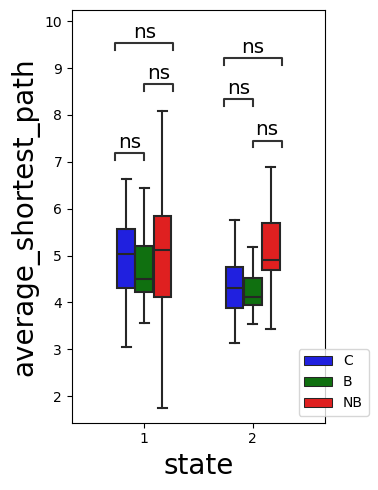

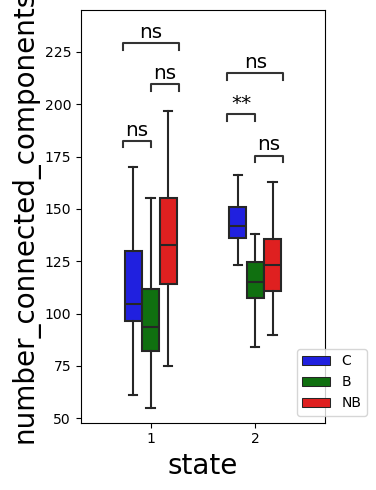

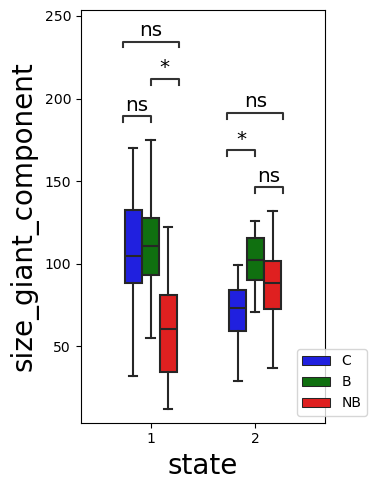

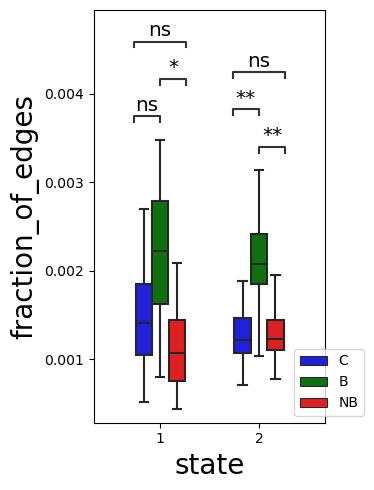

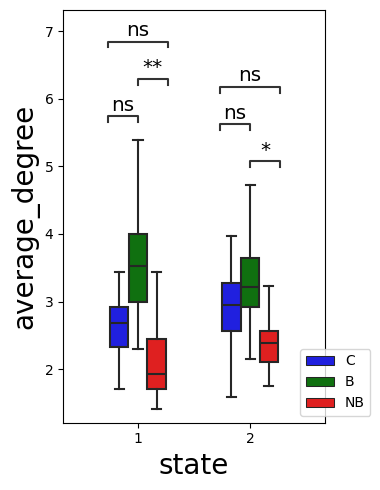

...

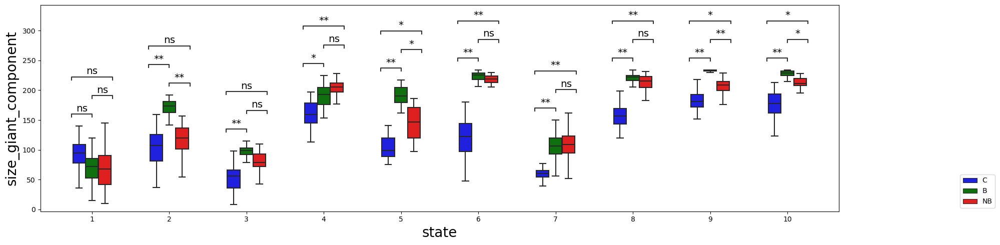

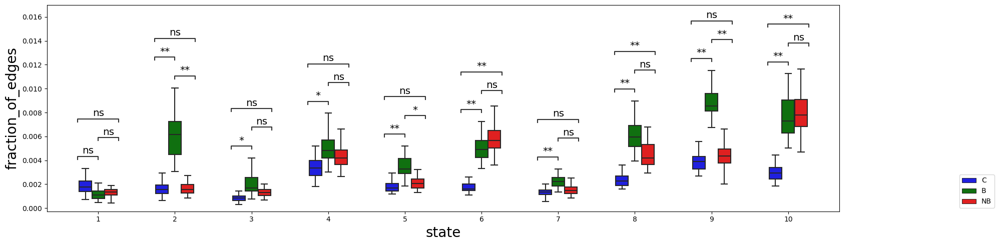

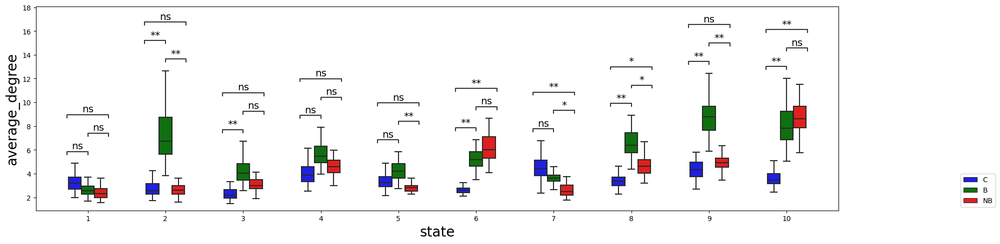

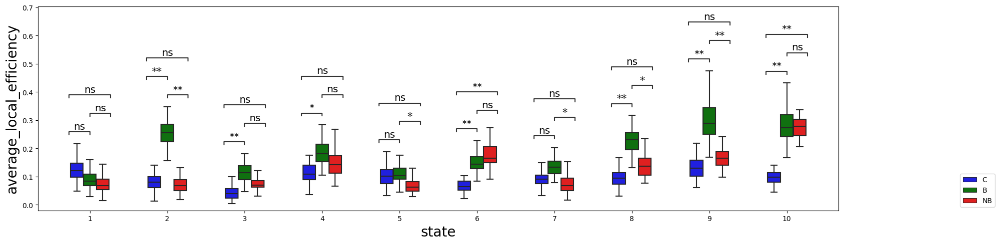

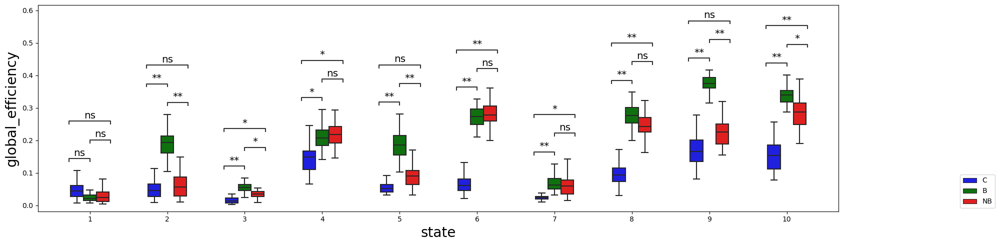

In [47]:
# GLOBAL METRICS

# Once I compute the optimal threshold I can compare metrics between groups
metriche = ['average_shortest_path','number_connected_components','size_giant_component',
            'fraction_of_edges','average_degree',
            'average_local_efficiency', 'global_efficiency']
# metriche = ['average_shortest_path']

eps = 0.1
for i,K in enumerate(range(2,10+1)): # Loop over K
    k = K - 2 # MD start to cluster from K=2
    # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
    state_labels = state_labels_list[k]
    # print(state_labels.shape, state_labels.max())
    centroids = kmeans_leida[k]['C']
    print(centroids.shape)
    
    # time points belonging to each state [state x time points]
    states_index = []
    for s in np.unique(state_labels):
        states_index.append(np.where(state_labels==s))
    print(len(states_index))
    
    # Divide states indexes by group
    groups_index = []
    for g in np.unique(group_labels):
        groups_index.append(np.where(group_labels==g)[0])
        
    states_index_groups = [] # [state 1, state2, state 3]
    for s in states_index:
        groupz = {0:[], 1:[], 2:[]}
        for t in s[0]:
            groupz[group_labels[t][0]].append(t)
        states_index_groups.append(groupz)

    for metrica in metriche:
        df_metrics = [] # List which contains dataframe for each state
        metrics = [] # metrics for each state
        for s in range(K): # Loop over states - exclude baseline state (0), ma lo faccio già prima
            thresh_2 = state_thresh_allK[i][s]
            print(metrica)
            thresh = 0.99
            n_pick = 50
            n_samp = 50
            mets = [] # metrics for each group
            # I have to evaluate the metrics for the three groups
            for g_idx in range(3):
                met = []
                for t in range(n_pick):
                    # Pick a random s-ample of phase locking matrix
                    idxs = random.choices(states_index_groups[s][g_idx], k=n_samp)
                    mat = np.empty((0,plm_tc.shape[-2],plm_tc.shape[-1]))
                    for j in idxs:
                        np.fill_diagonal(plm_tc[j], 0) # Remove ones on the diagonal
                        m = plm_tc[j]
                        m = np.abs(m)
                        m[np.where(m<thresh)] = 0
                        mat = np.concatenate((mat, np.expand_dims(m, axis=0)))
                    meanchia = mat.mean(axis=0)
                    # Devo thresholdare pure la matrice media
                    meanchia[np.where(meanchia<thresh_2)] = 0
    
                    # MEANCHIA DEVO TRESHOLDARLA PRIMA DI CREARE IL GRAFO
                    G = nx.from_numpy_array(meanchia)
                    # Which metrics I want to look at
                    met.append(graph_metrics(metrica, G))
                mets.append(met)
            metrics.append(mets)
            
        mmm = []
        ggg = []
        sss = []
        for kkk, m_state in enumerate(metrics):
            mmm += m_state[0] + m_state[1] + m_state[2]
            ggg += ['C']*len(m_state[0]) + ['B']*len(m_state[1]) + ['NB']*len(m_state[2])
            sss += [kkk+1]*len(m_state[0] + m_state[1] + m_state[2])
        df_metrics = pd.DataFrame(data = {metrica: mmm, 'groups': ggg, 'state':sss})
        
        state_order = [s for s in range(1,K+1)]
        groups_order = ['C', 'B', 'NB']
        pairs = [[(k,'C'),(k,'B')] for k in range(1,K+1)] + \
                 [[(k,'C'),(k,'NB')] for k in range(1,K+1)] + \
                 [[(k,'B'),(k,'NB')] for k in range(1,K+1)]
        my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    #     annot_test =  'Brunner-Munze'
        annot_test = 't-test_ind'
    
        hue_plot_params = {
            'data': df_metrics,
            'x': 'state',
            'y': metrica,
            "order": state_order,
            "hue": 'groups',
            "hue_order": groups_order,
            "palette": my_pal
        }
        
        fig,ax = plt.subplots(1,1, figsize=(K*2,5))
        with sns.plotting_context("notebook", font_scale = 1.2):
            # Create new plot
        #     ax = get_log_ax()
    
            # Plot with seaborn
            sns.boxplot(ax=ax, **hue_plot_params,
                             showfliers=False,
                             width=0.5)
            ax.set_xlabel('state',fontsize=20)
            ax.set_ylabel(metrica, fontsize=20)
    
            # Add annotations
            # Cohen's D calculation
            pvalues = annotate_D(pairs, metrica, df_metrics)
            print(pairs)
            annotator = Annotator(ax, pairs, **hue_plot_params)
            annotator.set_pvalues(pvalues)
            annotator.annotate()
    #         annamobbene = annotator.configure(test=annot_test).apply_and_annotate()
    
            # Label and show
            plt.legend(loc='lower right', fontsize=10, bbox_to_anchor=(1.2,0))
        plt.tight_layout()
        plt.savefig('output/MD_05122023_noclustfilt/K'+str(K)+'/GMETRICS_'+metrica+'_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_K'+str(K)+'.png',
                    dpi=200)
            
    #     fig = plt.figure(figsize=(6,4))
    #     plt.title(metrica)
    #     with open('output/GraphAnal/'+DATE+'/'+metrica+'_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'_ttest.txt', 'w') as f:
    #         for s in range(K):
    #         #     plt.ylim(0,1)
    #             bp = plt.boxplot([metrics[s][0], metrics[s][1], metrics[s][2]], positions = [s-eps, s, s+eps],
    #                              patch_artist=True,
    #                              labels=['','State'+str(s+1),''], showfliers=False)
    #             bp['boxes'][0].set_facecolor('blue')
    #             bp['boxes'][1].set_facecolor('green')
    #             bp['boxes'][2].set_facecolor('red')
    
    #             # t-tests 
    #             print('STATE ', s+1)
    #             test1 = ttest_ind(metrics[s][0], metrics[s][1])
    #             print(test1)
    #             test2 = ttest_ind(metrics[s][0], metrics[s][2])
    #             print(test2)
    #             test3 = ttest_ind(metrics[s][1], metrics[s][2])
    #             print(test3)
    #             print('\n')
    
    # #             # WRIte ttest results
    # #             f.write('STATE {}'.format(str(s+1)))
    # #             f.write('\n')
    # #             f.write(str(test1))
    # #             f.write(' CvsB')
    # #             f.write('\n')
    # #             f.write(str(test2))
    # #             f.write(' CvsNB')
    # #             f.write('\n')
    # #             f.write(str(test3))
    # #             f.write(' BvsNB')
    # #             f.write('\n')
    
    #     plt.legend([bp["boxes"][0], bp["boxes"][1], bp["boxes"][2]], ['C', 'B', 'NB'], loc='upper left')    
    #     p_1 = ttest_ind(C_met, B_met)[1]
    #     axs.set_title(metrica+' - p CvsB = {} CvsNB = {} BvsNB = {}'.format(round(p_1,4), round(p_2,4), round(p_3,4)), fontsize=11)
    #     axs.boxplot([C_met, B_met, NB_met], labels=['C','B','NB'], showfliers=False);

(2, 234)
2
STATE  1
STATE  2


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:1.000e+00
2_C vs. 2_NB: Custom statistical test, P_val:5.000e-02
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
(3, 234)
3
STATE  1
STATE  2
STATE  3


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:5.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:1.000e+00
3_C vs. 3_NB: Custom statistical test, P_val:1.000e+00
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
(4, 234)
4
STATE  1
STATE  2
STATE  3
STATE  4


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:5.000e-02
2_C vs. 2_B: Custom statistical test, P_val:1.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:1.000e+00
3_C vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_C vs. 4_NB: Custom statistical test, P_val:1.000e-02
2_C vs. 2_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00
(5, 234)
5
STATE  1
STATE  2
STATE  3
STATE  4
STATE  5


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:1.000e+00
3_C vs. 3_NB: Custom statistical test, P_val:1.000e-02
4_C vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_C vs. 5_NB: Custom statistical test, P_val:1.000e-02
2_C vs. 2_NB: Custom statistical test, P_val:5.000e-02
1_C vs. 1_NB: Custom statistical test, P_val:1.000e+00

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:5.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:5.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statistical test, P_val:1.000e+00
6_B vs. 6_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:1.000e+00
3_C vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_C vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_C vs. 5_NB: Custom statistical test, P_val:5.000e-02


/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e+00
4_C vs. 4_B: Custom statistical test, P_val:5.000e-02
5_C vs. 5_B: Custom statistical test, P_val:1.000e+00
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statistical test, P_val:1.000e+00
6_B vs. 6_NB: Custom statistical test, P_val:1.000e+00
7_B vs. 7_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e-02
1_B vs. 1_NB: Custom statistical test, P_val:1.000e+00
3_C vs. 3_NB: Custom statistical test, P_val:5.000e-02
4

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e+00
7_C vs. 7_B: Custom statistical test, P_val:5.000e-02
8_C vs. 8_B: Custom statistical test, P_val:5.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statistical test, P_val:1.000e+00
6_B vs. 6_NB: Custom statistical test, P_val:1.000e+00
7_B vs. 7_NB: Custom statistical test, P_val:1.000e-02
8_B vs. 8_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_C vs. 2_B: Custom statistical test, P_val:1.000e-02
1_

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:1.000e+00
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e+00
8_C vs. 8_B: Custom statistical test, P_val:1.000e-02
9_C vs. 9_B: Custom statistical test, P_val:1.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e+00
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statistical test, P_val:1.000e+00
6_B vs. 6_NB: Custom statistical test, P_val:1.000e+00
7_B vs. 7_NB: Custom statistical test, P_val:1.000e+00
8_B vs. 8_NB: Custom statistical test, P_val:5.000e-02
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_

/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_1804166/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_1804166/1589032101.p

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

3_C vs. 3_B: Custom statistical test, P_val:1.000e-02
4_C vs. 4_B: Custom statistical test, P_val:1.000e+00
5_C vs. 5_B: Custom statistical test, P_val:1.000e-02
6_C vs. 6_B: Custom statistical test, P_val:1.000e-02
7_C vs. 7_B: Custom statistical test, P_val:1.000e-02
8_C vs. 8_B: Custom statistical test, P_val:1.000e+00
9_C vs. 9_B: Custom statistical test, P_val:5.000e-02
2_B vs. 2_NB: Custom statistical test, P_val:1.000e-02
3_B vs. 3_NB: Custom statistical test, P_val:1.000e+00
4_B vs. 4_NB: Custom statistical test, P_val:1.000e+00
5_B vs. 5_NB: Custom statistical test, P_val:1.000e+00
6_B vs. 6_NB: Custom statistical test, P_val:1.000e+00
7_B vs. 7_NB: Custom statistical test, P_val:1.000e+00
8_B vs. 8_NB: Custom statistical test, P_val:1.000e+00
1_C vs. 1_B: Custom statistical test, P_val:1.000e+00
2_

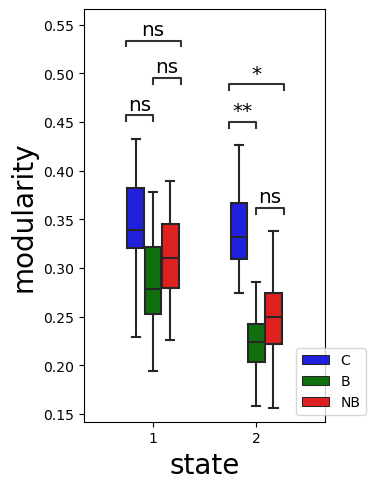

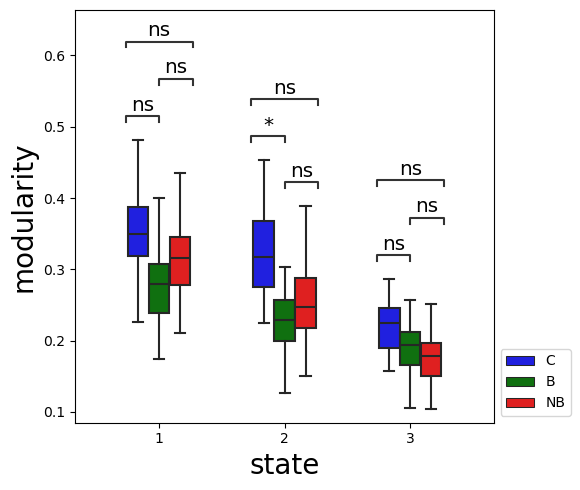

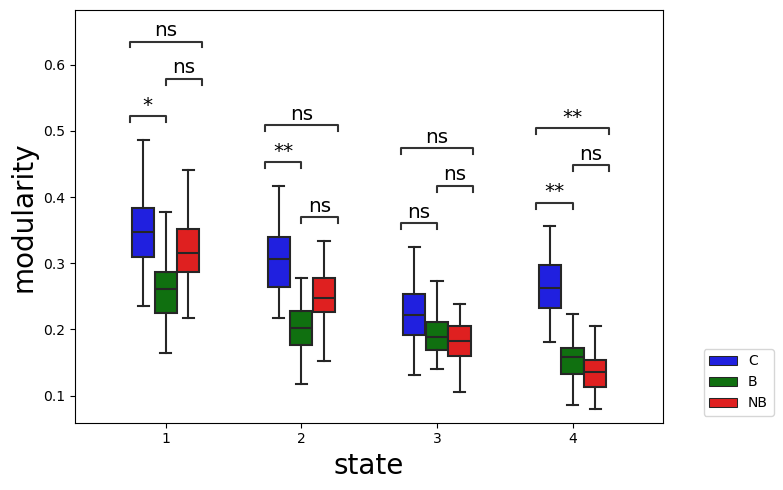

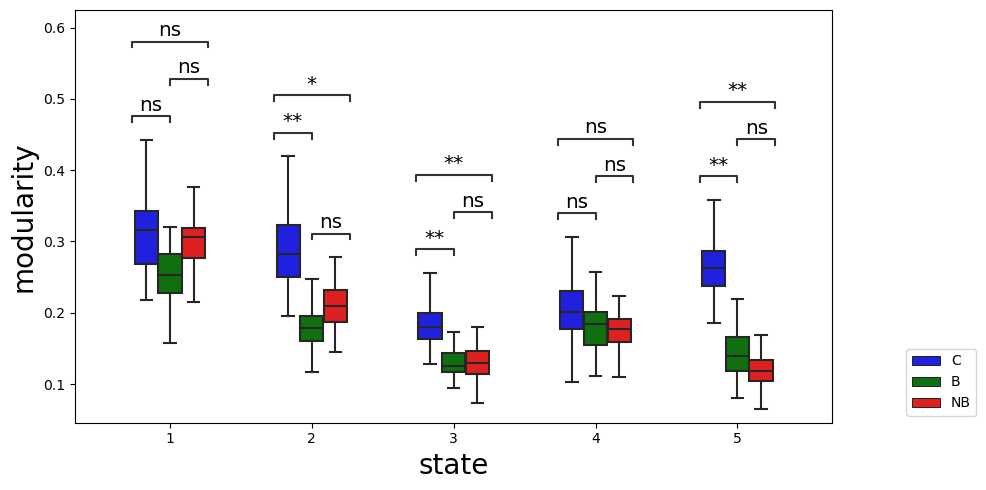

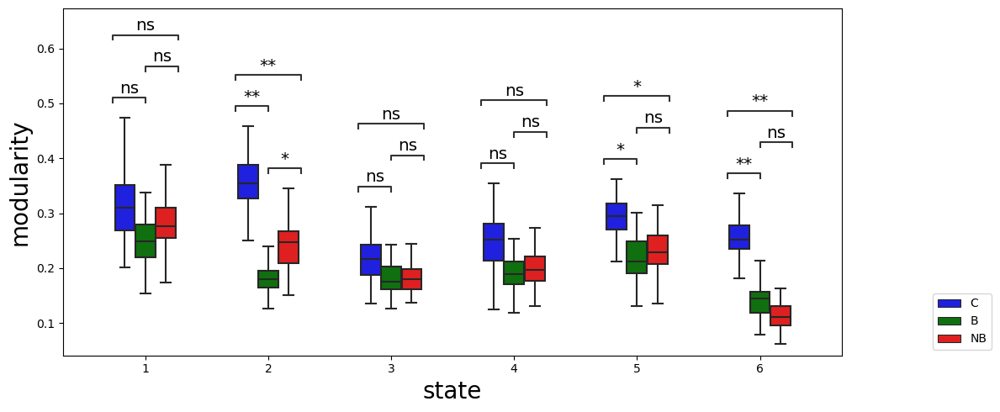

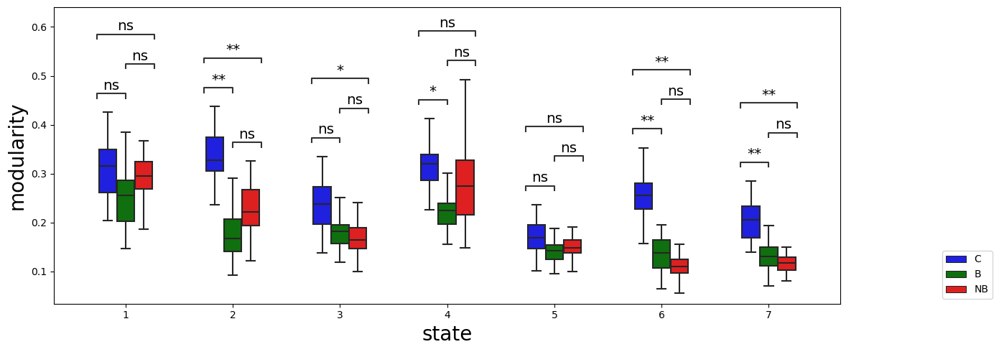

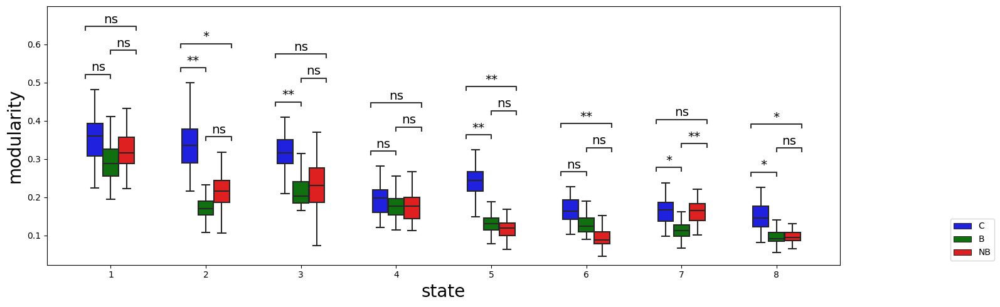

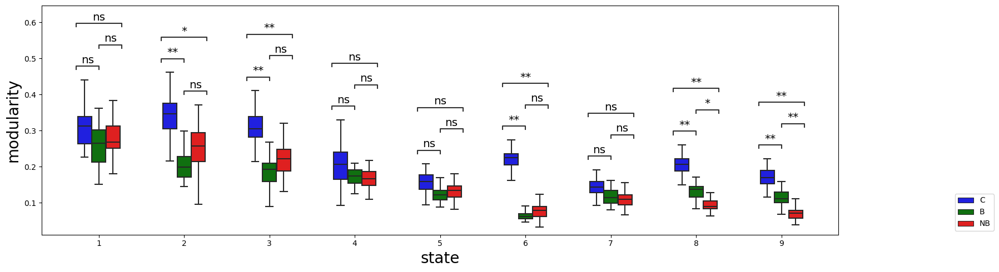

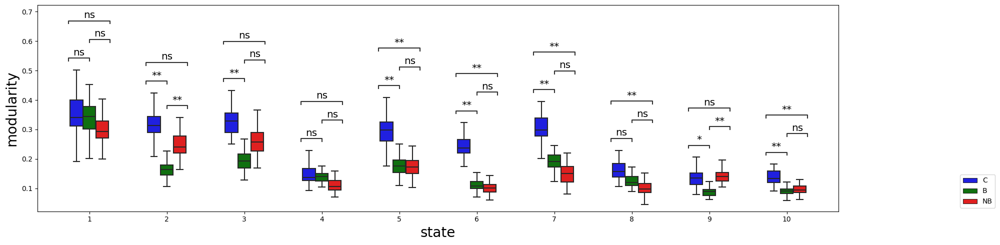

In [55]:
%%time
### MODULARITY ###

# EFFICIENCY, INTEGRATION and SEGREGATION
# Modularity measures segregation
eps = 0.1

for i,K in enumerate(range(2,10+1)): # Loop over K
    k = K - 2 # MD start to cluster from K=2
    # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
    state_labels = state_labels_list[k]
    # print(state_labels.shape, state_labels.max())
    centroids = kmeans_leida[k]['C']
    print(centroids.shape)
    
    # time points belonging to each state [state x time points]
    states_index = []
    for s in np.unique(state_labels):
        states_index.append(np.where(state_labels==s))
    print(len(states_index))
    
    # Divide states indexes by group
    groups_index = []
    for g in np.unique(group_labels):
        groups_index.append(np.where(group_labels==g)[0])
        
    states_index_groups = [] # [state 1, state2, state 3]
    for s in states_index:
        groupz = {0:[], 1:[], 2:[]}
        for t in s[0]:
            groupz[group_labels[t][0]].append(t)
        states_index_groups.append(groupz)
    
    metrics = [] # metrics for each state
    for s in range(K): # Loop over states
        print('STATE ', s+1)
        thresh_2 = state_thresh_allK[i][s]
        thresh = 0.99
        n_pick = 50
        n_samp = 50
        mets = [] # metrics for each group
        # I have to evaluate the metrics for the three groups
        for g_idx in range(3):
            met = []
            for t in range(n_pick):
                # Pick a random s-ample of phase locking matrix
                idxs = random.choices(states_index_groups[s][g_idx], k=n_samp)
                mat = np.empty((0,plm_tc.shape[-2],plm_tc.shape[-1]))
                for j in idxs:
                    np.fill_diagonal(plm_tc[j], 0) # Remove ones on the diagonal
                    m = plm_tc[j]
                    m = np.abs(m)
                    m[np.where(m<thresh)] = 0
                    mat = np.concatenate((mat, np.expand_dims(m, axis=0)))
                meanchia = mat.mean(axis=0)
                # Devo thresholdare pure la matrice media
                meanchia[np.where(meanchia<thresh_2)] = 0
    
                # MEANCHIA DEVO TRESHOLDARLA PRIMA DI CREARE IL GRAFO
                G = nx.from_numpy_array(meanchia)
                # Which metrics I want to look at
                met.append(nx.community.modularity(G, list(mas_list.values())))
                
            mets.append(met) # groups
        metrics.append(mets) # states
    
    mmm = []
    ggg = []
    sss = []
    for kkk, m_state in enumerate(metrics):
        mmm += m_state[0] + m_state[1] + m_state[2]
        ggg += ['C']*len(m_state[0]) + ['B']*len(m_state[1]) + ['NB']*len(m_state[2])
        sss += [kkk+1]*len(m_state[0] + m_state[1] + m_state[2])
    df_metrics = pd.DataFrame(data = {'modularity': mmm, 'groups': ggg, 'state':sss})
    
    state_order = [s for s in range(1,K+1)]
    groups_order = ['C', 'B', 'NB']
    pairs = [[(k,'C'),(k,'B')] for k in range(1,K+1)] + \
             [[(k,'C'),(k,'NB')] for k in range(1,K+1)] + \
             [[(k,'B'),(k,'NB')] for k in range(1,K+1)]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    #     annot_test =  'Brunner-Munze'
    annot_test = 't-test_ind'
    
    hue_plot_params = {
        'data': df_metrics,
        'x': 'state',
        'y': 'modularity',
        "order": state_order,
        "hue": 'groups',
        "hue_order": groups_order,
        "palette": my_pal
    }
    
    fig,ax = plt.subplots(1,1, figsize=(K*2,5))
    with sns.plotting_context("notebook", font_scale = 1.2):
        # Create new plot
    #     ax = get_log_ax()
    
        # Plot with seaborn
        sns.boxplot(ax=ax, **hue_plot_params,
                         showfliers=False,
                         width=0.5)
        
        pvalues = annotate_D(pairs, 'modularity', df_metrics)
        # Add annotations
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.set_pvalues(pvalues)
        annotator.annotate()
        ax.set_xlabel('state',fontsize=20)
        ax.set_ylabel('modularity', fontsize=20)
    
        # Label and show
        plt.legend(loc='lower right', fontsize=10, bbox_to_anchor=(1.2, 0))
    plt.tight_layout()
    plt.savefig('output/MD_05122023_noclustfilt/K'+str(K)+'/GMETRICS_modularity_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_K'+str(K)+'.png',
                dpi=200)

In [ ]:
# # CORRELATION BETWEEN GRAPH'S METRICS

# today = date.today()
# DATE = today.strftime("%d%m%Y")
# # checking if the directory exists or not
# if not os.path.exists('output/GraphAnal/'+DATE+'/K'+str(K)):
      
#     # if the demo_folder directory is not present 
#     # then create it.
#     os.makedirs('output/GraphAnal/'+DATE+'/K'+str(K))

# eps = 0.1
# metrica = 'global_efficiency'

# metrics = [] # metrics for each state
# metrics_2 = []
# for s in range(K): # Loop over states
#     print('STATE ', s+1)
#     thresh_2 = states_thresh[s]
#     thresh = 0.99
#     n_pick = 50
#     n_samp = 50
#     mets = [] # metrics for each group
#     mets_2 = []
#     # I have to evaluate the metrics for the three groups
#     for g_idx in range(3):
#         met = []
#         met_2 = []
#         for t in range(n_pick):
#             # Pick a random s-ample of phase locking matrix
#             idxs = random.choices(states_index_groups[s][g_idx], k=n_samp)
#             mat = np.empty((0,plm_tc.shape[-2],plm_tc.shape[-1]))
#             for j in idxs:
#                 np.fill_diagonal(plm_tc[j], 0) # Remove ones on the diagonal
#                 m = plm_tc[j]
#                 m = np.abs(m)
#                 m[np.where(m<thresh)] = 0
#                 mat = np.concatenate((mat, np.expand_dims(m, axis=0)))
#             meanchia = mat.mean(axis=0)
#             # Devo thresholdare pure la matrice media
#             meanchia[np.where(meanchia<thresh_2)] = 0
#             # MEANCHIA DEVO TRESHOLDARLA PRIMA DI CREARE IL GRAFO
#             G = nx.from_numpy_array(meanchia)
#             # Which metrics I want to look at
#             met.append(nx.community.modularity(G, mas_list))
#             met_2.append(graph_metrics(metrica, G))
#         mets.append(met) # groups
#         mets_2.append(met_2)
#     metrics.append(mets) # states
#     metrics_2.append(mets_2)

In [ ]:
# # BARPLOTS
# groups_names = ['CONTROLS', 'BLINDSIGHT', 'NO-BLINDSIGHT']
# my_col = ['blue', 'green', 'red']


# def is_sig(p, thresh=0.05):
#     if p <= thresh:
#         alpha=1
#     else:
#         alpha=0.25
#     return alpha
    
# width= 0.2
# fig, ax = plt.subplots(1,1)
# for s in range(K):
#     for g in range(len(groups_names)):
#         stat = pearsonr(metrics[s][g], metrics_2[s][g])[0]
#         pval = pearsonr(metrics[s][g], metrics_2[s][g])[1]
        
#         ax.axhline(y=0)
#         ax.bar(x=s+g*width,
#                height=stat,
#                width=width,
#                alpha=is_sig(pval),
#                color=my_col[g])
# ax.set_xticks([s+width for s in range(K)])
# ax.set_xticklabels(['state '+str(s+1) for s in range(K)])

# # For the legned
# import matplotlib.patches as mpatches
# blue_patch = mpatches.Patch(color='blue', label='C')
# green_patch = mpatches.Patch(color='green', label='B')
# red_patch = mpatches.Patch(color='red', label='NB')
# plt.ylabel('pearson')
# plt.title('Modularity - Global Efficiency correlation')
# plt.legend(handles=[blue_patch, green_patch, red_patch],
#           loc='lower right', bbox_to_anchor=(1.2, 0.8))

# plt.tight_layout()
# plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/GMETRICS_modularityVSglobaleff_npick'+ \
#             str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png', dpi=200)

# # CORRELATION MATRIX (group,metric)
# rows = [(0, 'm'),(0, 'e'),(1, 'm'),(1, 'e'),(2, 'm'),(2, 'e')]
# rows_lab = ['C-mod','C-eff','B-mod','B-eff','NB-mod','NB-eff',]
# row_dic = {'m':metrics, 'e':metrics_2}

# matr_stat = np.empty((len(rows),len(rows)))
# matr_p = np.empty((len(rows),len(rows)))
# for s in range(K):
#     fig, axs = plt.subplots(1,1, figsize=(6,5))
#     for i,r in enumerate(rows):
#         for j,c in enumerate(rows):
#             matr_stat[i][j] = pearsonr(row_dic[r[1]][s][r[0]], row_dic[c[1]][s][c[0]])[0]
#             matr_p[i][j] = pearsonr(row_dic[r[1]][s][r[0]], row_dic[c[1]][s][c[0]])[1]
#     my_sup = plt.suptitle('Modularity - Global Efficiency correlation: STATE '+str(s+1))
    
#     # display only significative values
#     for i in range(K):
#         for j in range(K):
#             if matr_p[i][j]>=0.05:
#                 matr_stat[i][j]=0
                
#     sns.heatmap(matr_stat, linewidth=0.8, xticklabels=rows_lab, yticklabels=rows_lab, cmap='bwr',
#                 annot=True, ax=axs, vmin=-1, vmax=1)
#     for t in axs.texts:
#         if float(t.get_text())!=0:
#             t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
#         else:
#             t.set_text("") # if not it sets an empty text

# #     sns.heatmap(matr_p, linewidth=0.8, xticklabels=rows_lab, yticklabels=rows_lab, cmap='Greens_r',
# #                 annot=True, vmax=0.05, ax=axs[1])
    
#     axs.set_yticklabels(axs.get_yticklabels(), rotation = 0, fontsize = 8)
#     axs.set_xticklabels(axs.get_xticklabels(), rotation = 0, fontsize = 8)
# #     axs[1].set_yticklabels(axs[1].get_yticklabels(), rotation = 0, fontsize = 8)
# #     axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation = 0, fontsize = 8)
    
#     plt.tight_layout()
#     plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/GMETRICS_modularityVSglobaleff_state'+str(s+1)+'npick'+ \
#                 str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
#                 bbox_extra_artists=[my_sup], dpi=200)

In [57]:
from nilearn import plotting

(4, 234)
4
local efficiency
STATE  1
STATE  2
STATE  3
STATE  4


/home/alessio/miniconda3/envs/bs_laido_new/lib/python3.12/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
<timed exec>:242: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
/tmp/ipykernel_10701/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_10701/1589032101.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n2 = data[data['state']==p[1][0]][data['groups']==p[1][1]][metric].values
/tmp/ipykernel_10701/1589032101.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  n1 = data[data['state']==p[0][0]][data['groups']==p[0][1]][metric].values
/tmp/ipykernel_10701/1589032101.py:14: UserWarning: Boolean Series key will be reindexed t

AttributeError: module 'seaborn.categorical' has no attribute '_BoxPlotter'

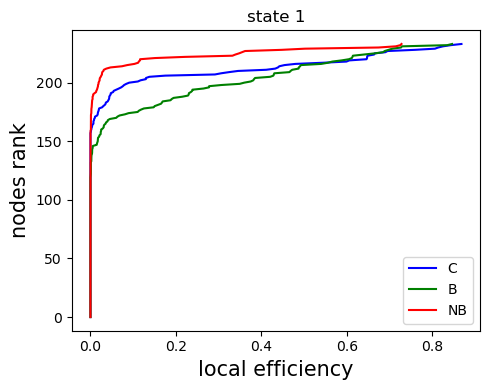

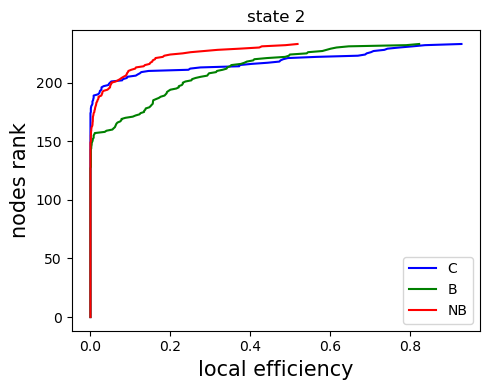

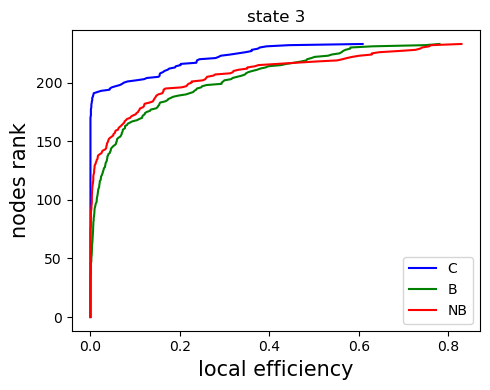

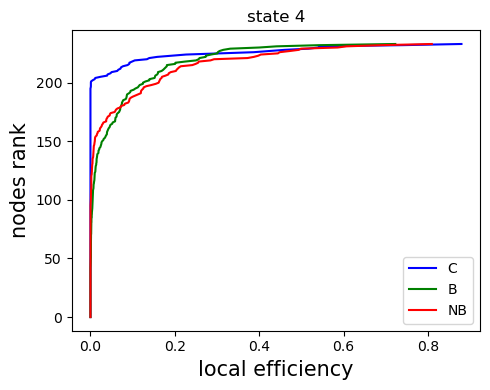

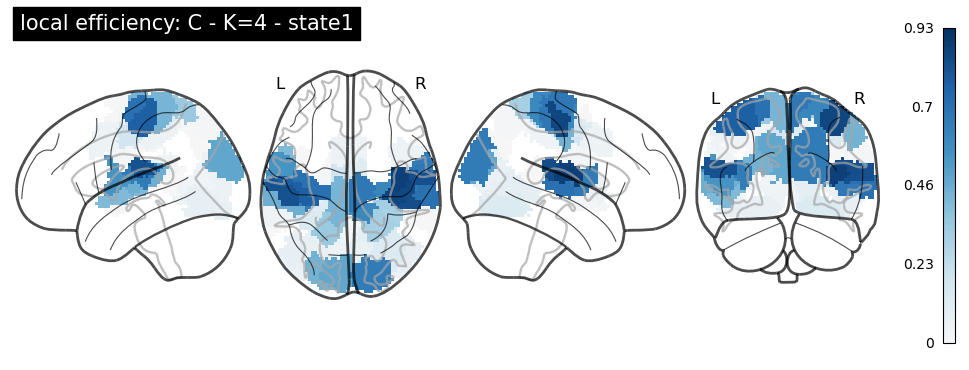

...

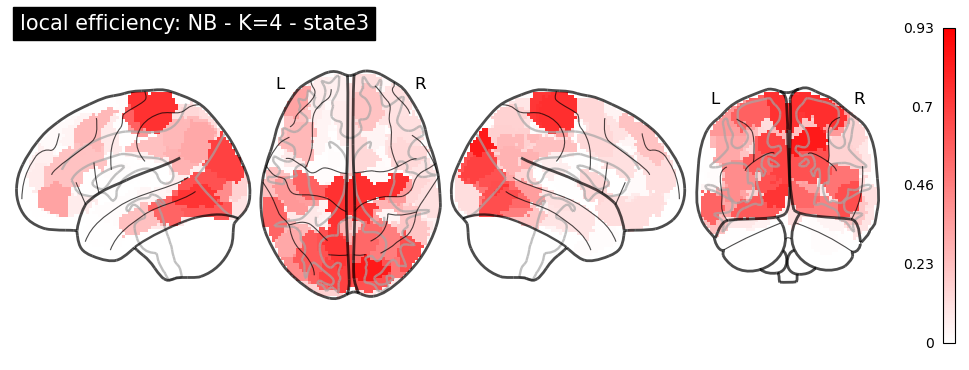

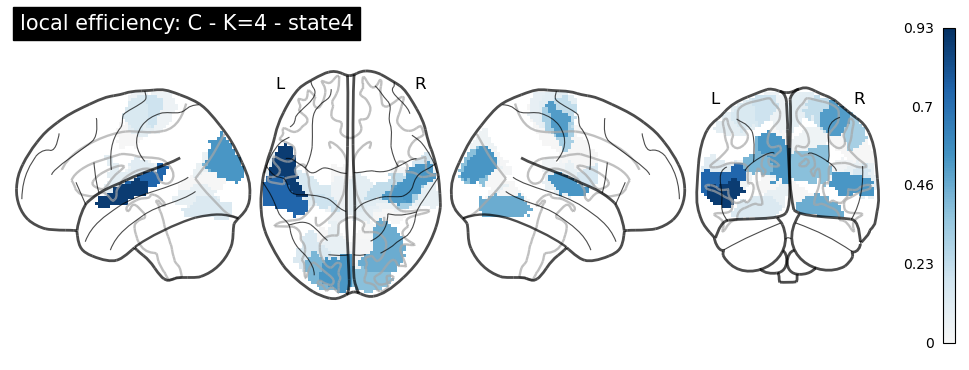

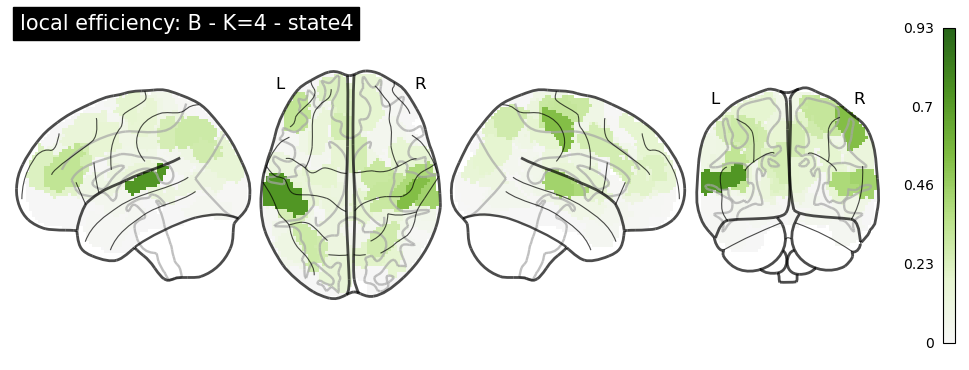

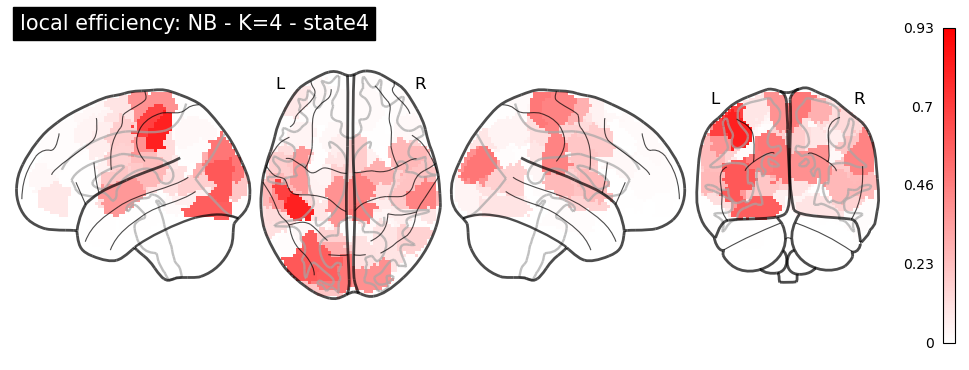

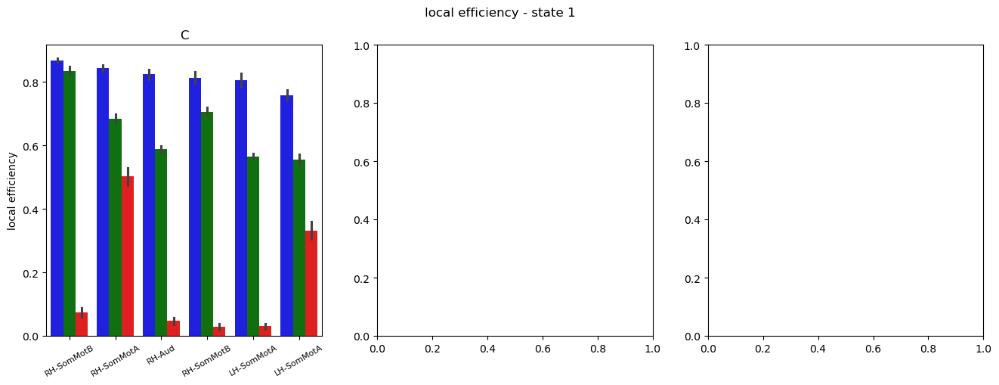

In [64]:
%%time
# PARDALOS PLOT - rank each node with respect to local efficiency

# metriche_label = ['betweenness centrality', 'local efficiency']
metriche_label = ['local efficiency']

# metrica='local_efficiency_notav'
# metrichee=['betweeness_centrality', 'local_efficiency_notav']
metrichee=['local_efficiency_notav']

# metrica='eigenvector_centrality'
thresh = 0.99
n_pick = 1000
n_samp = 50
eps = 0.1
for i,K in enumerate(range(2,10+1)): # Loop over K
    if K==4:
        k = K - 2 # MD start to cluster from K=2
        # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
        state_labels = state_labels_list[k]
        # print(state_labels.shape, state_labels.max())
        centroids = kmeans_leida[k]['C']
        print(centroids.shape)
        
        # time points belonging to each state [state x time points]
        states_index = []
        for s in np.unique(state_labels):
            states_index.append(np.where(state_labels==s))
        print(len(states_index))
        
        # Divide states indexes by group
        groups_index = []
        for g in np.unique(group_labels):
            groups_index.append(np.where(group_labels==g)[0])
            
        states_index_groups = [] # [state 1, state2, state 3]
        for s in states_index:
            groupz = {0:[], 1:[], 2:[]}
            for t in s[0]:
                groupz[group_labels[t][0]].append(t)
            states_index_groups.append(groupz)

        # find the number of point of the state with the smallest representation
        min_s  = []
        for g in range(3): # loop over groups
            min = 20000
            for s in states_index_groups: # loop over states
                # print(len(s[g]))
                if len(s[g]) < min:
                    min = len(s[g])
            min_s.append(min)
    
        states_thresh = opt_threshes[i]
        maps_metrics = []
        piero = 0
        for metrica in metrichee:
            print(metriche_label[piero])
            metrics = [] # metrics for each state- 
            for s in range(K): # Loop over states
                print('STATE ', s+1)
                thresh_2 = states_thresh[s]
                mets = [] # metrics for each group
                # I have to evaluate the metrics for the three groups
                for g_idx in range(3):
                    n_samp = int(0.75*min_s[g_idx])
                    met = []
                    met = np.empty((0,plm_tc.shape[-2]))
                    for t in range(n_pick):
                        # Pick a random s-ample of phase locking matrix
                        idxs = random.choices(states_index_groups[s][g_idx], k=n_samp)
                        mat = np.empty((0,plm_tc.shape[-2],plm_tc.shape[-1]))
                        for j in idxs:
                            np.fill_diagonal(plm_tc[j], 0) # Remove ones on the diagonal
                            m = plm_tc[j]
                            m = np.abs(m)
                            m[np.where(m<thresh)] = 0
                            mat = np.concatenate((mat, np.expand_dims(m, axis=0)))
                        meanchia = mat.mean(axis=0)
                        # Devo thresholdare pure la matrice media
                        meanchia[np.where(meanchia<thresh_2)] = 0
        
                        # MEANCHIA DEVO TRESHOLDARLA PRIMA DI CREARE IL GRAFO
                        G = nx.from_numpy_array(meanchia)
                        # Which metrics I want to look at
                        mmm = graph_metrics(metrica, G)
                        mmm = np.expand_dims(np.asarray(mmm), axis=0)
                        met = np.concatenate((met, mmm))
                    mets.append(met) # groups
                metrics.append(mets) # states
        
        
            labels = ['C', 'B', 'NB']
            colors = ['blue','green','red']
            cmaps = ['RdBu','PiYG','bwr']
    
            # PLOT PARDALOS CURVES
            for s in range(K):
                fig,ax = plt.subplots(1,1, figsize=(5, 4))
                ax.set_title('state {}'.format(s+1))
                for g in range(3):
                    m = np.mean(metrics[s][g], axis=0)
                    m = np.sort(m)
                    ax.plot(m,range(m.shape[0]), label=labels[g], color=colors[g])
                    ax.set_xlabel(metriche_label[piero], fontsize=15)
                    ax.set_ylabel('nodes rank', fontsize=15)
        
                ax.legend(loc='lower right')
                fig.tight_layout()
    
                # plt.savefig('output/MD_05122023_noclustfilt/K'+str(K)+'/Pardalos_'+metrica+'_npick'+ \
                #             str(n_pick)+'_nsamp'+str(n_samp)+'_K'+str(K)+'state'+str(s+1)+'.png',
                #             dpi=200)
    
    
            # PLOT LOCAL EFFICIENCY AND BETWEENESS OVER THE BRAIN - CERVELLINI
            for s in range(K): # Loop over states
                fig = plt.figure()
                # ax.set_title('state {}'.format(s+1))
                m__ = np.mean(metrics, axis=2)
                for g in range(3):
                    m = np.mean(metrics[s][g], axis=0) # Local Eff/Betweeness centr for each node
                    empty_brain = np.full(atlas.shape, np.nan)
                    for a_idx,m_a in enumerate(m): # Loop over the areas
                        cord = np.where(atlas==a_idx+1)
                        empty_brain[cord[0], cord[1], cord[2]] = m_a
                    nii_brain = nib.Nifti1Image(empty_brain, affine=atlas_affine)
                    plotting.plot_glass_brain(nii_brain, display_mode='lzry', cmap=cmaps[g], colorbar=True,
                                              vmin=0, vmax=m__.max(), symmetric_cbar=False, plot_abs=True,
                                              title=metriche_label[piero]+': '+labels[g]+' - K='+str(K)+' - state'+str(s+1))
                
                    fig.tight_layout()
                    plt.close(fig)
                    # plt.savefig('output/MD_05122023_noclustfilt/K'+str(K)+'/Brain_'+labels[g]+' '+metrica+'_npick'+ \
                    #             str(n_pick)+'_nsamp'+str(n_samp)+'_K'+str(K)+'state'+str(s+1)+'.png',
                    #             dpi=200)
                    # nib.save(nii_brain, 
                    #          'output/MD_05122023_noclustfilt/K'+str(K)+'/Brain_'+labels[g]+' '+metrica+'_npick'+ \
                    #             str(n_pick)+'_nsamp'+str(n_samp)+'_K'+str(K)+'state'+str(s+1)+'.nii.gz')
            
                
                
            # SEABORN BARPLOT # AREAS RANK - VERSION 3 -- DEFINITIVO
            my_col = ['blue', 'green', 'red']
            state_order = [s for s in range(1,K+1)]
            groups_order = ['C', 'B', 'NB']
            comparison = True
        
            n = 6 # How many areas I want to show
            # I want one color for macro area
            ## START COLOR STUFF ##
        
            # Divide areas for macro areas
            mas = np.unique(atlas_labels['super network'].values)
            areas = atlas_labels['area'].values
            networks = atlas_labels['network'].values
            hemi = atlas_labels['hemisphere'].values
            
            # mas_dic_count = [len(mas_dic[k]) for k in mas_dic.keys()]
        
            cmap = plt.cm.jet  # define the colormap
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # force the first color entry to be grey
            cmaplist[0] = (.5, .5, .5, 1.0)
            # create the new map
            cmap = mpl.colors.LinearSegmentedColormap.from_list(
                   'Custom cmap', cmaplist, cmap.N)
            # define the bins and normalize
            bounds = np.linspace(0, len(mas_dic)-1, len(mas_dic))
            norm = mpl.colors.BoundaryNorm(list(mas_dic.values()), cmap.N)
        
            states_mas_color = []
            mas_color = []
            for k_i,k in enumerate(mas_dic.keys()):
                i = 0
                mas_color.append(cmap(k_i/len(mas_list)))
                for _ in mas_list[k]:
                    states_mas_color.append(cmap(k_i/len(mas_list)))
                    i += 1
            ## END COLOR STUFF ##     
        
            df_metrics = []
            ranks = []
            for i in range(K): # states - ONE DATAFRAME FOR EACH STATE
                df_metrics_ = []
                ranks_ = []
                for j in range(3): # groups
                    mmm = []
                    ggg = []
                    are = []
                    rank = np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n] # area ranking based on the given metrics
                    rankpp = np.sort(np.mean(metrics[i][j],axis=0))[::-1][:n]
                    ranks_.append(rank)
                    for jj in range(3): # groups
                        for r in rank:
                            lunghez = len(metrics[i][jj][:,r])
        
                            mmm += metrics[i][jj][:,r].tolist() # metrics values
                            ggg += [groups_order[jj]]*lunghez # group label
                            are += [r]*lunghez # area
                    # 'state' is node
                    df_metrics_.append(pd.DataFrame(data = {metriche_label[piero]: mmm, 'groups': ggg, 'state':are}))
                ranks.append(ranks_)
                df_metrics.append(df_metrics_)
        
        
            my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
            #     annot_test =  'Brunner-Munze'
            annot_test = 't-test_ind'
        
            maps_states = []
            for i in range(K): # states - ONE DATAFRAME FOR EACH STATE
                fig,axs = plt.subplots(1,3, figsize=(16,5))
                my_sup = plt.suptitle(metriche_label[piero]+' - state '+ str(i+1))
                
                maps_groups = []
                for j in range(3): # groups
                    axs[j].set_title(groups_order[j])
                    pairs = [[(s,'C'),(s,'B')] for s in ranks[i][j]] + \
                             [[(s,'C'),(s,'NB')] for s in ranks[i][j]] + \
                             [[(s,'B'),(s,'NB')] for s in ranks[i][j]]
        
                    hue_plot_params = {
                        'data': df_metrics[i][j],
                        'x': 'state',
                        'y': metriche_label[piero],
                        "order": ranks[i][j],
                        "hue": 'groups',
            #             "hue_order": groups_order,
                        "palette": my_pal,
                    }
        
                    with sns.plotting_context("notebook", font_scale = 1.2):
                        # Create new plot
                    #     ax = get_log_ax()
        
                        # Plot with seaborn
                        sns.barplot(ax=axs[j],
                                    **hue_plot_params)
        
                        # Label and show
                        axs[j].legend_.remove()
                        plt.legend([], [], frameon=False)
                        axs[j].set_xticklabels(hemi[ranks[i][j]]+'-'+networks[ranks[i][j]],rotation=30, fontsize=8)
                        axs[j].set_xlabel('')
        
                        
                        pvalues = annotate_D(pairs, metriche_label[piero], df_metrics[i][j])
                        # Add annotations
                        annotator = Annotator(axs[j], pairs, **hue_plot_params)
                        annotator.set_pvalues(pvalues)
                        annotator.annotate()
                    
            
                plt.tight_layout()    
                # plt.close(fig)
                # plt.savefig('output/MD_05122023_noclustfilt/K'+str(K)+'/NODERANK_'+metrica+'Rank_state'+str(i+1)+'_npick'+ \
                #             str(n_pick)+'_nsamp'+str(n_samp)+'_K'+str(K)+'state'+str(s+1)+'.png',
                #             dpi=200, bbox_extra_artists=[my_sup])
        
            maps_metrics.append(maps_states)
        
            
            piero +=1 

In [ ]:
nib.save()

In [ ]:
# # BOXPLOT # Areas rank - version 1

# comparison = True

# today = date.today()
# DATE = today.strftime("%d%m%Y")
# # checking if the directory exists or not
# if not os.path.exists('output/GraphAnal/'+DATE): 
#     # if the demo_folder directory is not present 
#     # then create it.
#     os.makedirs('output/GraphAnal/'+DATE)

# n = 6
# # I want one color for macro area
# ## START COLOR STUFF ##

# # Divide areas for macro areas
# mas = np.unique(atlas_labels['network'].values)

# mas_dic_count = [len(mas_dic[k]) for k in mas_dic.keys()]

# cmap = plt.cm.jet  # define the colormap
# cmaplist = [cmap(i) for i in range(cmap.N)]
# # force the first color entry to be grey
# cmaplist[0] = (.5, .5, .5, 1.0)
# # create the new map
# cmap = mpl.colors.LinearSegmentedColormap.from_list(
#        'Custom cmap', cmaplist, cmap.N)
# # define the bins and normalize
# bounds = np.linspace(0, len(mas_list)-1, len(mas_list))
# norm = mpl.colors.BoundaryNorm(mas_dic_count, cmap.N)

# states_mas_color = []
# mas_color = []
# for k in mas_dic.keys():
#     i = 0
#     mas_color.append(cmap(k/len(mas_list)))
#     for _ in mas_dic[k]:
#         states_mas_color.append(cmap(k/len(mas_list)))
#         i += 1
# ## END COLOR STUFF ##      
        
# tit = ['C','B','NB']
# # c = 'red'
# for i in range(K): # Loop over states
#     fig,axs = plt.subplots(1,3, figsize=(10,6))
#     fig.tight_layout(pad=4.0)
#     for j in range(3): # Loop over groups
        
# #         print(np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:10])
# #         axs[(i*3)+j].boxplot(np.transpose(metrics[i][j][:,np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]]),
# #                     vert=False, showfliers=False, positions=[k for k in range(n)])
#         fig.suptitle(metrica + ' - state {}'.format(i+1))
#         lll = atlas_labels.iloc[np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]]['n_area'] # areas name
#         ll = []
#         c = []
#         for l in lll:
#             m_a = atlas_labels[atlas_labels['n_area']==l]['network'].values[0]
#             ll.append(m_a)
#             c.append(mas_color[mas.tolist().index(m_a)])
#         bp = axs[j].boxplot(metrics[i][j][:,np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]],
#                           vert=False, showfliers=False, positions=[k for k in range(n)][::-1],
#                           labels=lll, patch_artist=True, widths = 0.5)
#         if comparison:
#             bp_ = []
#             other_j = []
#             eh = 1
#             for pino in [0,1,2]: # Check the same area for the other groups
#                 if pino!=j:
#                     bp_.append(axs[j].boxplot(metrics[i][pino][:,np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]],
#                                       vert=False, showfliers=False, positions=[k+eh/5 for k in range(n)][::-1],
#                                       labels=['']*n, patch_artist=True, widths = 0.3))
#                     eh += 1
#                     other_j.append(pino)
                
#         if comparison:
#             for f,patch in enumerate(bp['boxes']):
#                     patch.set(facecolor=my_pal[tit[j]], alpha=0.8)
#             for pluto,bbb in enumerate(bp_):
#                 for f,patch in enumerate(bbb['boxes']):
#                         patch.set(facecolor=my_pal[tit[other_j[pluto]]], alpha=0.5)
#         else:
#             for f,patch in enumerate(bp['boxes']):
#                     patch.set(facecolor=c[f]) 

            
#         axs[j].set_title(tit[j])
#         uu = np.unique(ll)
#         arguu = [ll.index(u) for u in uu]
#         if not comparison:
#             axs[j].legend([bp['boxes'][u] for u in arguu], uu, loc='lower center',
#                           bbox_to_anchor=(0.22, -0.09-(len(uu)-2)*0.055, 0.5, 0.2), fontsize=7)
#         axs[j].set_xticks([])
#     plt.tight_layout()
# #     if comparison:
# #         plt.savefig('output/GraphAnal/'+DATE+'/'+metrica+'Rank_state'+str(i+1)+ \
# #                     'Comparison_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
# #                     dpi=200)
# #     else:
# #         plt.savefig('output/GraphAnal/'+DATE+'/'+metrica+'Rank_state'+str(i+1)+ \
# #                     '_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
# #                     dpi=200)

In [ ]:
# # BARPLOT # Areas rank - Version 2
# my_col = ['blue', 'green', 'red']
# comparison = True

# today = date.today()
# DATE = today.strftime("%d%m%Y")
# # checking if the directory exists or not
# if not os.path.exists('output/GraphAnal/'+DATE): 
#     # if the demo_folder directory is not present 
#     # then create it.
#     os.makedirs('output/GraphAnal/'+DATE)

# n = 6
# # I want one color for macro area
# ## START COLOR STUFF ##

# # Divide areas for macro areas
# mas = np.unique(atlas_labels['network'].values)

# mas_dic_count = [len(mas_dic[k]) for k in mas_dic.keys()]

# cmap = plt.cm.jet  # define the colormap
# cmaplist = [cmap(i) for i in range(cmap.N)]
# # force the first color entry to be grey
# cmaplist[0] = (.5, .5, .5, 1.0)
# # create the new map
# cmap = mpl.colors.LinearSegmentedColormap.from_list(
#        'Custom cmap', cmaplist, cmap.N)
# # define the bins and normalize
# bounds = np.linspace(0, len(mas_list)-1, len(mas_list))
# norm = mpl.colors.BoundaryNorm(mas_dic_count, cmap.N)

# states_mas_color = []
# mas_color = []
# for k in mas_dic.keys():
#     i = 0
#     mas_color.append(cmap(k/len(mas_list)))
#     for _ in mas_dic[k]:
#         states_mas_color.append(cmap(k/len(mas_list)))
#         i += 1
# ## END COLOR STUFF ##      
        
# tit = ['C','B','NB']
# # c = 'red'
# for i in range(K): # Loop over states
#     fig,axs = plt.subplots(1,3, figsize=(10,4))
#     fig.tight_layout(pad=4.0)
#     for j in range(3): # Loop over groups
        
#         fig.suptitle(metrica + ' - state {}'.format(i+1))
#         lll = atlas_labels.iloc[np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]]['n_area'].values # areas name
#         ll = []
#         c = []
#         for l in lll:
#             m_a = atlas_labels[atlas_labels['n_area']==l]['network'].values[0]
#             ll.append(m_a)
#             c.append(mas_color[mas.tolist().index(m_a)])
            
#         bp_ = []
#         other_j = []
#         eh = 1
#         for pino in [0,1,2]: # Check the same area for the other groups
#             if pino==j:
#                 alpha=1
#             else:
#                 alpha=0.5
                
#             bp_.append(axs[j].barh(width=np.mean(metrics[i][pino][:,np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]], axis=0),
#                                    xerr=np.std(metrics[i][pino][:,np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]], axis=0),
#                                    y=[k*2+pino*0.4 for k in range(n)][::-1],
#                                    height=0.4,
#                                    alpha=alpha,
#                                    color=my_col[pino],
#                                    tick_label=lll.tolist()))
# #             if pino!=1:
# #                 axs[j].set_yticklabels([])
# #             else:
# #                 axs[j].set_yticklabels(lll.tolist())

#             axs[j].set_yticklabels(lll.tolist(),rotation=30, fontsize=8)
                
# #         for f,patch in enumerate(bp['boxes']):
# #                 patch.set(facecolor=my_pal[tit[j]], alpha=0.8)
# #         for pluto,bbb in enumerate(bp_):
# #             for f,patch in enumerate(bbb['boxes']):
# #                     patch.set(facecolor=my_pal[tit[other_j[pluto]]], alpha=0.5)

            
#         axs[j].set_title(tit[j])
#         uu = np.unique(ll)
#         arguu = [ll.index(u) for u in uu]
# #         axs[j].legend([bp['boxes'][u] for u in arguu], uu, loc='lower center',
# #                       bbox_to_anchor=(0.22, -0.09-(len(uu)-2)*0.055, 0.5, 0.2), fontsize=7)
#     plt.tight_layout()

# #     plt.savefig('output/GraphAnal/'+DATE+'/'+metrica+'Rank_state'+str(i+1)+ \
# #                 'Comparison_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
# #                 dpi=200)

# #         plt.savefig('output/GraphAnal/'+DATE+'/'+metrica+'Rank_state'+str(i+1)+ \
# #                     '_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
# #                     dpi=200)

In [ ]:
# # SEABORN BARPLOT # AREAS RANK - VERSION 3 -- DEFINITIVO
# my_col = ['blue', 'green', 'red']
# state_order = [s for s in range(1,K+1)]
# groups_order = ['C', 'B', 'NB']
# comparison = True

# n = 6
# # I want one color for macro area
# ## START COLOR STUFF ##

# # Divide areas for macro areas
# mas = np.unique(atlas_labels['network'].values)
# araes = atlas_labels['n_area'].values

# mas_dic_count = [len(mas_dic[k]) for k in mas_dic.keys()]

# cmap = plt.cm.jet  # define the colormap
# cmaplist = [cmap(i) for i in range(cmap.N)]
# # force the first color entry to be grey
# cmaplist[0] = (.5, .5, .5, 1.0)
# # create the new map
# cmap = mpl.colors.LinearSegmentedColormap.from_list(
#        'Custom cmap', cmaplist, cmap.N)
# # define the bins and normalize
# bounds = np.linspace(0, len(mas_list)-1, len(mas_list))
# norm = mpl.colors.BoundaryNorm(mas_dic_count, cmap.N)

# states_mas_color = []
# mas_color = []
# for k in mas_dic.keys():
#     i = 0
#     mas_color.append(cmap(k/len(mas_list)))
#     for _ in mas_dic[k]:
#         states_mas_color.append(cmap(k/len(mas_list)))
#         i += 1
# ## END COLOR STUFF ##     

# df_metrics = []
# ranks = []
# for i in range(K): # states - ONE DATAFRAME FOR EACH STATE
#     df_metrics_ = []
#     ranks_ = []
#     for j in range(3): # groups
#         mmm = []
#         ggg = []
#         are = []
#         rank = np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n] # area ranking based on the given metrics
#         rankpp = np.sort(np.mean(metrics[i][j],axis=0))[::-1][:n]
#         ranks_.append(rank)
#         for jj in range(3): # groups
#             for r in rank:
#                 lunghez = len(metrics[i][jj][:,r])

#                 mmm += metrics[i][jj][:,r].tolist() # metrics values
#                 ggg += [groups_order[jj]]*lunghez # group label
#                 are += [r]*lunghez # area
#         df_metrics_.append(pd.DataFrame(data = {metrica: mmm, 'groups': ggg, 'node':are}))
#     ranks.append(ranks_)
#     df_metrics.append(df_metrics_)


# my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
# #     annot_test =  'Brunner-Munze'
# annot_test = 't-test_ind'

# for i in range(K): # states - ONE DATAFRAME FOR EACH STATE
#     fig,axs = plt.subplots(1,3, figsize=(16,5))
#     my_sup = plt.suptitle(metrica+' - state '+ str(i+1))
#     for j in range(3): # groups
#         axs[j].set_title(groups_order[j])
#         pairs = [[(s,'C'),(s,'B')] for s in ranks[i][j]] + \
#                  [[(s,'C'),(s,'NB')] for s in ranks[i][j]] + \
#                  [[(s,'B'),(s,'NB')] for s in ranks[i][j]]

#         hue_plot_params = {
#             'data': df_metrics[i][j],
#             'x': 'node',
#             'y': metrica,
#             "order": ranks[i][j],
#             "hue": 'groups',
# #             "hue_order": groups_order,
#             "palette": my_pal,
#         }

#         with sns.plotting_context("notebook", font_scale = 1.2):
#             # Create new plot
#         #     ax = get_log_ax()

#             # Plot with seaborn
#             sns.barplot(ax=axs[j],
#                         **hue_plot_params)
            
#             # Label and show
#             axs[j].legend_.remove()
#             plt.legend([], [], frameon=False)
#             axs[j].set_xticklabels(areas[ranks[i][j]],rotation=30, fontsize=8)
#             axs[j].set_xlabel('')

#             # Add annotations
#             annotator = Annotator(axs[j], pairs, **hue_plot_params)
#             annamobbene = annotator.configure(test=annot_test).apply_and_annotate()
            
#     plt.tight_layout()    
#     plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/NODERANK_'+metrica+'Rank_state'+str(i+1)+ \
#                 'Comparison_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
#                 dpi=200, ,bbox_extra_artists=[my_sup])






# STATE TRANSITIONS - Evaluate transition probability between states

In [60]:
import seaborn as sns

In [26]:
sns.__version__

'0.13.1'

(7327,) (3448,) (3448,)
(7327,) (3448,) (3448,)
(7327,) (3448,) (3448,)
(7327,) (3448,) (3448,)
(7327,) (3448,) (3448,)


/tmp/ipykernel_2371349/3004646677.py:58: RuntimeWarning: invalid value encountered in divide
  matrix[r] = matrix[r]/row.sum()


(7327,) (3448,) (3448,)


/tmp/ipykernel_2371349/3004646677.py:58: RuntimeWarning: invalid value encountered in divide
  matrix[r] = matrix[r]/row.sum()


(7327,) (3448,) (3448,)


/tmp/ipykernel_2371349/3004646677.py:58: RuntimeWarning: invalid value encountered in divide
  matrix[r] = matrix[r]/row.sum()


(7327,) (3448,) (3448,)


/tmp/ipykernel_2371349/3004646677.py:58: RuntimeWarning: invalid value encountered in divide
  matrix[r] = matrix[r]/row.sum()


(7327,) (3448,) (3448,)


/tmp/ipykernel_2371349/3004646677.py:58: RuntimeWarning: invalid value encountered in divide
  matrix[r] = matrix[r]/row.sum()


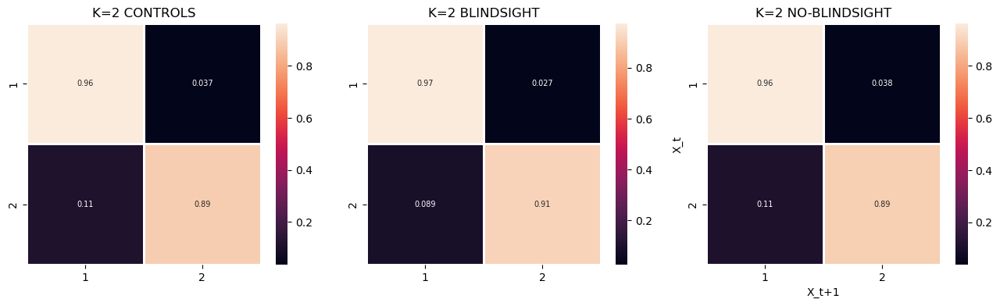

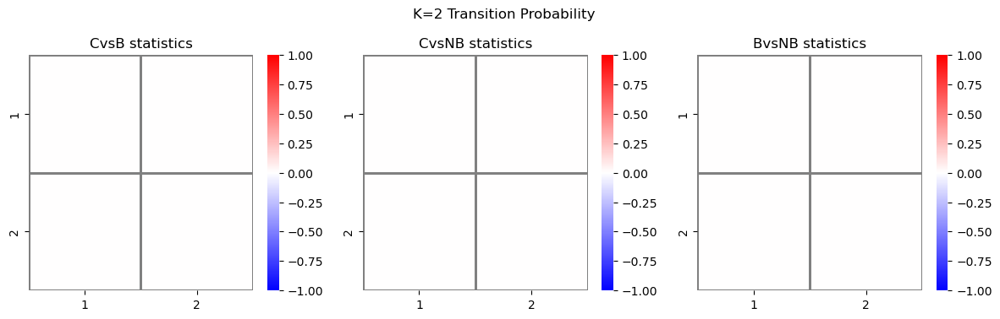

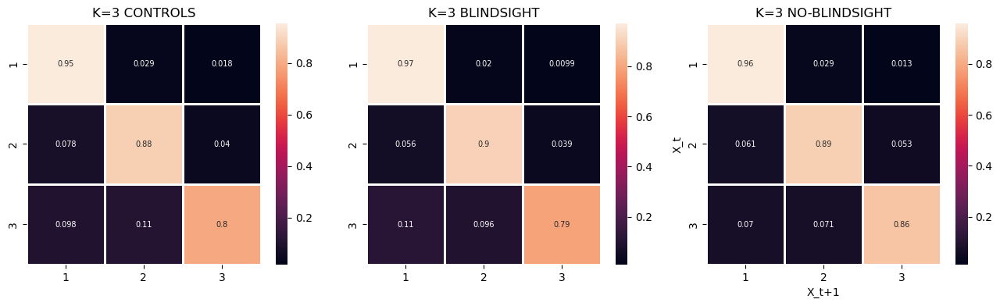

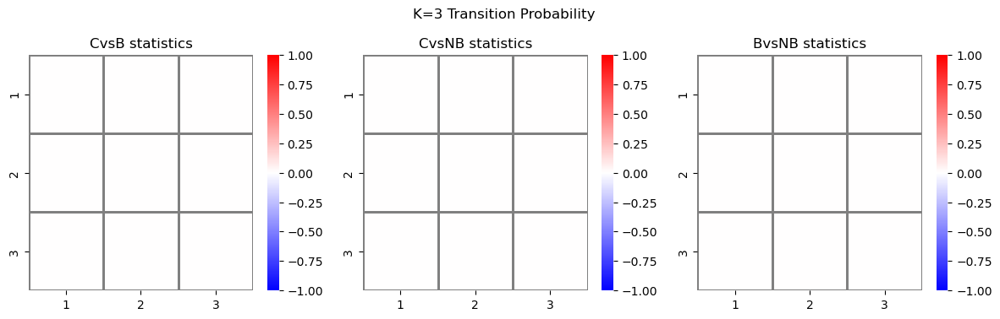

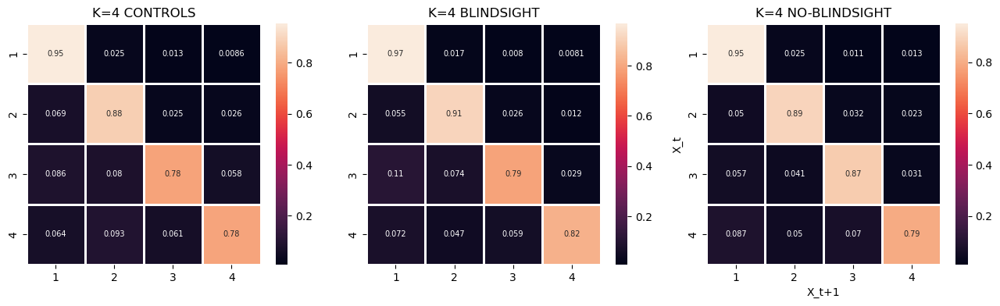

...

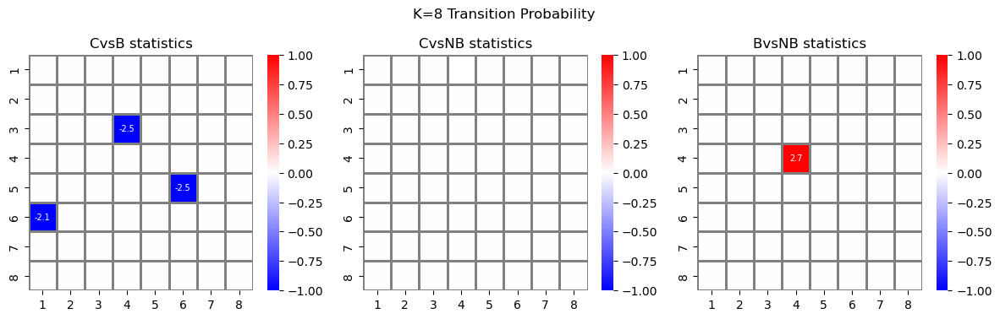

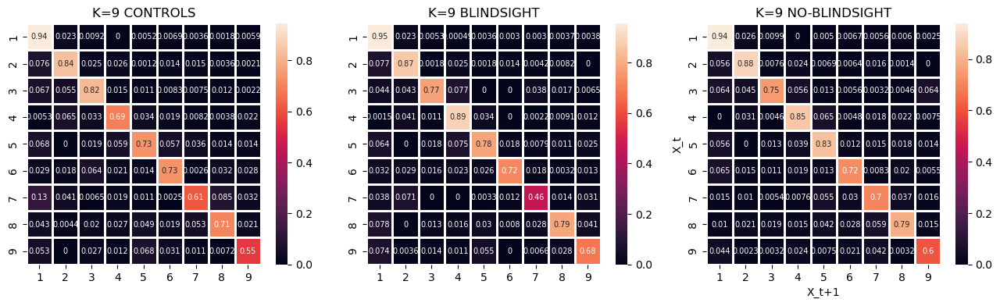

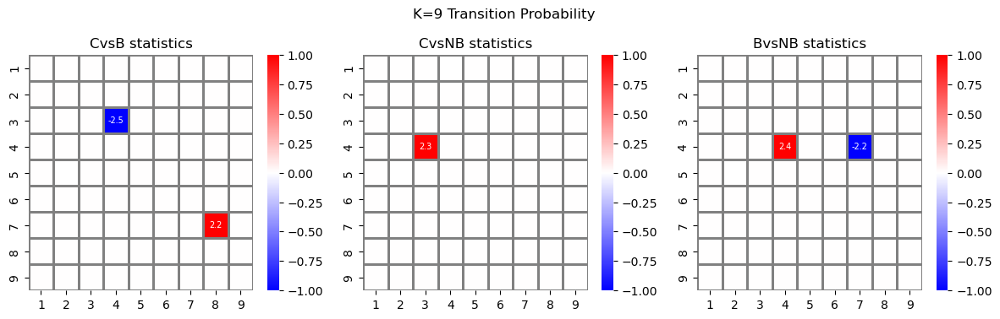

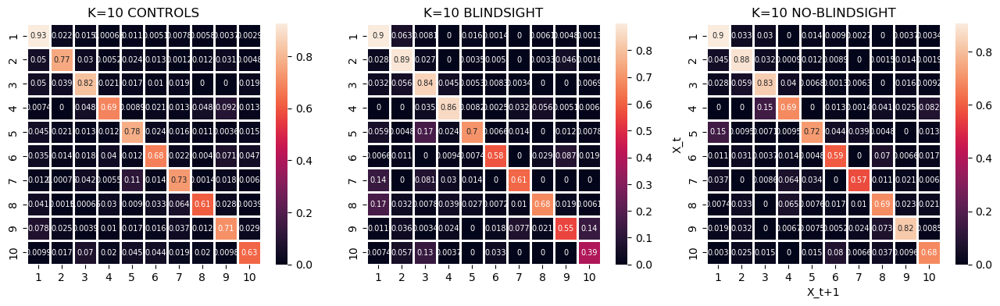

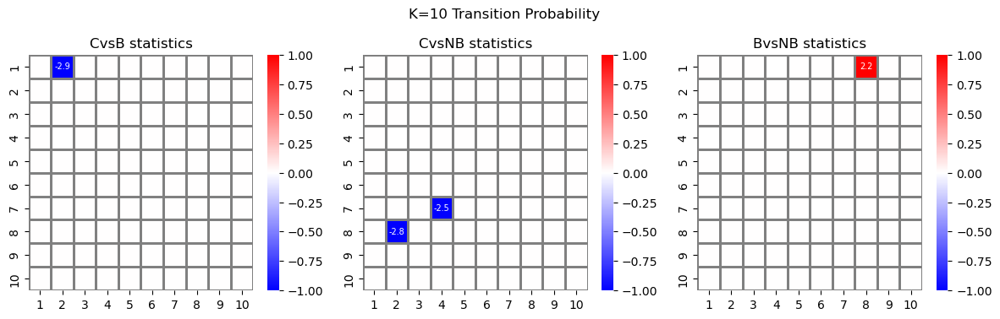

In [30]:
C_states = np.empty((0,))
B_states = np.empty((0,))
NB_states = np.empty((0,))

prob_trans_list_allK = []
for i,K in enumerate(range(2,10+1)): # Loop over K
    k = K - 2 # MD start to cluster from K=2
    state_labels = state_labels_list[k]

    # Divide states indexes by group
    groups_index = []
    for g in np.unique(group_labels):
        groups_index.append(np.where(group_labels==g)[0])

    # Define some stuff
    C_states = np.empty((0,))
    B_states = np.empty((0,))
    NB_states = np.empty((0,))
    for s,lab in zip(state_labels, group_labels):
        s = np.expand_dims(s, axis=0)
        if   lab==0: # C
            C_states = np.concatenate((C_states, s))
        elif lab==1: # B
            B_states = np.concatenate((B_states, s))
        else:        # NB
            NB_states = np.concatenate((NB_states, s))
            
    print(C_states.shape, B_states.shape, NB_states.shape)
    
    # COUNT THE TRANSITION BETWEEN EACH COUPLE OF STATES
    # subject-by-subject
    C = int(np.sum(group_labels==0)/time_points)
    B = int(np.sum(group_labels==1)/time_points)
    NB = int(np.sum(group_labels==2)/time_points)
    groups = [C_states, B_states, NB_states]
    groups_num = [C, B, NB]
    
    tot = []
    prob_trans_list = [] # I save all the prob transition matrices of each subject of each group in a list
    for g, g_num in zip(groups, groups_num):
        matrices = np.empty((0, K, K))
        # Loop over subjects
        to = 0
        for s in range(g_num):
            matrix = np.zeros((K, K))
            # count the number of transition within each possible couple of states
            prev = int(g[s*time_points]) - 1
            for t, tp in enumerate(g[(s*time_points)+1:(s+1)*time_points]):
                tp = int(tp) - 1 
    #             print(prev, tp)
                matrix[prev, tp] += 1
                if prev!=tp:
                    to += 1 # total number of transitions between different states
                prev = tp
            tot.append(to)
            # matrix normalization to obtain probabilities
            for r,row in enumerate(matrix):
                matrix[r] = matrix[r]/row.sum()
    #             matrix[r] = matrix[r]
            # Check nan values
            if np.isnan(matrix).any():
                iid = np.where(np.isnan(matrix))
                matrix[iid] = 0
            matrix = np.expand_dims(matrix, axis=0)
            matrices = np.concatenate((matrices, matrix))
    #         print(matrices.shape)
        prob_trans_list.append(matrices)
        
        
        
    state_names = [i+1 for i in range(K)]
    groups_names = ['CONTROLS', 'BLINDSIGHT', 'NO-BLINDSIGHT']
    fig,axs = plt.subplots(1,3, figsize=(13,4))
    for i,ax in enumerate(axs.flat):
        ax.set_title('K='+str(K)+' '+groups_names[i])
    #     sns.heatmap(np.log(prob_trans_list[i].mean(axis=0)), linewidth=0.8, xticklabels=state_names, yticklabels=state_names)
        sns.heatmap(prob_trans_list[i].mean(axis=0), linewidth=0.8,
                    xticklabels=state_names, yticklabels=state_names, annot=True, annot_kws={'fontsize':7}, ax=ax)
        plt.xlabel('X_t+1')
        plt.ylabel('X_t')

    plt.tight_layout(pad=1.0)
            
    plt.savefig('output/MD_05122023_noclustfilt/K'+str(K)+'/TransProb_K'+str(K)+'.png',
                dpi=200)
        
    # # WITH NO DIAG
    # for i in range(3):
    #     mat = prob_trans_list[i].mean(axis=0)
    #     for idx in range(K):
    #         mat[idx,idx] = np.nan
    #     fig = plt.figure()
    #     plt.title(groups_names[i])
    # #     sns.heatmap(np.log(prob_trans_list[i].mean(axis=0)), linewidth=0.8, xticklabels=state_names, yticklabels=state_names)
    #     sns.heatmap(mat, linewidth=0.8,
    #                 xticklabels=state_names, yticklabels=state_names,
    #                 annot=True)
    #     plt.xlabel('X_t+1')
    #     plt.ylabel('X_t')
        
    #     # plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/'+'ProbTransition_NoDiag_'+groups_names[i]+ \
    #     #             '_'+DATE+'.png',
    #     #             dpi=200)

    # # WITH ONLY DIAG
    # for i in range(3):
    #     mat = prob_trans_list[i].mean(axis=0)
    #     for j in range(K):
    #         for z in range(K):
    #             if j!=z:
    #                 mat[j,z] = np.nan
    #     fig = plt.figure()
    #     plt.title(groups_names[i])
    # #     sns.heatmap(np.log(prob_trans_list[i].mean(axis=0)), linewidth=0.8, xticklabels=state_names, yticklabels=state_names)
    #     sns.heatmap(mat, linewidth=0.8,
    #                 xticklabels=state_names, yticklabels=state_names,
    #                 annot=True)
    #     plt.xlabel('X_t+1')
    #     plt.ylabel('X_t')

    # Statistica tra gruppi
    
    pairs = [(0,1),(0,2),(1,2)]
    pairs_tit = ['CvsB', 'CvsNB', 'BvsNB']
    nnn = ['C','B','NB']
    annot_test = 't-test_ind'
    
    
    matrice_ps = []
    fig, axs = plt.subplots(1,3, figsize=(12,3.8))
    for p_i, p in enumerate(pairs):
        matrice_s = np.empty((K,K))
        matrice_p = np.empty((K,K))
        for i in range(K):
            for j in range(K):
                matrice_s[i,j] = ttest_ind(prob_trans_list[p[0]][:,i,j], prob_trans_list[p[1]][:,i,j])[0]
                matrice_p[i,j] = ttest_ind(prob_trans_list[p[0]][:,i,j], prob_trans_list[p[1]][:,i,j])[1]
        matrice_ps.append(matrice_p)
        
        my_sup = plt.suptitle('K='+str(K)+' Transition Probability')
        # display only significative values
        for i in range(K):
            for j in range(K):
                if matrice_p[i][j]>=0.05:
                    matrice_s[i][j]=0
                    
        sns.heatmap(matrice_s, linewidth=0.8, xticklabels=state_names, yticklabels=state_names, cmap='bwr', annot=True,
                    ax=axs[p_i], vmin=-1, vmax=1, annot_kws={'fontsize':7}, linecolor='grey')
        for t in axs[p_i].texts:
            if float(t.get_text())!=0:
                t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
            else:
                t.set_text("") # if not it sets an empty text
        axs[p_i].set_title(pairs_tit[p_i]+' statistics')
        
    fig.tight_layout(pad=1.0)
    plt.savefig('output/MD_05122023_noclustfilt/K'+str(K)+'/TransProb_statistics_K'+str(K)+'.png',
                dpi=200, bbox_extra_artists=[my_sup])

    prob_trans_list_allK.append(prob_trans_list)

In [118]:
import pingouin as pg
for i in range(3):
    reject, pvals_corr = pg.multicomp(np.concatenate((matrice_ps[i][3,:], matrice_ps[i][:,3]))[[i for i in range(12) if i!=3]],
                                                     method='fdr_bh')
#     print(reject)
    print(pvals_corr)

[0.61647798 0.56339267 0.87818298 0.42794526 0.30450271 0.87818298
 0.42794526 0.17819142 0.30450271 0.17819142 0.57661644]
[0.61647798 0.61647798 0.61647798 0.61647798 0.61647798 0.61647798
 0.89280071 0.61647798 0.61647798 0.61647798 0.96991047]
[       nan 0.86690455 0.55713657 0.86690455 0.59827093 0.55713657
 0.55713657 0.55713657 0.55713657 0.55713657 0.6640227 ]


# Correlation with behavioral data

In [41]:
# Multiple dim partial correlation from scratch. 
# Ref: https://en.wikipedia.org/wiki/Partial_correlation ; https://datatab.net/tutorial/partial-correlation
from scipy.stats import zscore
from scipy.stats import norm # to compute p-value
from sklearn.utils import shuffle

def compute_res(var1, var2):
    var1 = sm.add_constant(var1)  # adding a constant
    model = sm.OLS(var1, var2).fit()
    # print(model.resid[:,1])
    return model.resid[:,1]

def one_dim_par_cor(X, Y, Z):
    e_X = compute_res(X, Z)
    e_Y = compute_res(Y, Z)
    return pearsonr(e_X, e_Y)[0]

def null_model_distrib(X, Y, Z1, Z2, n_rep):
    # just shuffle everything and compute a distribution of statistics
    r_xy_Z_dist = []
    for _ in range(n_rep):
        X_r = shuffle(np.copy(X))
        Y_r = shuffle(np.copy(Y))
        Z1_r = shuffle(np.copy(Z1))
        Z2_r = shuffle(np.copy(Z2))

        r_xy_z2 = one_dim_par_cor(X_r, Y_r, Z2_r)
        r_xz1_z2 = one_dim_par_cor(X_r, Z1_r, Z2_r)
        r_z1y_z2 = one_dim_par_cor(Z1_r, Y_r, Z2_r)

        r = (r_xy_z2 - r_xz1_z2*r_z1y_z2)/(np.sqrt(1-r_xz1_z2**2)*np.sqrt(1-r_z1y_z2**2))    
        r_xy_Z_dist.append( r )
    return r_xy_Z_dist
    

def two_dim_par_corr(X, Y, Z1, Z2):
    # print(X, Y, Z1, Z2)
    r_xy_z2 = one_dim_par_cor(X,Y,Z2)
    r_xz1_z2 = one_dim_par_cor(X,Z1,Z2)
    r_z1y_z2 = one_dim_par_cor(Z1,Y,Z2)

    r_xy_Z = (r_xy_z2 - r_xz1_z2*r_z1y_z2)/(np.sqrt(1-r_xz1_z2**2)*np.sqrt(1-r_z1y_z2**2))

    return r_xy_Z    

def two_dim_par_corr_fullstat(X, Y, Z1, Z2, n_rep):
    dist = null_model_distrib(X, Y, Z1, Z2, n_rep)
    # print(dist)
    stat = two_dim_par_corr(X, Y, Z1, Z2)
    dist = dist + [stat]
    # print(dist)
    # print(zscore(dist))
    zs_stat = zscore(dist)[-1]
    p_val = norm.sf(abs(zs_stat))*2
    

    return zs_stat, p_val

# stats = []
# p_vals = []
# for _ in range(10):
#     res = two_dim_par_corr_fullstat(my_df['behav'].values, my_df['prob'].values, my_df['age'].values, my_df['tstroke'].values, 5000)
#     stats.append(res[0])
#     p_vals.append(res[1])

(16, 2, 2)
[[ 0.33815235 -2.7023363 ]
 [ 0.09034655  0.44090096]]
[[0.73524838 0.00688541]
 [0.92801183 0.6592847 ]]
(16, 3, 3)
[[ 0.31813303 -2.1486804  -0.18945786]
 [ 0.06067741  0.44314926  0.38486462]
 [ 2.02265944 -0.19319168 -0.40786048]]
[[0.75038403 0.03165974 0.84973398]
 [0.95161612 0.65765778 0.70033772]
 [0.04310827 0.84680886 0.68337611]]
(16, 4, 4)
[[ 0.32748079 -1.7729963  -0.36357852 -0.83832598]
 [ 0.66864574  0.37566248  0.32805354 -0.4658593 ]
 [ 2.17731849  0.16250648 -0.51280051  0.11641072]
 [ 0.1047477  -0.11795165 -0.30824772  0.41664285]]
[[0.74330427 0.07622932 0.71617277 0.40184765]
 [0.50372149 0.70716783 0.74287118 0.64131622]
 [0.02945681 0.87090702 0.60809087 0.90732704]
 [0.91657601 0.90610596 0.75789385 0.67693967]]
(16, 5, 5)
[[ 0.33087985 -1.91711232 -0.48574428 -0.60649701 -0.7118223 ]
 [ 0.69714232  0.39242543  1.07417415  0.55081938  0.23847157]
 [-0.06777225  0.71534476  0.92792184  0.42348717 -2.62875318]
 [ 2.09748493 -0.22431194  1.28336336 -0

/home/alessio/miniconda3/envs/bs_laido_new/lib/python3.12/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


[[ 0.42777486 -3.3660046  -0.97050738  1.21288034 -0.4611294  -1.1825725 ]
 [ 0.7473711   0.46611546  0.12945943 -0.04858239 -0.48113353  0.15530706]
 [ 2.07359531  0.10101047 -0.68353492  0.10585914  1.02180015 -0.94196971]
 [        nan -0.43732029  0.16176175  0.53177728  1.08915426  0.30778798]
 [ 0.22011927 -0.21227459 -0.03465806  1.32416079  0.67950372 -2.12002514]
 [ 1.15707382 -1.78412699 -0.59580684 -1.21194323  0.86688869  0.65063455]]
[[6.68815038e-01 7.62654353e-04 3.31793647e-01 2.25175572e-01
  6.44705768e-01 2.36978617e-01]
 [4.54839585e-01 6.41132857e-01 8.96994125e-01 9.61252104e-01
  6.30421602e-01 8.76579253e-01]
 [3.81169112e-02 9.19542151e-01 4.94268891e-01 9.15694112e-01
  3.06875498e-01 3.46208147e-01]
 [           nan 6.61879083e-01 8.71493476e-01 5.94880264e-01
  2.76085865e-01 7.58243672e-01]
 [8.25778266e-01 8.31892819e-01 9.72352402e-01 1.85449650e-01
  4.96818752e-01 3.40039249e-02]
 [2.47242203e-01 7.44030322e-02 5.51304272e-01 2.25534112e-01
  3.86003001

/home/alessio/miniconda3/envs/bs_laido_new/lib/python3.12/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


[[ 0.44187894 -2.82966153  1.21727857 -0.07673199 -0.31918291 -1.25842771
  -0.59529386]
 [ 0.50037667  0.68312166  0.12271956 -1.14801152  0.00365308  0.13411742
   0.01010538]
 [        nan  0.0978754   0.74646997  0.2751504  -0.00618129  0.20310289
  -0.07485873]
 [ 0.20062813 -0.05418533  1.42428677  1.10441167  0.18406386 -0.00700088
  -3.22655419]
 [ 1.49714575  0.37619183 -0.51129193  0.43381967 -0.406547   -0.17020367
   0.05567077]
 [ 1.20994419 -0.20576524 -0.37653096 -0.07026829  0.27501068  0.62166341
  -1.40431974]
 [ 1.21148784 -1.76132928 -0.13326564  0.33756048 -2.79846328 -0.89959958
  -0.65364318]]
[[0.65857681 0.00465973 0.22349825 0.93883675 0.74958782 0.20823712
  0.55164706]
 [0.61680988 0.49452997 0.90232917 0.25096381 0.99708527 0.89330973
  0.99193721]
 [       nan 0.92203123 0.45538357 0.78320069 0.99506808 0.83905461
  0.94032711]
 [0.84098936 0.95678751 0.15436347 0.2694146  0.85396335 0.99441415
  0.00125291]
 [0.13435534 0.70677429 0.60914666 0.6644194  0.

/home/alessio/miniconda3/envs/bs_laido_new/lib/python3.12/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


[[ 0.35738897 -2.64046259  0.30026697  1.24064525 -0.48014966 -1.39323345
  -1.32382437 -1.27003372  0.09984398]
 [ 1.06918842  0.29809914 -1.91388875  0.43827748  0.13431467  0.08233247
   0.16117295  0.91215314         nan]
 [-0.15125371 -0.48193985  1.27003076  0.6241626   0.16987975 -0.16665014
  -0.03160157  0.96341001 -2.67782498]
 [-0.57912647 -0.26038181  0.80267761  0.58125049  0.20243892  0.43603033
  -0.38047947  0.09864283  0.16303679]
 [ 0.92508229         nan  0.40822345  0.09037871 -0.22015484  0.12185212
  -0.29757362 -0.54474616  1.34164252]
 [-0.79278574 -0.65956466  0.92001566 -2.06486098  0.7369002   0.23330908
   0.27962594 -1.42929381  0.17100244]
 [ 0.35083913  1.1823213  -0.90082807 -0.25751658 -2.7325555   0.4573372
  -1.46194047 -3.23186806  0.96632563]
 [ 1.48375379  0.00968307  0.08513543 -1.12138911  0.48639149 -0.55285484
  -2.15091695 -0.01753092  0.45252373]
 [ 0.57355928  0.52600099  0.82322961 -2.2483768  -0.30969956 -2.69182109
  -1.28557454  0.693389

/home/alessio/miniconda3/envs/bs_laido_new/lib/python3.12/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


[[ 0.02079013  1.12614683 -0.96173077         nan  1.0788221  -0.38135326
  -0.89622687  0.64532474  0.46441942 -1.17431627]
 [ 0.22314095  0.28558038 -0.92132886 -2.6333501  -0.04798533 -1.85473488
          nan -0.16797187  0.49643892  0.72507748]
 [ 0.17452258  1.26749472  0.45208411  1.11508017 -1.1021807   0.74376572
  -1.97651333         nan  0.00742786 -0.50701822]
 [        nan         nan -0.76261291  1.1079863   1.40946767 -0.6331359
   0.96255002  1.04510573  0.233561   -0.85235905]
 [-2.58669449  0.07761788  1.37301619  1.05184153  0.61696473  0.06309145
   0.41596211 -0.22506857 -0.38480752 -0.39961822]
 [ 0.50645155 -1.0889031  -0.67973087 -2.37944841  0.85002124 -0.05857895
          nan  0.43723948  0.8758247  -2.54959762]
 [-0.54012874         nan  1.52574229 -1.06345396  0.30639641         nan
   0.66693919 -2.67919816 -0.12894851  0.45056051]
 [ 0.82672524  0.58831648  0.37128941 -1.83072146  1.47840267 -0.26586468
  -0.50278096  0.06022764  0.80448289 -1.47787519]
 

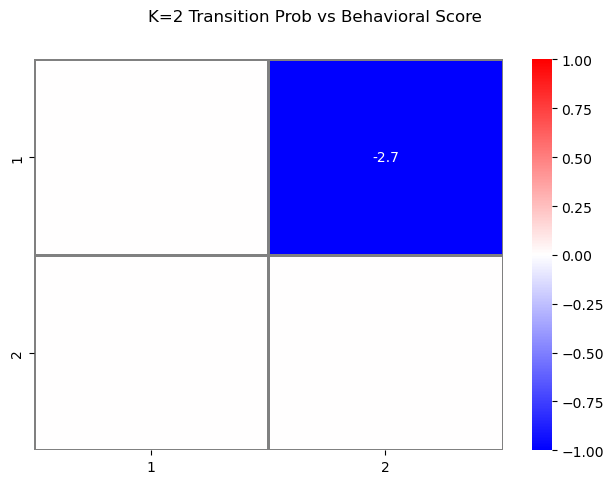

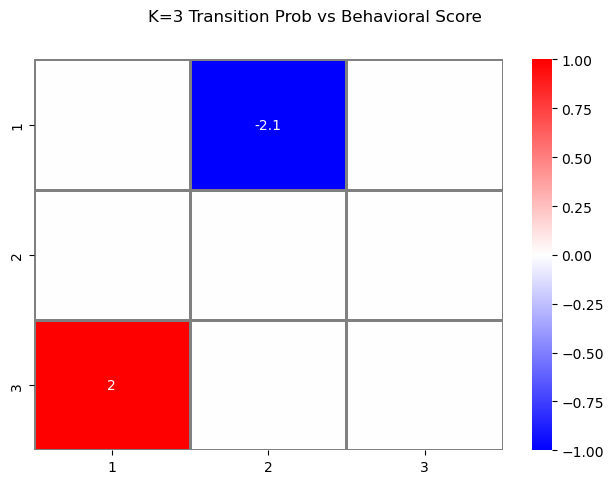

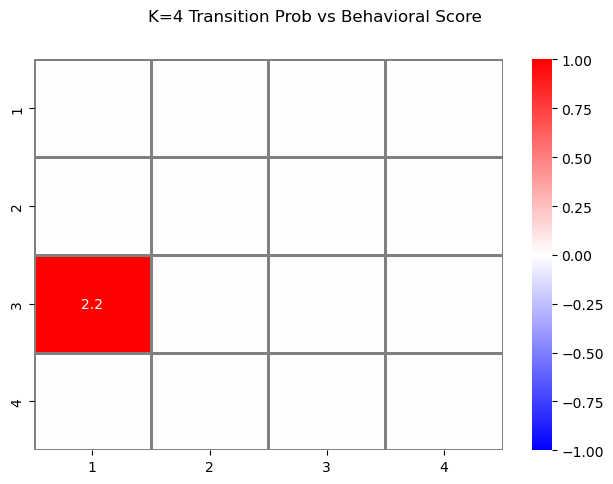

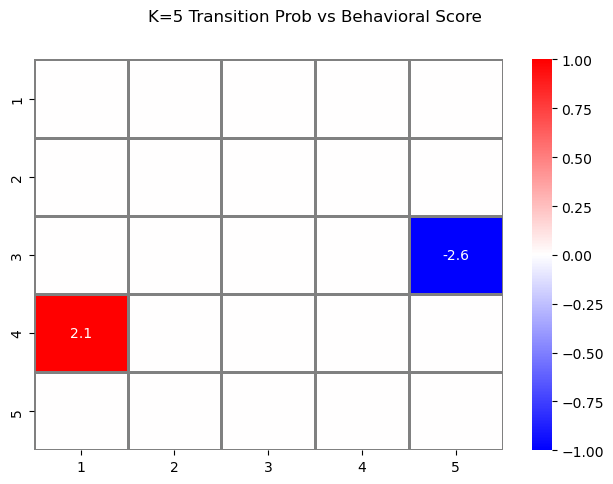

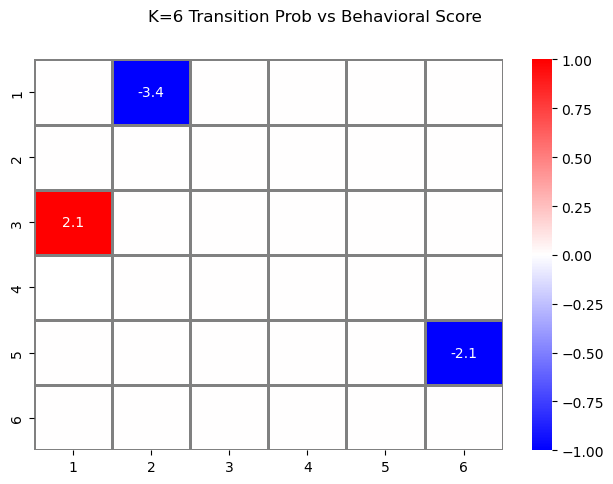

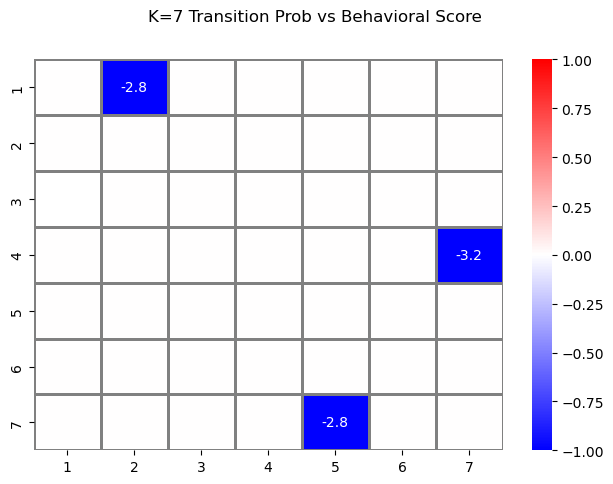

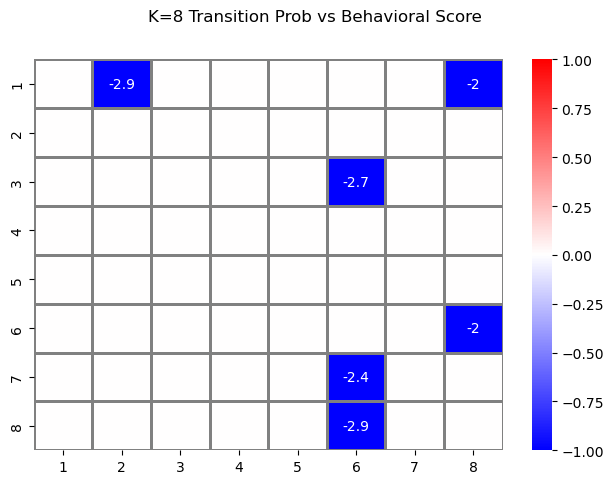

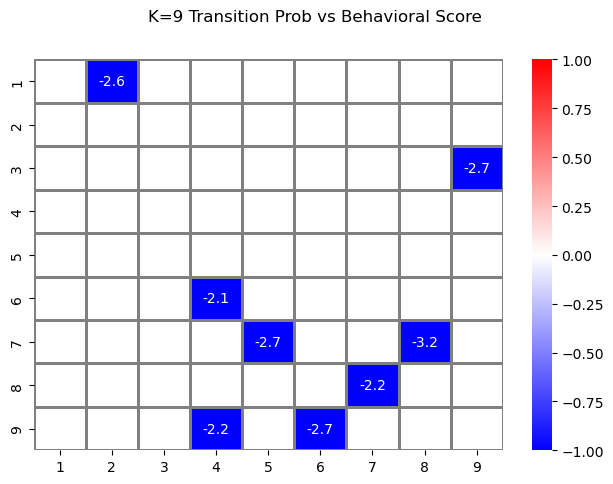

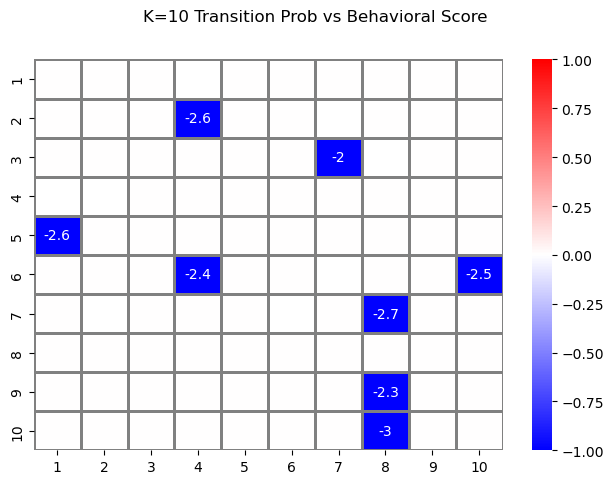

In [45]:
%%time

n_rep= 5000

cov_df = pd.read_csv("../data/covariates/covariates.csv",delimiter=",")
age_B = cov_df.loc[classif.loc[classif['CLASS']=='B'].index]['Age'].values
age_NB = cov_df.loc[classif.loc[classif['CLASS']=='NB'].index]['Age'].values
tstroke_B = cov_df.loc[classif.loc[classif['CLASS']=='B'].index]['Time since stroke (months)'].values
tstroke_NB = cov_df.loc[classif.loc[classif['CLASS']=='NB'].index]['Time since stroke (months)'].values
# age_B, age_NB, tstroke_B, tstroke_NB

B_behav = []
NB_behav = []

class_vals = classif['CLASS'].values
Behav = classif['CLASS'].values

res = classif['Average % correct task'].values[:19]
res = [float(r) for r in res]
for i,r in enumerate(res):
    if class_vals[i]=='B': 
        B_behav.append(r)
    elif class_vals[i]=='NB':
        NB_behav.append(r)

behav = []
behav.append(B_behav)
behav.append(NB_behav)

behavs = behav[0] + behav[1]
age = list(age_B) + list(age_NB)
tstroke = list(tstroke_B) + list(tstroke_NB)



for i,K in enumerate(range(2,10+1)): # Loop over K
    state_names = [i+1 for i in range(K)]
    prob_trans_list = prob_trans_list_allK[i]

    pat_prob_trans = np.concatenate((prob_trans_list[1], prob_trans_list[2])) # Only patients, no controls
    print(pat_prob_trans.shape)
    
    corr_matrix = np.zeros(pat_prob_trans.shape[1:])
    p_matrix = np.zeros(pat_prob_trans.shape[1:])
    x = B_behav + NB_behav

    for i in range(K):
        for j in range(K):
            y = pat_prob_trans[:,i,j]
            my_df = pd.DataFrame.from_dict({'behav':x, 'prob':pat_prob_trans[:,i,j], 'age':age, 'tstroke':tstroke})
            stat, p_val = two_dim_par_corr_fullstat(my_df['behav'].values, my_df['prob'].values, my_df['age'].values, my_df['tstroke'].values, n_rep)
            # print(stat, p_val)
            corr_matrix[i,j] = stat
            p_matrix[i,j] = p_val
    print(corr_matrix)
    print(p_matrix)
    
            
    fig, ax = plt.subplots(1)
    my_sup = plt.suptitle('K='+str(K)+' Transition Prob vs Behavioral Score', y=1)
    
    # display only significative values
    for i in range(K):
        for j in range(K):
            if p_matrix[i][j]>=0.05:
                corr_matrix[i][j]=0
    
    sns.heatmap(corr_matrix, linewidth=0.8, xticklabels=state_names, yticklabels=state_names, cmap='bwr', annot=True,
                ax=ax, vmin=-1, vmax=1, linecolor='grey');
    for t in ax.texts:
        if float(t.get_text())!=0:
            t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
        else:
            t.set_text("") # if not it sets an empty text
    
    plt.tight_layout()

    plt.savefig('output/MD_05122023_noclustfilt/K'+str(K)+'/TransProbVsBehav_Cov_K'+str(K)+'_nrep_test_'+str(n_rep)+'.png',
            dpi=200)
